# Data Analysis Using Python: A Beginner’s Guide Featuring NYC Open Data  
## Part 3: Plotting and Data Visualization in Python

Mark Bauer

Table of Contents
=================

   * [1. Importing Libraries](##-1.-Importing-Libraries)
       
       
   * [2. Merging Datasets](#-2.-Merging-Datasets)
       * [2.1 Building Footprints Dataset](##-2.1-Building-Footprints-Dataset)
       * [2.2 Pluto Dataset](##-2.2-Pluto-Dataset)
       
       
   * [3. Seaborn Library](#3-Seaborn-Library)
       * [3.1 Distribution Plots](##-3.1-Plotting-Univariate-Distributions)
           * [3.1.1 Histograms](###-3.1.2-Histograms)
           * [3.1.2 Kernel Density Estimate (KDE) Plot](###-3.1.3-Kernel-Density-Estimate-%28KDE%29-Plot)
           * [3.1.3 Empirical Cumulative Distribution Functions (ECDF)](###-3.1.4-Empirical-Cumulative-Distribution-Functions-%28ECDF%29)
           * [3.1.4 Distribution Plots onto a Facet Grid](###-4.3.4-Distribution-Plots-onto-a-Facet-Grid)
       * [3.2 Relational Plots](###-3.2-Relational-Plots)
           * [3.2.1 Line Plots](###-3.2.1-Line-Plots)
           * [3.2.2 Scatter Plot](###-3.2.2-Scatter-Plot) 
           * [3.2.3 Relational Plots onto a Facet Grid](###-3.2.3-Relational-Plots-onto-a-Facet-Grid)
       * [3.3 Joint Grids](##-4.3-Joint-Grids) 
           * [3.3.1 Scatter Plot](###-3.3.1-Scatter-Plot)
           * [3.3.2 Hexagonal Bin Plots](###-3.3.2-Hexagonal-Bin-Plots)  
           * [3.3.3 Kernel Density Estimate (KDE) Plot](###-3.3.4-Kernel-Density-Estimate-%28KDE%29-Plot)
       * [3.4 Visualizing Pairwise Relationships in a Dataset](##-3.4-Visualizing-Pairwise-Relationships-in-a-Dataset)
       * [3.5 Heat Map](##-3.5-Heat-Map)
       * [3.6 Categorial Plots](##-3.6-Categorial-Plots)
           * [3.6.1 Count Plots](###3.6.1-Count-Plots)
           * [3.6.2 Bar Plots](###-3.6.2-Bar-Plots)
           * [3.6.3 Scatter Plots](###3.6.3-Scatter-Plots)
           * [3.6.4 Swarm Plots](###-3.6.4-Swarm-Plots)
           * [3.6.5 Box Plots](###-3.6.5-Box-Plots)
           * [3.6.6 Boxen Plots](###-3.6.6-Boxen-Plots)
           * [3.6.7 Violin Plots](###-3.6.7-Violin-Plots)
           * [3.6.8 Point Plots](###-3.6.8-Point-Plots)
           * [3.6.9 Facets](###3.6.9-Facets)  
   
   
   * [4. pandas and Matplotlib Libraries](#4-Pandas-and-Matplotlib-Libraries)
       * [4.1 Line Plot](##-4.1-Line-Plot)
       * [4.2 Bar Plot](##-4.2-Bar-Plot)
       * [4.3 Histogram](##-4.3-Histogram)
       * [4.4 Box Plot](##-4.4-Box-Plot)
       * [4.5 Kernel Density Estimate (KDE) Plot](##-4.5-Kernel-Density-Estimate-%28KDE%29-Plot)
       * [4.6 Area Plot](##-4.6-Area-Plot)
       * [4.7 Scatter Plot](##-4.7-Scatter-Plot)
       * [4.8 Hexagonal Bin Plot](##-4.8-Hexagonal-Bin-Plot)
       * [4.9 Pie Plot](##-4.9-Pie-Plot)
       
       
   * [5. Conclusion](#-4.-Conclusion)

**Goal:** In this notebook, we will review various examples of plotting and data visualizations.

**Main Libraries:** 

[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language.

[Matplotlib](https://matplotlib.org/3.1.1/index.html#) is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

[Seaborn](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

# Datasets

## Building Footprints  
https://data.cityofnewyork.us/Housing-Development/Building-Footprints/nqwf-w8eh

![building-footprints](images/building-footprints.png)


## PLUTO  
https://data.cityofnewyork.us/City-Government/Primary-Land-Use-Tax-Lot-Output-Map-MapPLUTO-/f888-ni5f

![pluto](images/pluto.png)

# 1. Importing Libraries

In [1]:
# importing libraries
import pandas as pd # the pd is by convention
import numpy as np # as is the np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter
import seaborn as sns
from scipy import stats
import requests
import os
from io import BytesIO
import zipfile
from zipfile import ZipFile

%matplotlib inline
sns.set(color_codes=True)

In [2]:
# Printing verions of Python modules and packages with **watermark** - the IPython magic extension.

%reload_ext watermark

%watermark -v -p numpy,pandas,matplotlib.pyplot,seaborn

CPython 3.7.1
IPython 7.18.1

numpy 1.19.2
pandas 1.0.0
matplotlib.pyplot 3.3.2
seaborn 0.11.0


# 2. Merging Datasets

## Building Footprints Dataset

In [3]:
# setting the link of our data (a static csv file) as the name 'url'
url = 'https://data.cityofnewyork.us/api/views/3k9s-uj93/rows.csv?accessType=DOWNLOAD'

# reading in our data as a pandas dataframe and setting the name to'building_footprints'
building_footprints = pd.read_csv(url)

In [4]:
# previewing the first five rows of our dataframe
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,SHAPE_AREA,SHAPE_LEN,BASE_BBL,MPLUTO_BBL,GEOMSOURCE
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,854.662433,125.079796,3.044521e+09,3.044521e+09,Photogramm
1,NaN,MULTIPOLYGON (((-73.87670970144625 40.71425234...,1930.0,4548330,08/17/2017 12:00:00 AM +0000,Constructed,1226227,10.360000,5110.0,122.0,217.594243,60.225858,4.030640e+09,4.030640e+09,Photogramm
2,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,946.427476,123.141941,4.139430e+09,4.139430e+09,Photogramm
3,NaN,MULTIPOLYGON (((-73.94029215265738 40.64108287...,1920.0,3355684,08/17/2017 12:00:00 AM +0000,Constructed,858061,11.200000,5110.0,32.0,248.678169,63.940817,3.049720e+09,3.049720e+09,Photogramm
4,NaN,MULTIPOLYGON (((-73.98998983552244 40.62383804...,1915.0,3131737,08/22/2017 12:00:00 AM +0000,Constructed,568078,24.980000,2100.0,44.0,1163.227669,165.608763,3.055100e+09,3.055100e+09,Photogramm


In [5]:
# previewing the last five rows of our dataframe
building_footprints.tail()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,SHAPE_AREA,SHAPE_LEN,BASE_BBL,MPLUTO_BBL,GEOMSOURCE
1084841,NaN,MULTIPOLYGON (((-73.8178373656331 40.704412200...,2019.0,4618904,10/29/2020 12:00:00 AM +0000,Constructed,1293334,65.5000,2100.0,65.0,4523.845916,293.362091,4.096230e+09,4.096230e+09,Other (Man
1084842,NaN,MULTIPOLYGON (((-74.00055035283783 40.57783501...,2020.0,3426146,10/29/2020 12:00:00 AM +0000,Constructed,1293333,NaN,2100.0,NaN,14259.366307,555.228907,3.069790e+09,NaN,Other (Man
1084843,NaN,MULTIPOLYGON (((-73.84680270540609 40.67093100...,1935.0,4245997,10/30/2020 12:00:00 AM +0000,Constructed,375849,32.2428,2100.0,19.0,1136.360187,170.724237,4.114030e+09,4.114030e+09,Photogramm
1084844,NaN,MULTIPOLYGON (((-73.89856964703094 40.85105824...,NaN,2128749,10/30/2020 12:00:00 AM +0000,Marked for Construction,1293335,60.0000,5100.0,39.0,15539.719611,652.843742,2.030290e+09,NaN,Other (Man
1084845,NaN,MULTIPOLYGON (((-74.08478080978368 40.61821218...,NaN,5170701,10/30/2020 12:00:00 AM +0000,Marked for Construction,1293337,60.0000,5100.0,66.0,23308.664648,816.755069,5.006350e+09,NaN,Other (Man


In [6]:
# printing the shape or dimensions of our dataframe (i.e. rows, columns)
building_footprints.shape

(1084846, 15)

In [7]:
# printing the column names, non-null counts, and data types of our columns
building_footprints.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1084846 entries, 0 to 1084845
Data columns (total 15 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   NAME        1752 non-null     object 
 1   the_geom    1084846 non-null  object 
 2   CNSTRCT_YR  1079958 non-null  float64
 3   BIN         1084846 non-null  int64  
 4   LSTMODDATE  1084846 non-null  object 
 5   LSTSTATYPE  1084658 non-null  object 
 6   DOITT_ID    1084846 non-null  int64  
 7   HEIGHTROOF  1082179 non-null  float64
 8   FEAT_CODE   1084837 non-null  float64
 9   GROUNDELEV  1084317 non-null  float64
 10  SHAPE_AREA  1084846 non-null  float64
 11  SHAPE_LEN   1084846 non-null  float64
 12  BASE_BBL    1084844 non-null  float64
 13  MPLUTO_BBL  1084221 non-null  float64
 14  GEOMSOURCE  1084630 non-null  object 
dtypes: float64(8), int64(2), object(5)
memory usage: 124.2+ MB


In [8]:
# printing descriptive statistics of our numeric columns in our data
building_footprints.describe()

,CNSTRCT_YR,BIN,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,SHAPE_AREA,SHAPE_LEN,BASE_BBL,MPLUTO_BBL
count,1.079958e+06,1.084846e+06,1.084846e+06,1.082179e+06,1.084837e+06,1.084317e+06,1.084846e+06,1.084846e+06,1.084844e+06,1.084221e+06
mean,1.946657e+03,3.710226e+06,5.910423e+05,2.755034e+01,2.698524e+03,5.509812e+01,1.596756e+03,1.553136e+02,3.562041e+09,3.561881e+09
std,1.924411e+04,1.026802e+06,3.593515e+05,2.132425e+01,1.202239e+03,4.150903e+01,5.600703e+03,1.271395e+02,9.860564e+08,9.860786e+08
min,0.000000e+00,1.000002e+06,1.000000e+00,0.000000e+00,0.000000e+00,-1.400000e+01,3.247526e+01,2.373699e+01,3.064269e+06,3.064269e+06
25%,1.920000e+03,3.128620e+06,2.865895e+05,1.834171e+01,2.100000e+03,2.500000e+01,6.521295e+02,1.096958e+02,3.043190e+09,3.043170e+09
50%,1.930000e+03,4.066854e+06,5.733425e+05,2.610000e+01,2.100000e+03,4.600000e+01,9.572688e+02,1.379232e+02,4.019300e+09,4.019270e+09
75%,1.955000e+03,4.481760e+06,8.616878e+05,3.110000e+01,2.100000e+03,7.400000e+01,1.320357e+03,1.644512e+02,4.106720e+09,4.106690e+09
max,1.999998e+07,5.799523e+06,1.293337e+06,1.550000e+03,5.110000e+03,5.560000e+02,1.171874e+06,2.001729e+04,6.000000e+09,6.000000e+09


In [9]:
# printing number of rows in dataframe
print(len(building_footprints))

1084846


In [10]:
# summing null/na values in the 'CNSTRCT_YR' column
building_footprints['MPLUTO_BBL'].isna().sum()

625

In [11]:
building_footprints = building_footprints.dropna(subset=['MPLUTO_BBL'])

# summing null/na values in the 'CNSTRCT_YR' column
building_footprints['MPLUTO_BBL'].isna().sum()

0

In [12]:
# casting our 'CNSTRCT_YR' column as an integer datatype
building_footprints.astype({'MPLUTO_BBL': 'int64'}).dtypes

NAME           object
the_geom       object
CNSTRCT_YR    float64
BIN             int64
LSTMODDATE     object
LSTSTATYPE     object
DOITT_ID        int64
HEIGHTROOF    float64
FEAT_CODE     float64
GROUNDELEV    float64
SHAPE_AREA    float64
SHAPE_LEN     float64
BASE_BBL      float64
MPLUTO_BBL      int64
GEOMSOURCE     object
dtype: object

## PLUTO Dataset

In [13]:
# setting the PLUTO dataset link as 'url'
url = 'https://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyc_pluto_20v1_csv.zip'

# reading in our zipfile data in-memory
content = requests.get(url)
zf = ZipFile(BytesIO(content.content))

# printing files in our zipfile
for item in zf.namelist():
    print("File in zip: "+ item)

File in zip: pluto_20v1.csv
File in zip: PLUTODD20v1.pdf
File in zip: PlutoReadme20v1.pdf


In [14]:
# read our csv data into a dataframe from our zipfile
pluto_data = pd.read_csv(zf.open('pluto_20v1.csv'))

# previewing the first five rows of our pluto data 
pluto_data.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (17,18,20,22) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,borough,block,lot,cd,ct2010,cb2010,schooldist,council,zipcode,firecomp,...,dcasdate,zoningdate,landmkdate,basempdate,masdate,polidate,edesigdate,geom,dcpedited,notes
0,BK,834,46,307.0,106.0,2001.0,20.0,38.0,11220.0,L114,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0106000020E61000000100000001030000000100000005...,NaN,NaN
1,QN,4042,106,407.0,929.0,3000.0,25.0,19.0,11356.0,E297,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0106000020E61000000100000001030000000100000007...,NaN,NaN
2,BK,4679,17,317.0,866.0,3002.0,18.0,41.0,11203.0,L174,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0106000020E61000000100000001030000000100000006...,NaN,NaN
3,BK,7831,6,318.0,676.0,1002.0,22.0,46.0,11234.0,L159,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0106000020E61000000100000001030000000100000005...,NaN,NaN
4,BK,7831,7,318.0,676.0,1002.0,22.0,46.0,11234.0,L159,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0106000020E61000000100000001030000000100000005...,NaN,NaN


In [15]:
# printing the shape or dimensions of our dataframe (i.e. rows, columns)
pluto_data.shape

(859172, 99)

In [16]:
# printing the column names and their non-null count and data types 
pluto_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 859172 entries, 0 to 859171
Data columns (total 99 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   borough               859171 non-null  object 
 1   block                 859172 non-null  int64  
 2   lot                   859172 non-null  int64  
 3   cd                    858186 non-null  float64
 4   ct2010                858186 non-null  float64
 5   cb2010                858186 non-null  float64
 6   schooldist            857481 non-null  float64
 7   council               858185 non-null  float64
 8   zipcode               857449 non-null  float64
 9   firecomp              857464 non-null  object 
 10  policeprct            857473 non-null  float64
 11  healtharea            857474 non-null  float64
 12  sanitboro             857270 non-null  float64
 13  sanitsub              857150 non-null  object 
 14  address               858772 non-null  object 
 15  

In [17]:
# printing the columns 
pluto_data.columns

Index(['borough', 'block', 'lot', 'cd', 'ct2010', 'cb2010', 'schooldist',
       'council', 'zipcode', 'firecomp', 'policeprct', 'healtharea',
       'sanitboro', 'sanitsub', 'address', 'zonedist1', 'zonedist2',
       'zonedist3', 'zonedist4', 'overlay1', 'overlay2', 'spdist1', 'spdist2',
       'spdist3', 'ltdheight', 'splitzone', 'bldgclass', 'landuse',
       'easements', 'ownertype', 'ownername', 'lotarea', 'bldgarea', 'comarea',
       'resarea', 'officearea', 'retailarea', 'garagearea', 'strgearea',
       'factryarea', 'otherarea', 'areasource', 'numbldgs', 'numfloors',
       'unitsres', 'unitstotal', 'lotfront', 'lotdepth', 'bldgfront',
       'bldgdepth', 'ext', 'proxcode', 'irrlotcode', 'lottype', 'bsmtcode',
       'assessland', 'assesstot', 'exempttot', 'yearbuilt', 'yearalter1',
       'yearalter2', 'histdist', 'landmark', 'builtfar', 'residfar', 'commfar',
       'facilfar', 'borocode', 'bbl', 'condono', 'tract2010', 'xcoord',
       'ycoord', 'latitude', 'longitude', '

In [18]:
# saving only the columns we want in our dataframe
pluto_data = pluto_data[['borough', 'block', 'lot', 'cd', 'ct2010', 'cb2010', 'schooldist',
       'council', 'zipcode', 'firecomp', 'policeprct', 'healtharea',
       'bldgclass', 'landuse',
       'ownertype', 
       'facilfar', 'borocode', 'bbl', 'tract2010', 'xcoord',
       'ycoord', 'latitude', 'longitude',
       'plutomapid',
       'sanitdistrict', 'healthcenterdistrict', 'firm07_flag', 'pfirm15_flag']]

In [19]:
# printing first five rows of dataframe
pluto_data.head()

,borough,block,lot,cd,ct2010,cb2010,schooldist,council,zipcode,firecomp,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,BK,834,46,307.0,106.0,2001.0,20.0,38.0,11220.0,L114,...,106.0,982211.0,171707.0,40.637972,-74.007347,1,7.0,39.0,NaN,NaN
1,QN,4042,106,407.0,929.0,3000.0,25.0,19.0,11356.0,E297,...,929.0,1026895.0,225880.0,40.786562,-73.846003,1,7.0,43.0,NaN,NaN
2,BK,4679,17,317.0,866.0,3002.0,18.0,41.0,11203.0,L174,...,866.0,1004527.0,177269.0,40.653216,-73.926923,1,17.0,35.0,NaN,NaN
3,BK,7831,6,318.0,676.0,1002.0,22.0,46.0,11234.0,L159,...,676.0,1004804.0,166580.0,40.623876,-73.925958,1,18.0,35.0,NaN,NaN
4,BK,7831,7,318.0,676.0,1002.0,22.0,46.0,11234.0,L159,...,676.0,1004784.0,166579.0,40.623874,-73.926030,1,18.0,35.0,NaN,NaN


In [20]:
# printing the column names and their non-null count and data types 
pluto_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 859172 entries, 0 to 859171
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   borough               859171 non-null  object 
 1   block                 859172 non-null  int64  
 2   lot                   859172 non-null  int64  
 3   cd                    858186 non-null  float64
 4   ct2010                858186 non-null  float64
 5   cb2010                858186 non-null  float64
 6   schooldist            857481 non-null  float64
 7   council               858185 non-null  float64
 8   zipcode               857449 non-null  float64
 9   firecomp              857464 non-null  object 
 10  policeprct            857473 non-null  float64
 11  healtharea            857474 non-null  float64
 12  bldgclass             858772 non-null  object 
 13  landuse               856169 non-null  float64
 14  ownertype             31873 non-null   object 
 15  

In [21]:
# printing first five rows of only the columns 'plutomapid' and 'bbl'
pluto_data[['plutomapid', 'bbl']].head()

,plutomapid,bbl
0,1,3008340046
1,1,4040420106
2,1,3046790017
3,1,3078310006
4,1,3078310007


In [22]:
# joining/merging the pluto data with the building footprints data and saving as a new dataframe
building_footprints = building_footprints.merge(pluto_data, left_on='MPLUTO_BBL', right_on='bbl')

In [23]:
# previewing first five rows
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,...,1070.0,1019957.0,178731.0,40.657180,-73.871307,1,5.0,33.0,NaN,NaN
1,NaN,MULTIPOLYGON (((-73.87670970144625 40.71425234...,1930.0,4548330,08/17/2017 12:00:00 AM +0000,Constructed,1226227,10.360000,5110.0,122.0,...,65703.0,1018381.0,199532.0,40.714280,-73.876882,1,5.0,46.0,NaN,NaN
2,NaN,MULTIPOLYGON (((-73.87685251191127 40.71426460...,1930.0,4071750,08/22/2017 12:00:00 AM +0000,Constructed,214960,28.240000,2100.0,121.0,...,65703.0,1018381.0,199532.0,40.714280,-73.876882,1,5.0,46.0,NaN,NaN
3,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,NaN,1.0
4,NaN,MULTIPOLYGON (((-73.85165049449266 40.66194039...,1960.0,4460497,08/22/2017 12:00:00 AM +0000,Constructed,796268,32.008371,2100.0,12.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,NaN,1.0


In [24]:
# printing the column names and their non-null count and data types 
building_footprints.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1083622 entries, 0 to 1083621
Data columns (total 43 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   NAME                  1737 non-null     object 
 1   the_geom              1083622 non-null  object 
 2   CNSTRCT_YR            1078892 non-null  float64
 3   BIN                   1083622 non-null  int64  
 4   LSTMODDATE            1083622 non-null  object 
 5   LSTSTATYPE            1083441 non-null  object 
 6   DOITT_ID              1083622 non-null  int64  
 7   HEIGHTROOF            1081031 non-null  float64
 8   FEAT_CODE             1083613 non-null  float64
 9   GROUNDELEV            1083121 non-null  float64
 10  SHAPE_AREA            1083622 non-null  float64
 11  SHAPE_LEN             1083622 non-null  float64
 12  BASE_BBL              1083622 non-null  float64
 13  MPLUTO_BBL            1083622 non-null  float64
 14  GEOMSOURCE            1083410 non-

In [25]:
# printing dimensions (rows and columns) of our data
building_footprints.shape

(1083622, 43)

In [26]:
# previewing first five rows of data
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,...,1070.0,1019957.0,178731.0,40.657180,-73.871307,1,5.0,33.0,NaN,NaN
1,NaN,MULTIPOLYGON (((-73.87670970144625 40.71425234...,1930.0,4548330,08/17/2017 12:00:00 AM +0000,Constructed,1226227,10.360000,5110.0,122.0,...,65703.0,1018381.0,199532.0,40.714280,-73.876882,1,5.0,46.0,NaN,NaN
2,NaN,MULTIPOLYGON (((-73.87685251191127 40.71426460...,1930.0,4071750,08/22/2017 12:00:00 AM +0000,Constructed,214960,28.240000,2100.0,121.0,...,65703.0,1018381.0,199532.0,40.714280,-73.876882,1,5.0,46.0,NaN,NaN
3,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,NaN,1.0
4,NaN,MULTIPOLYGON (((-73.85165049449266 40.66194039...,1960.0,4460497,08/22/2017 12:00:00 AM +0000,Constructed,796268,32.008371,2100.0,12.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,NaN,1.0


# Analyzing only buildings built between 1945 and 2020

In [27]:
# returning only building built between 1945 and 2020
building_footprints = building_footprints[building_footprints['CNSTRCT_YR'].between(1945, 2020)]

# filling null values with '0'
building_footprints['pfirm15_flag'] = building_footprints['pfirm15_flag'].fillna(value=0)
building_footprints['firm07_flag'] = building_footprints['firm07_flag'].fillna(value=0)
                               
# printing number of rows in data    
print(len(building_footprints))

383415


In [28]:
# previewing first five rows of data
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,...,1070.0,1019957.0,178731.0,40.657180,-73.871307,1,5.0,33.0,0.0,0.0
3,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
4,NaN,MULTIPOLYGON (((-73.85165049449266 40.66194039...,1960.0,4460497,08/22/2017 12:00:00 AM +0000,Constructed,796268,32.008371,2100.0,12.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
5,NaN,MULTIPOLYGON (((-73.85109292802453 40.66243288...,1960.0,4460503,08/22/2017 12:00:00 AM +0000,Constructed,167798,30.720470,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
6,NaN,MULTIPOLYGON (((-73.85300665279054 40.66210254...,1960.0,4460505,08/22/2017 12:00:00 AM +0000,Constructed,75202,30.225970,2100.0,9.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0


In [29]:
# printing dimensions (number of rows, columns) of data
building_footprints.shape

(383415, 43)

# 3. Plotting with Seaborn 

In [30]:
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,...,1070.0,1019957.0,178731.0,40.657180,-73.871307,1,5.0,33.0,0.0,0.0
3,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
4,NaN,MULTIPOLYGON (((-73.85165049449266 40.66194039...,1960.0,4460497,08/22/2017 12:00:00 AM +0000,Constructed,796268,32.008371,2100.0,12.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
5,NaN,MULTIPOLYGON (((-73.85109292802453 40.66243288...,1960.0,4460503,08/22/2017 12:00:00 AM +0000,Constructed,167798,30.720470,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
6,NaN,MULTIPOLYGON (((-73.85300665279054 40.66210254...,1960.0,4460505,08/22/2017 12:00:00 AM +0000,Constructed,75202,30.225970,2100.0,9.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0


In [31]:
building_footprints.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 383415 entries, 0 to 1083620
Data columns (total 43 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   NAME                  867 non-null     object 
 1   the_geom              383415 non-null  object 
 2   CNSTRCT_YR            383415 non-null  float64
 3   BIN                   383415 non-null  int64  
 4   LSTMODDATE            383415 non-null  object 
 5   LSTSTATYPE            383343 non-null  object 
 6   DOITT_ID              383415 non-null  int64  
 7   HEIGHTROOF            381648 non-null  float64
 8   FEAT_CODE             383413 non-null  float64
 9   GROUNDELEV            383130 non-null  float64
 10  SHAPE_AREA            383415 non-null  float64
 11  SHAPE_LEN             383415 non-null  float64
 12  BASE_BBL              383415 non-null  float64
 13  MPLUTO_BBL            383415 non-null  float64
 14  GEOMSOURCE            383323 non-null  object 
 15 

## Distribution Plots

### Histograms

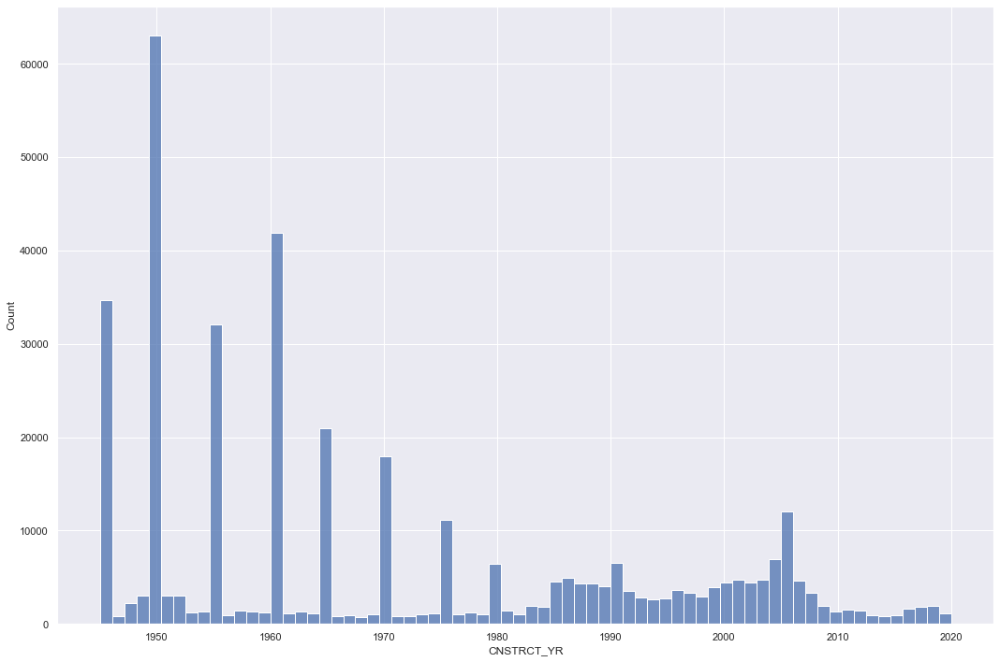

In [32]:
plt.figure(figsize=(15,10))

sns.histplot(building_footprints['CNSTRCT_YR'])

plt.tight_layout()
plt.savefig('figures/3-1-1-a')

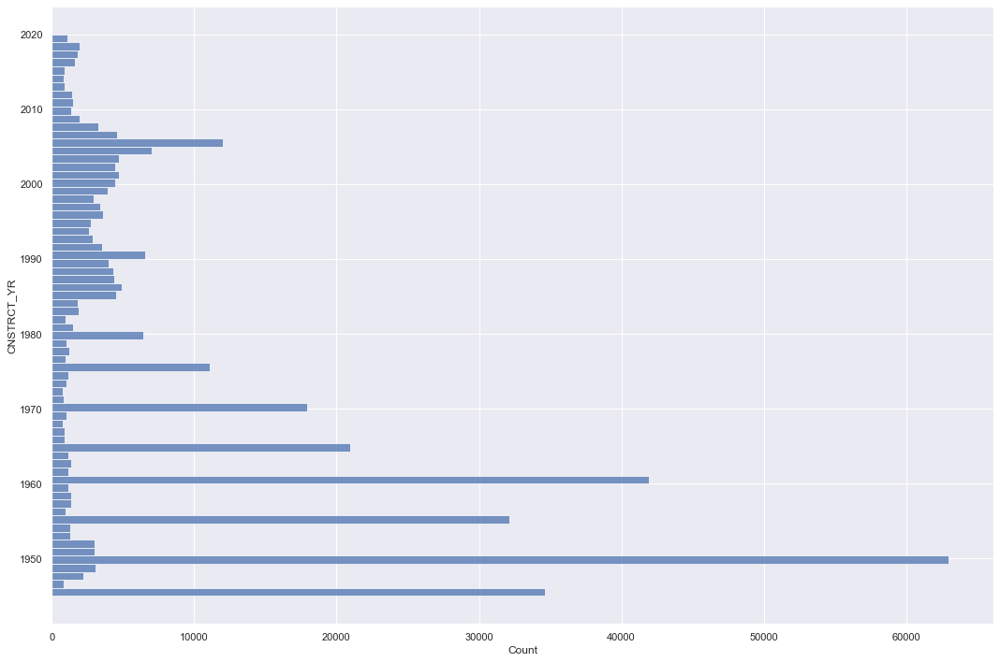

In [33]:
plt.figure(figsize=(15,10))

sns.histplot(y=building_footprints['CNSTRCT_YR'])

plt.tight_layout()
plt.savefig('figures/3-1-1-b')

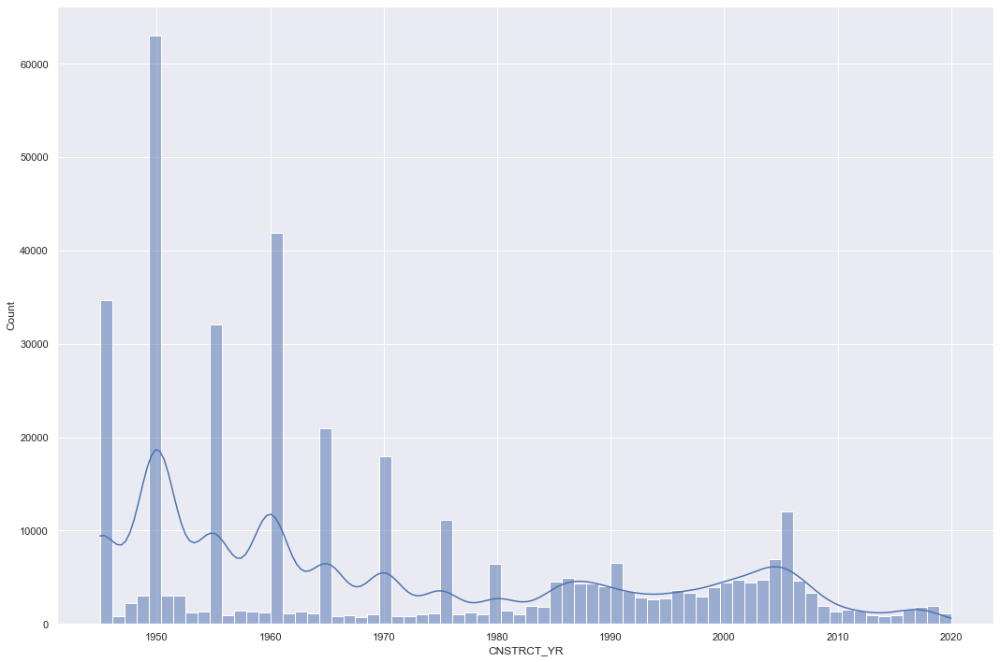

In [34]:
plt.figure(figsize=(15,10))

sns.histplot(building_footprints['CNSTRCT_YR'],
             kde=True)

plt.tight_layout()
plt.savefig('figures/3-1-1-c')

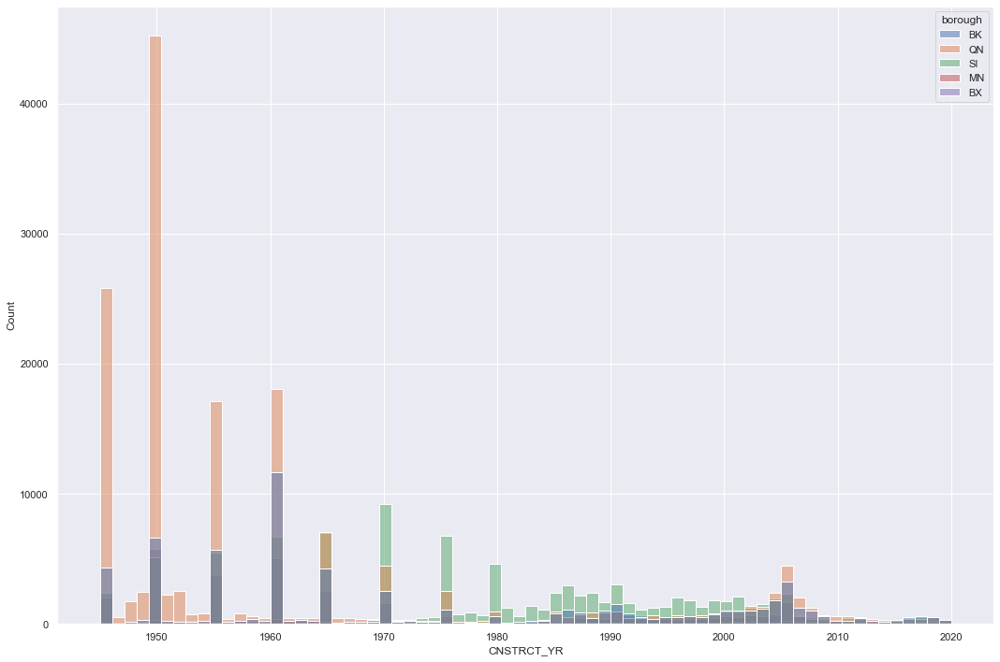

In [35]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints, 
             x='CNSTRCT_YR',
             hue='borough')

plt.tight_layout()
plt.savefig('figures/3-1-1-d')

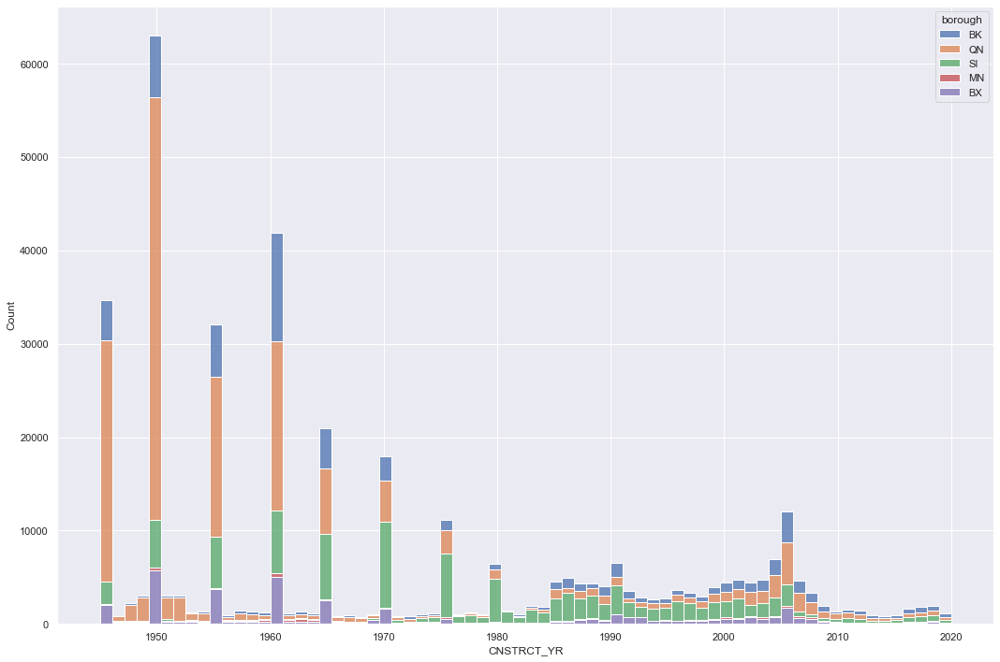

In [36]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints, 
             x='CNSTRCT_YR',
             hue='borough',
             multiple="stack")

plt.tight_layout()
plt.savefig('figures/3-1-1-e')

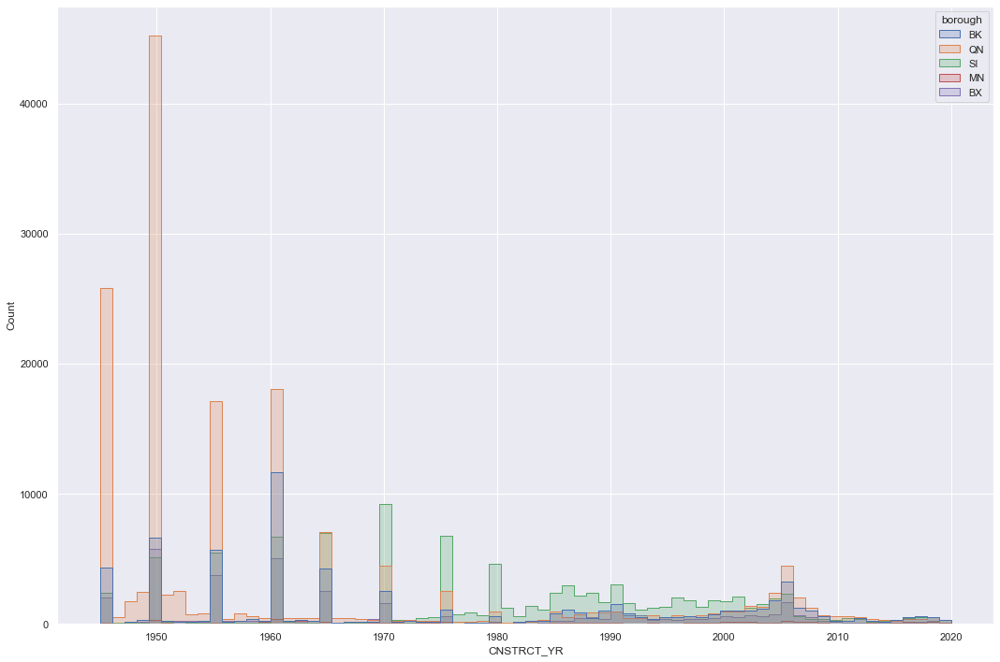

In [37]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints, 
             x='CNSTRCT_YR',
             hue='borough',
             element="step")

plt.tight_layout()
plt.savefig('figures/3-1-1-f')

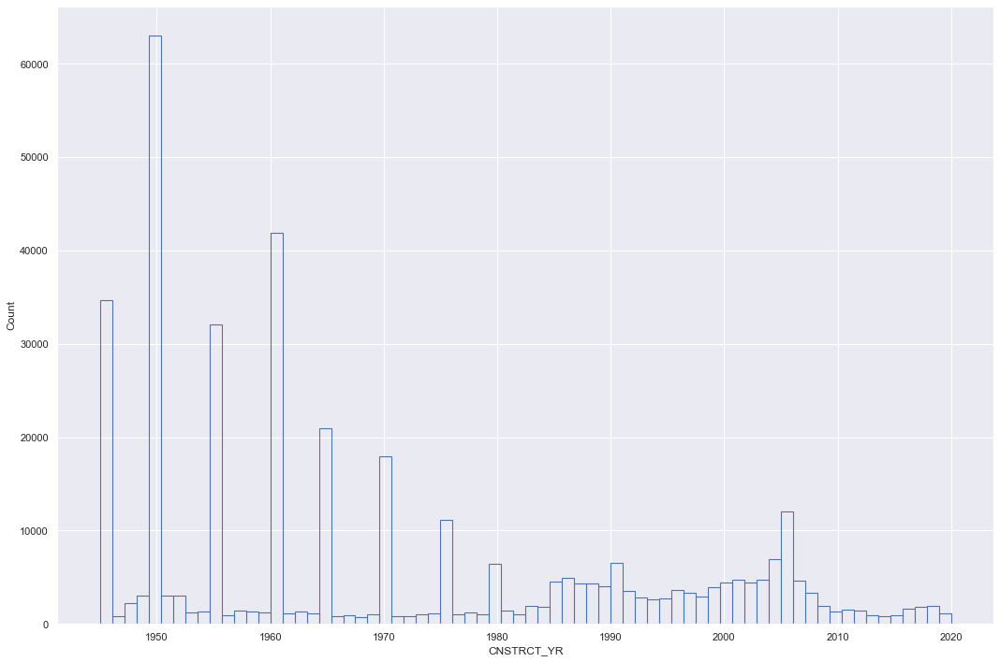

In [38]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints, 
             x='CNSTRCT_YR',
             fill=False)

plt.tight_layout()
plt.savefig('figures/3-1-1-g')

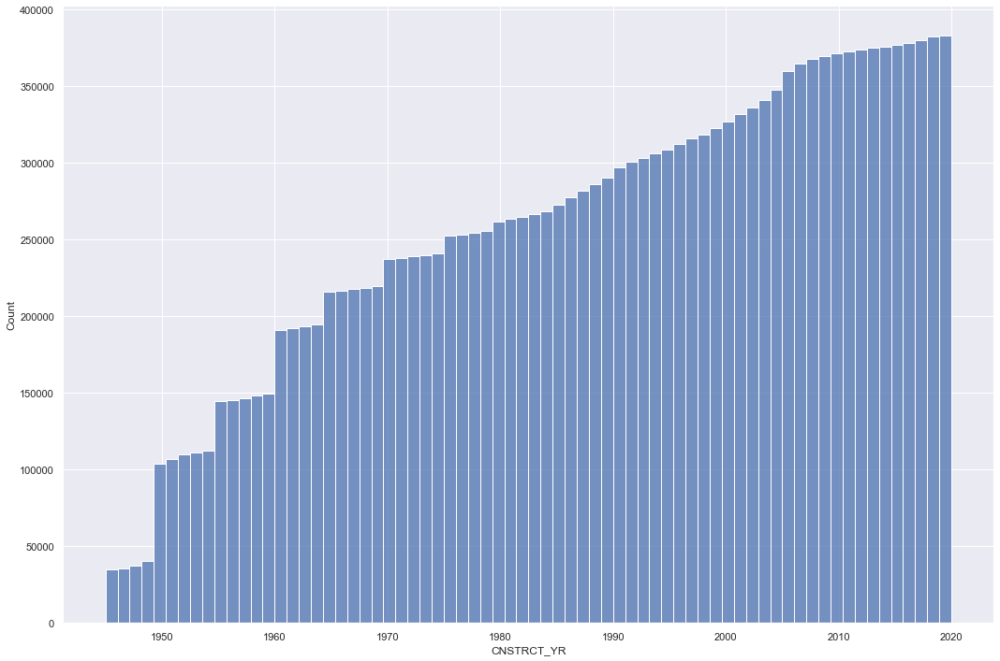

In [39]:
plt.figure(figsize=(15,10))

sns.histplot(building_footprints['CNSTRCT_YR'],
            cumulative=True)

plt.tight_layout()
plt.savefig('figures/3-1-1-h')

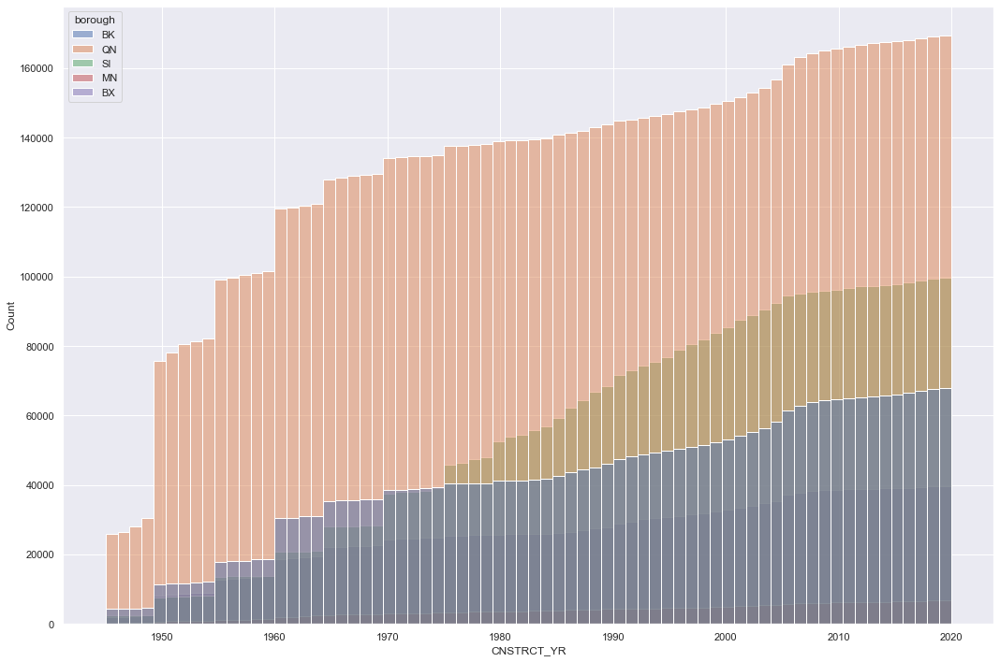

In [40]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints,
             x = 'CNSTRCT_YR',
             hue='borough',
             cumulative=True)

plt.tight_layout()
plt.savefig('figures/3-1-1-i')

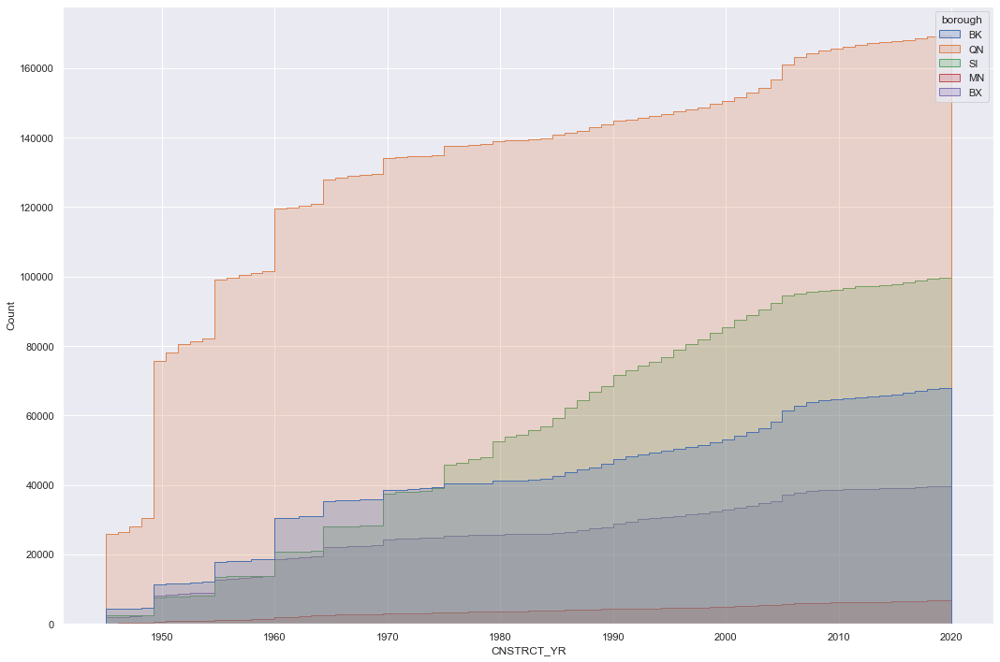

In [41]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints,
             x = 'CNSTRCT_YR',
             hue='borough',
             cumulative=True,
             element="step")

plt.tight_layout()
plt.savefig('figures/3-1-1-j')

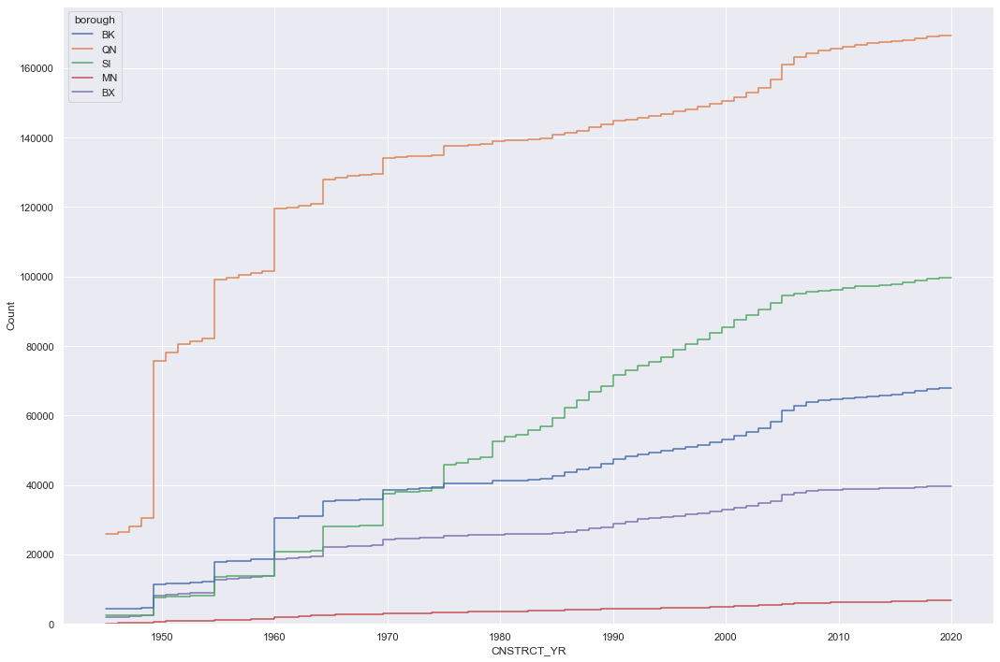

In [42]:
plt.figure(figsize=(15,10))

sns.histplot(data=building_footprints,
             x = 'CNSTRCT_YR',
             hue='borough',
             cumulative=True,
             element="step",
             fill=False)

plt.tight_layout()
plt.savefig('figures/3-1-1-k')

### Kernel Density Estimation (KDE) Plots

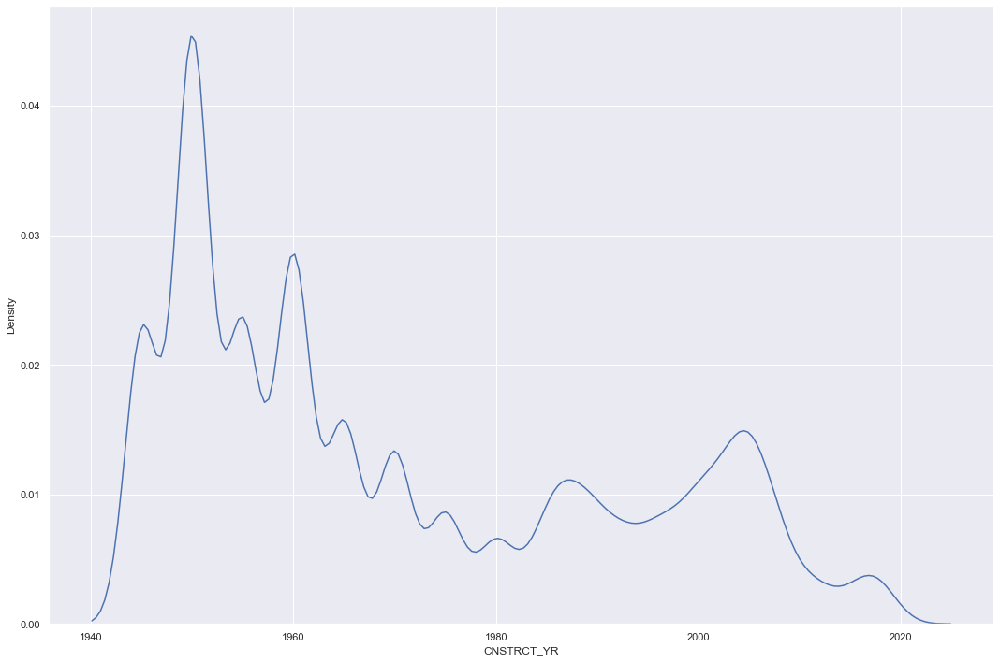

In [43]:
plt.figure(figsize=(15,10))

sns.kdeplot(building_footprints['CNSTRCT_YR'])

plt.tight_layout()
plt.savefig('figures/3-1-2-a')

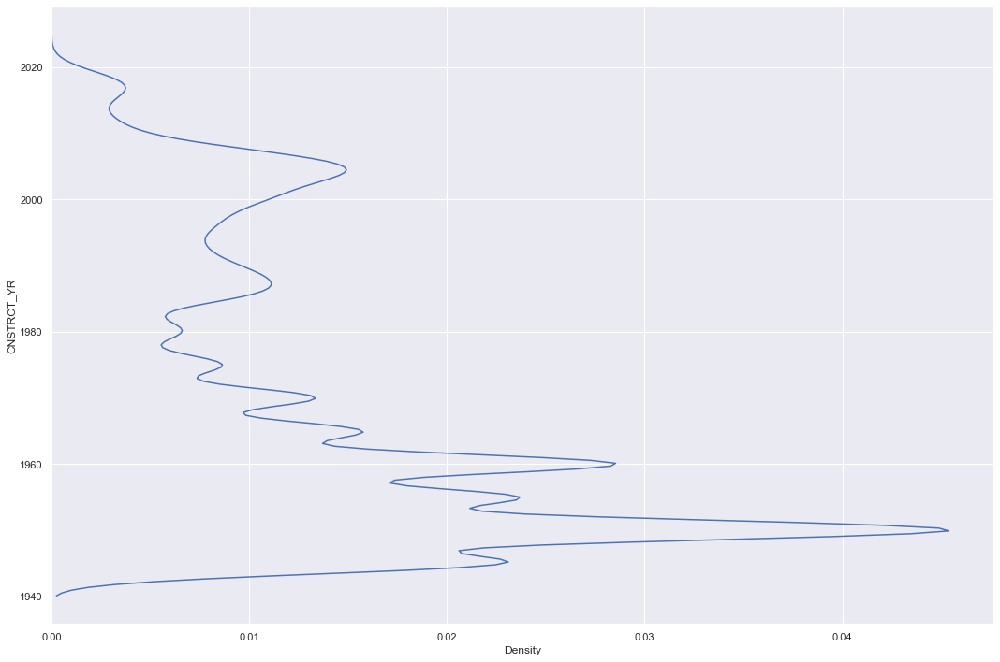

In [44]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            y='CNSTRCT_YR')

plt.tight_layout()
plt.savefig('figures/3-1-2-b')

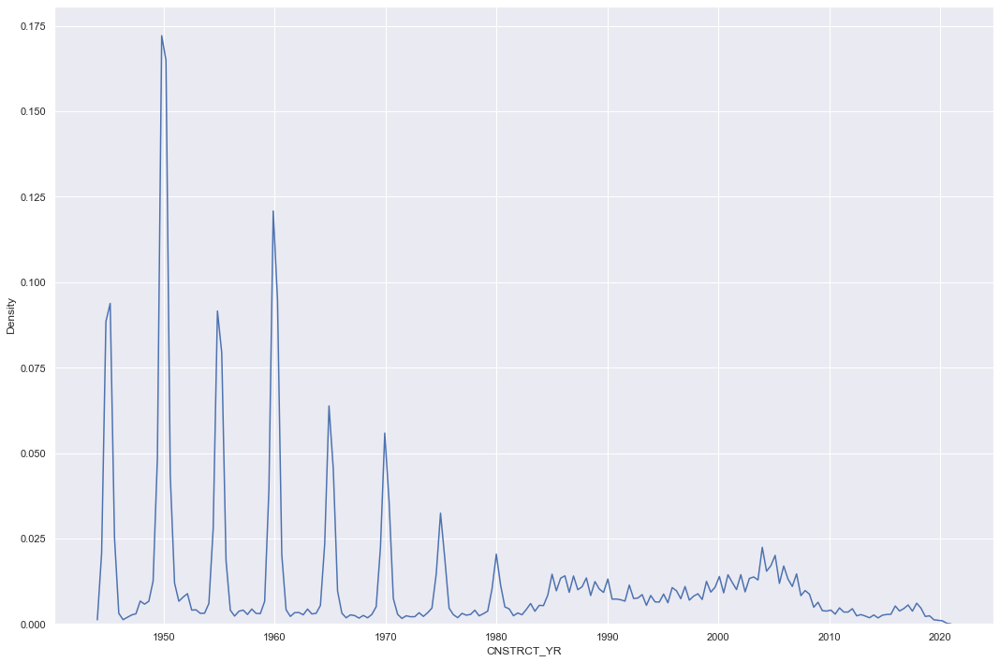

In [45]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            bw_adjust=.2)

plt.tight_layout()
plt.savefig('figures/3-1-2-c')

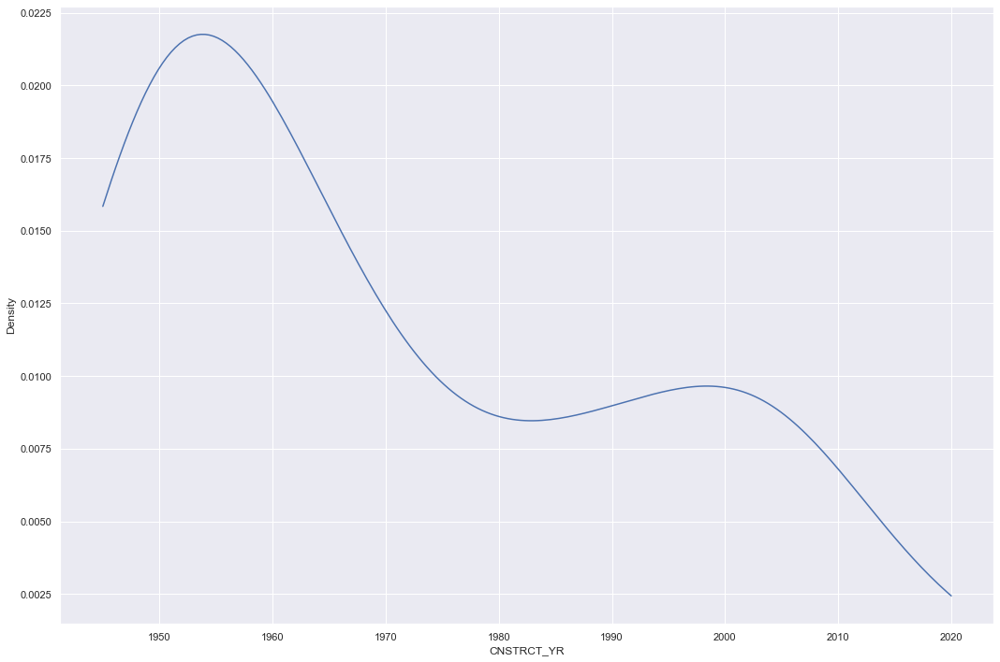

In [46]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            bw_adjust=5, 
            cut=0)

plt.tight_layout()
plt.savefig('figures/3-1-2-d')

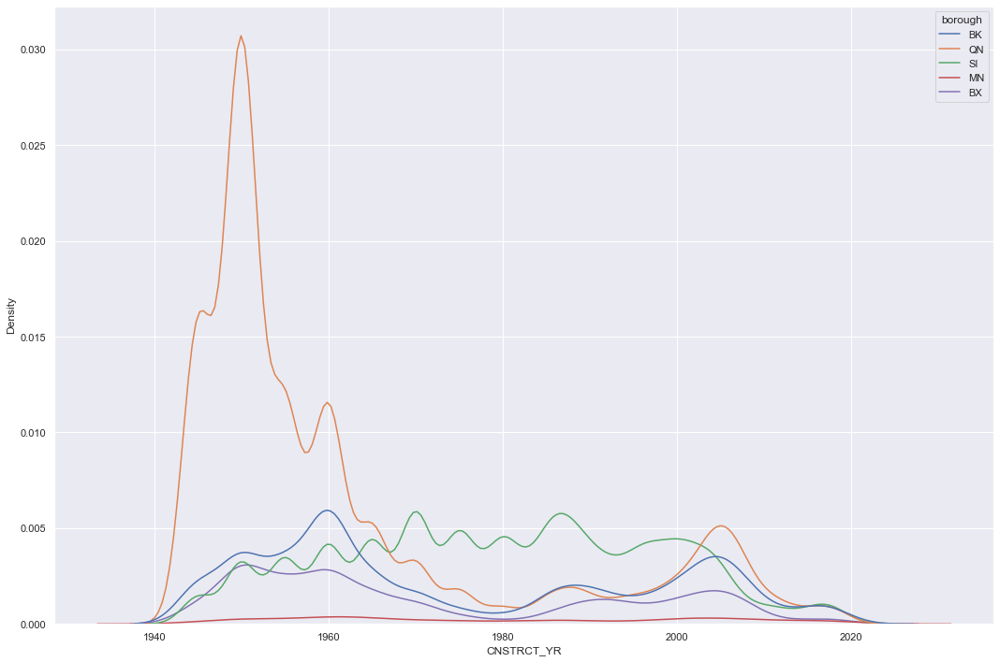

In [47]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            hue='borough')

plt.tight_layout()
plt.savefig('figures/3-1-2-e')

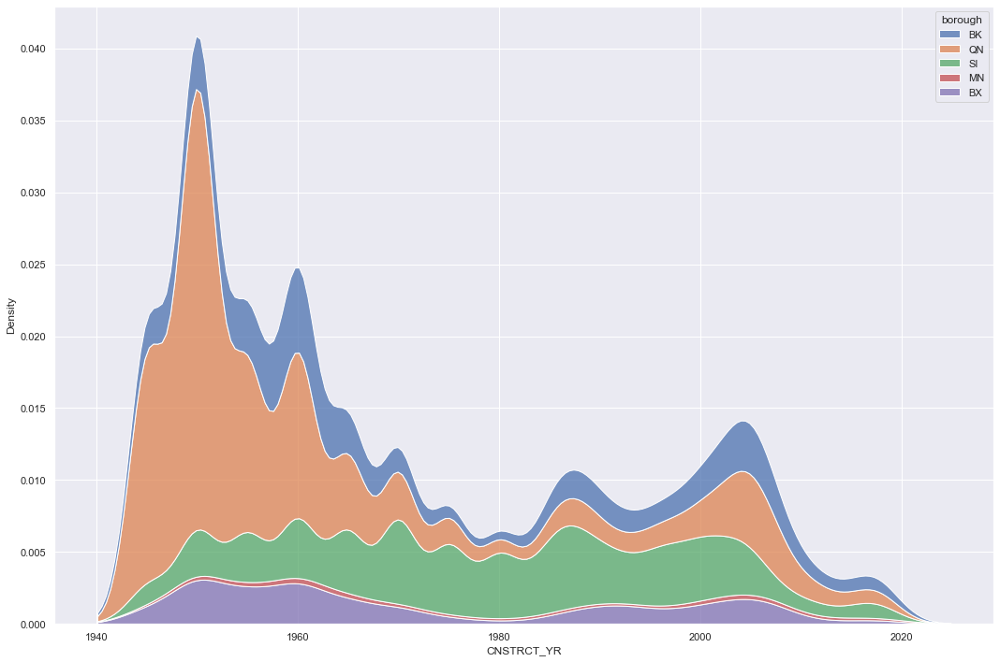

In [48]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            hue='borough', 
            multiple='stack')

plt.tight_layout()
plt.savefig('figures/3-1-2-f')

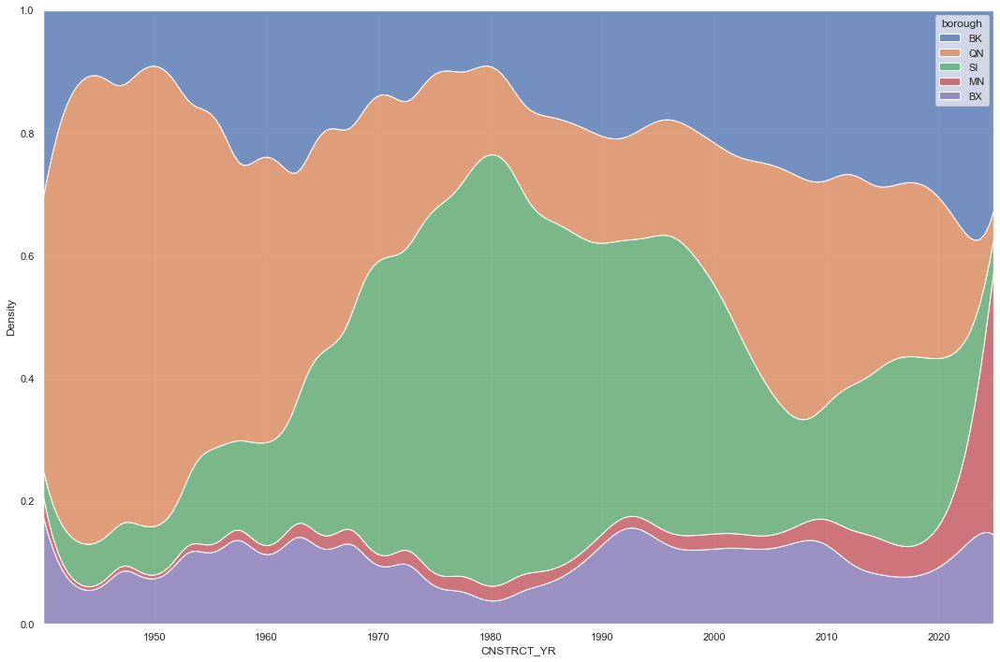

In [49]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            hue='borough', 
            multiple='fill')

plt.tight_layout()
plt.savefig('figures/3-1-2-g')

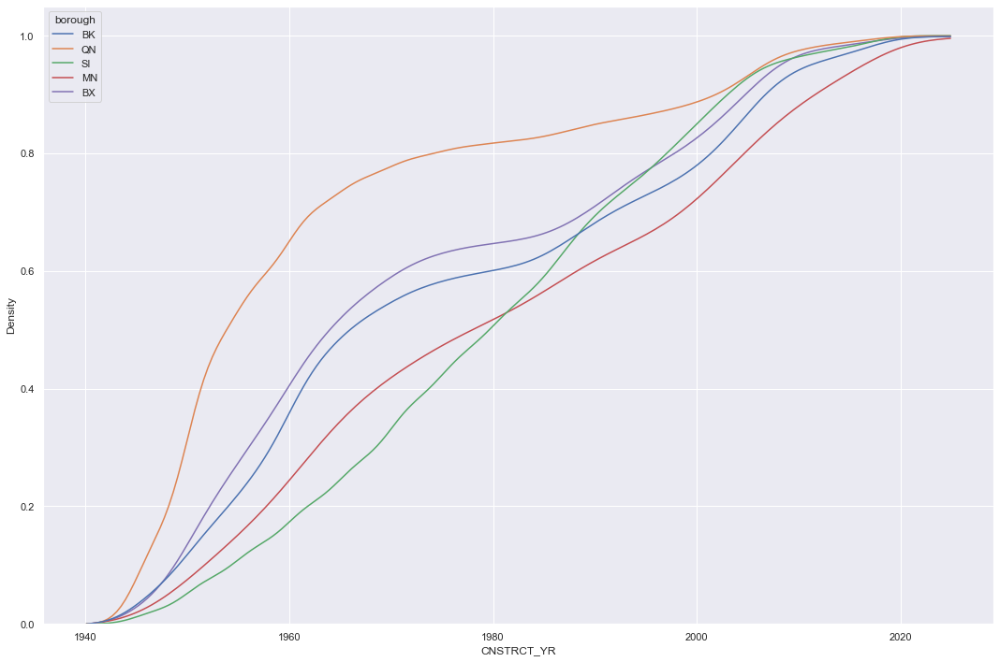

In [50]:
plt.figure(figsize=(15,10))

sns.kdeplot(data=building_footprints, 
            x='CNSTRCT_YR',
            hue='borough', 
            cumulative=True, 
            common_norm=False, 
            common_grid=True)

plt.tight_layout()
plt.savefig('figures/3-1-2-h')

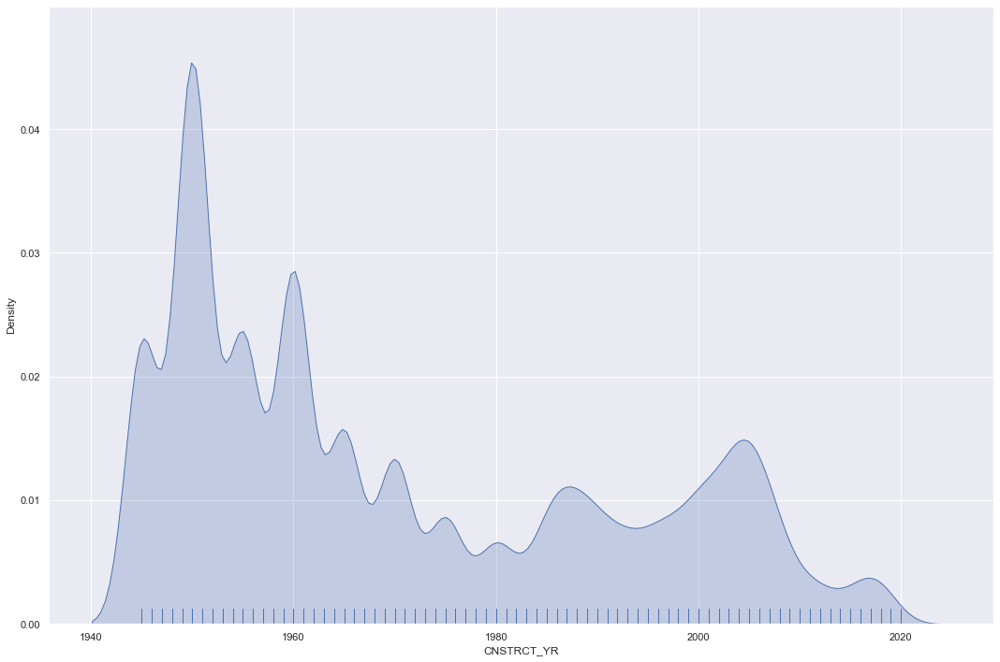

In [51]:
plt.figure(figsize=(15,10))

sns.kdeplot(building_footprints['CNSTRCT_YR'], 
            shade=True)

sns.rugplot(building_footprints['CNSTRCT_YR'])

plt.tight_layout()
plt.savefig('figures/3-1-2-i')

### Empirical Cumulative Distribution Functions (ECDF)

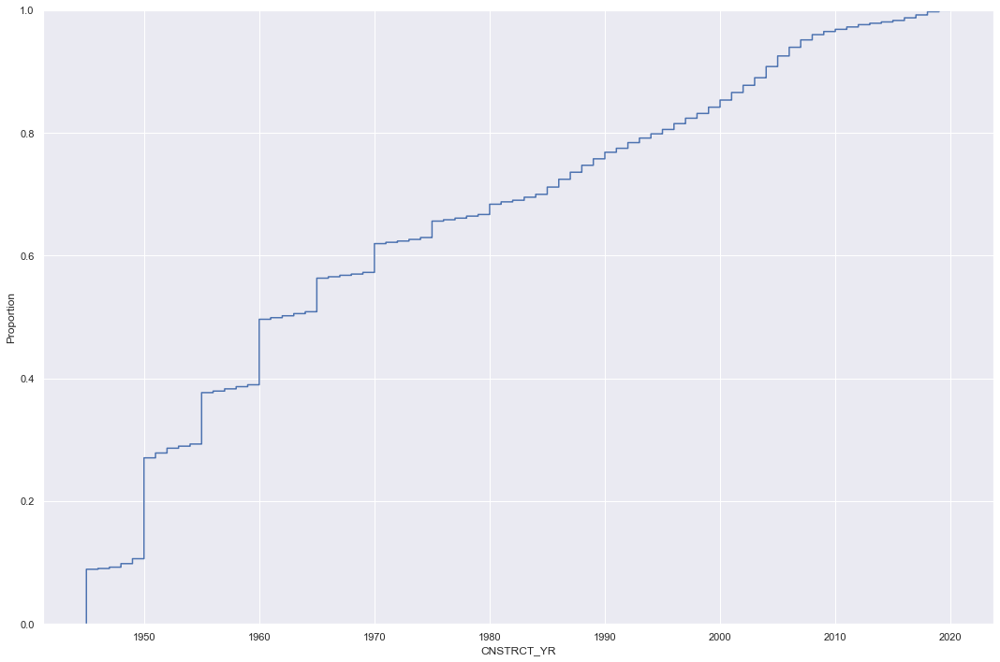

In [52]:
plt.figure(figsize=(15,10))

sns.ecdfplot(data=building_footprints, 
             x="CNSTRCT_YR")

plt.tight_layout()
plt.savefig('figures/3-1-3-a')

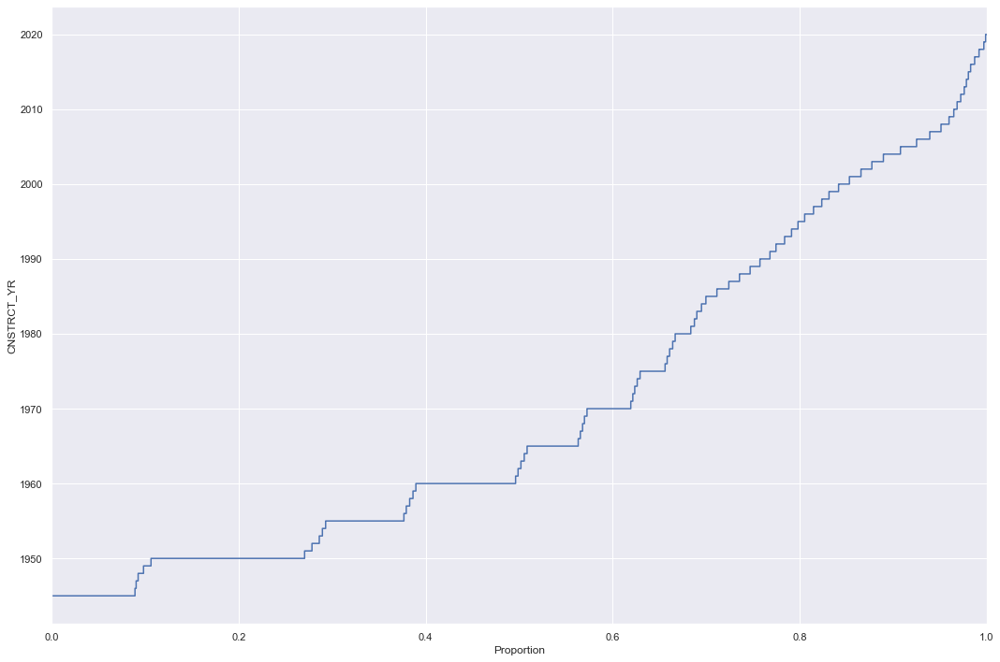

In [53]:
plt.figure(figsize=(15,10))

sns.ecdfplot(data=building_footprints, 
             y="CNSTRCT_YR")

plt.tight_layout()
plt.savefig('figures/3-1-3-b')

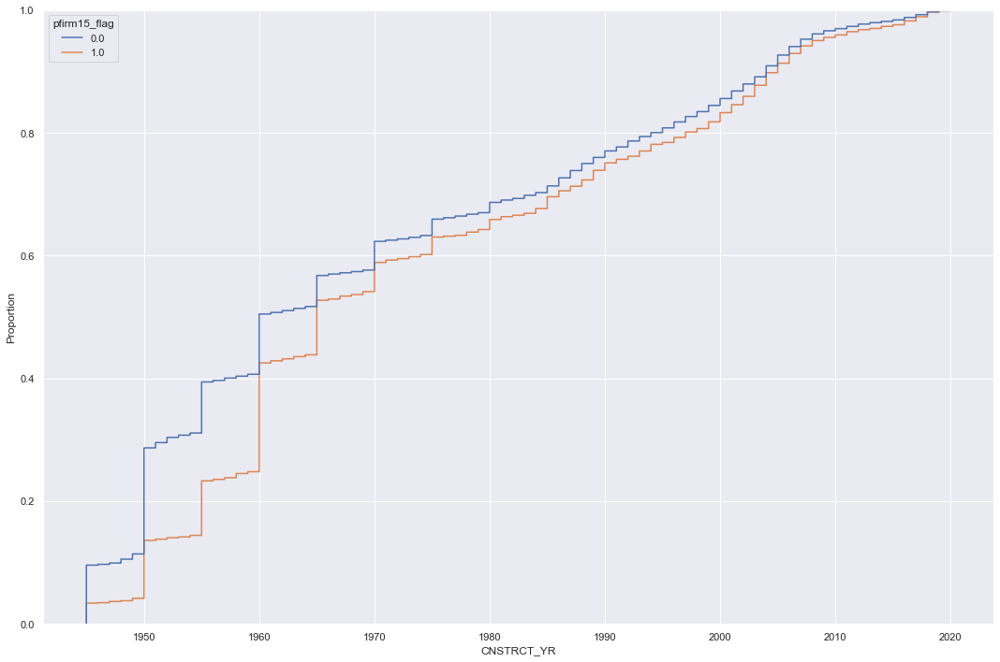

In [54]:
plt.figure(figsize=(15,10))

sns.ecdfplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             hue='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-1-3-c')

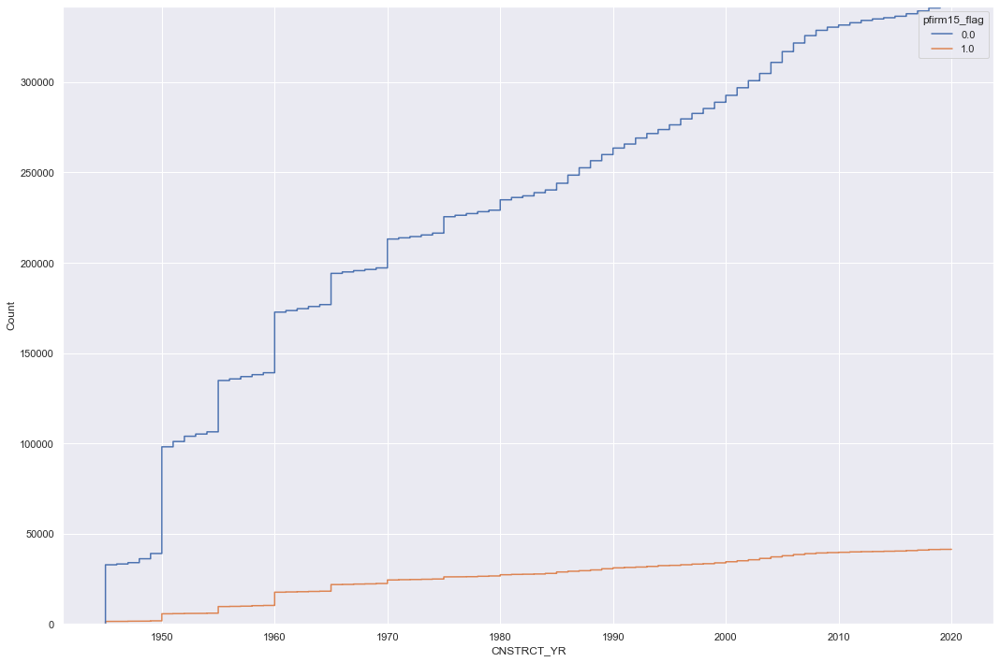

In [55]:
plt.figure(figsize=(15,10))

sns.ecdfplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             hue='pfirm15_flag',
             stat="count")

plt.tight_layout()
plt.savefig('figures/3-1-3-d')

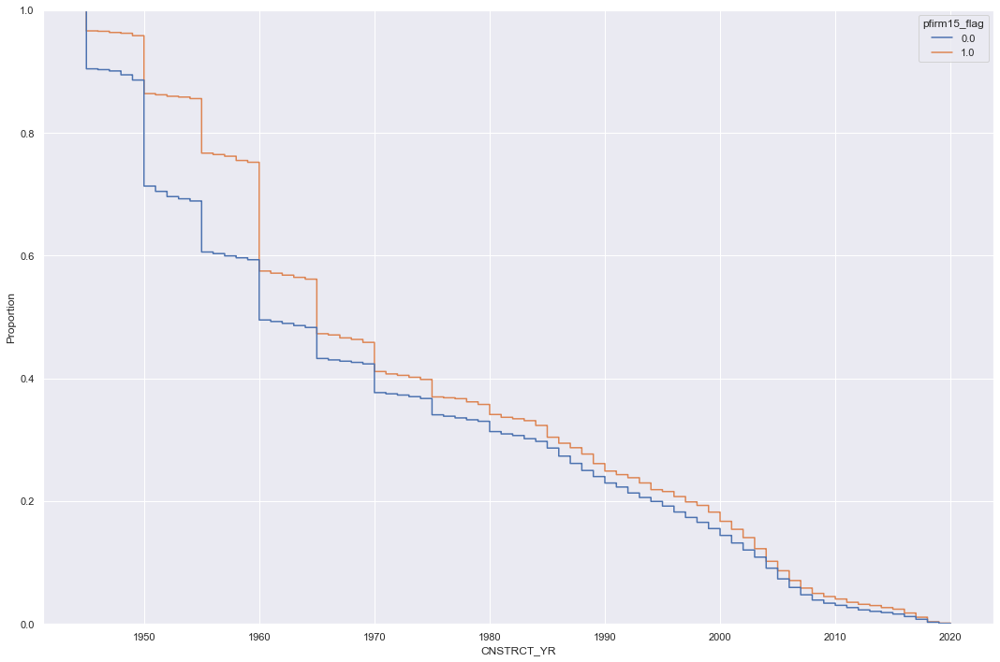

In [56]:
plt.figure(figsize=(15,10))

sns.ecdfplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             hue='pfirm15_flag',
             complementary=True)

plt.tight_layout()
plt.savefig('figures/3-1-3-e')

### Distribution Plots onto a Facet Grid

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


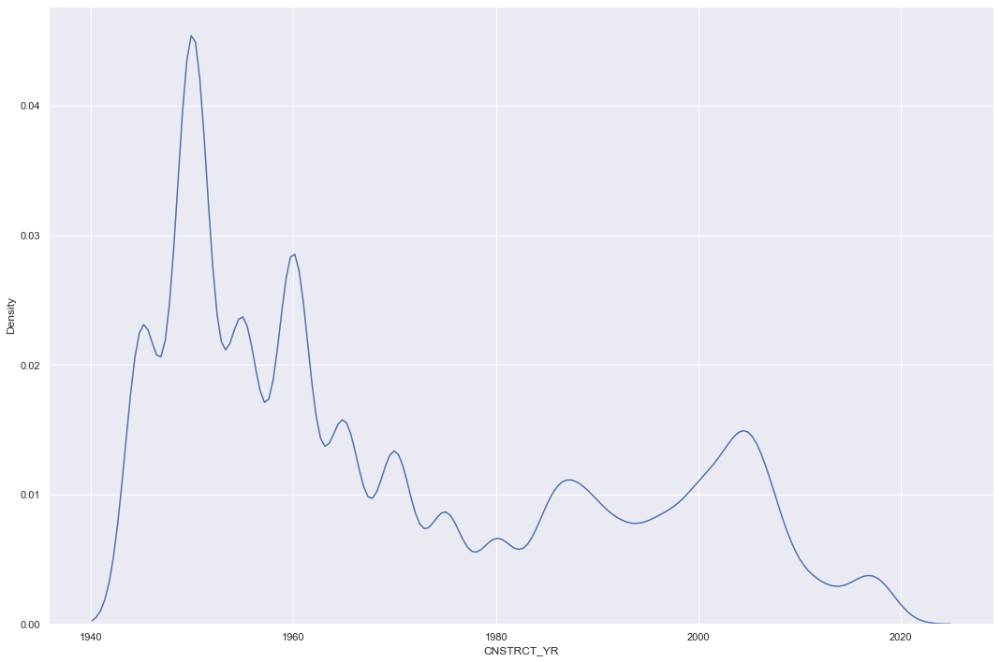

In [57]:
plt.figure(figsize=(15,10))

sns.distplot(building_footprints['CNSTRCT_YR'], 
             hist=False)

plt.tight_layout()
plt.savefig('figures/3-1-4-a')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


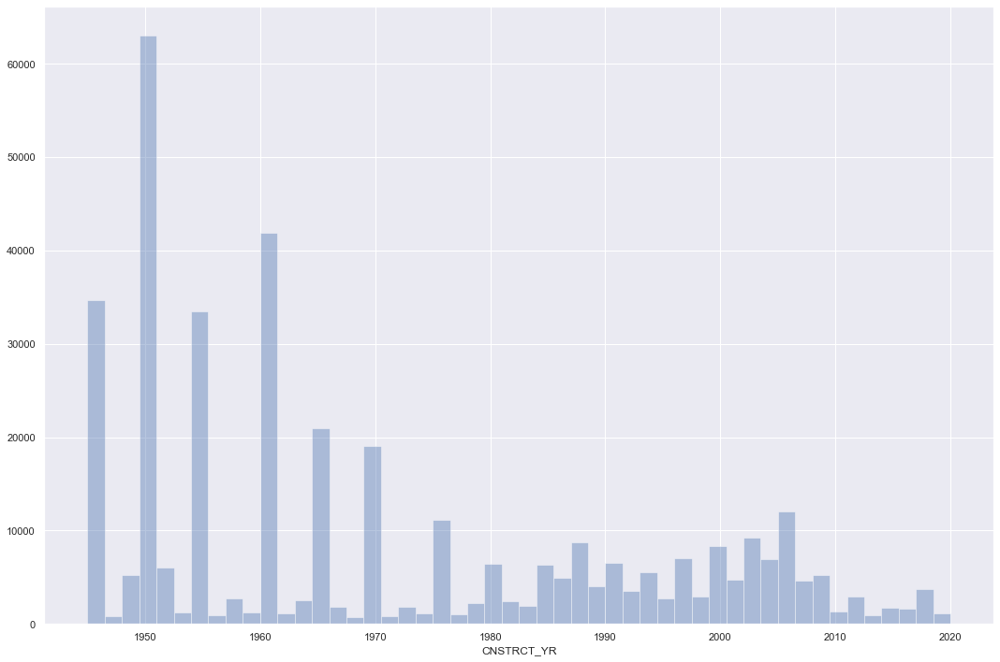

In [58]:
plt.figure(figsize=(15,10))


sns.distplot(building_footprints['CNSTRCT_YR'], 
             kde=False, 
             rug=False)

plt.tight_layout()
plt.savefig('figures/3-1-4-b')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


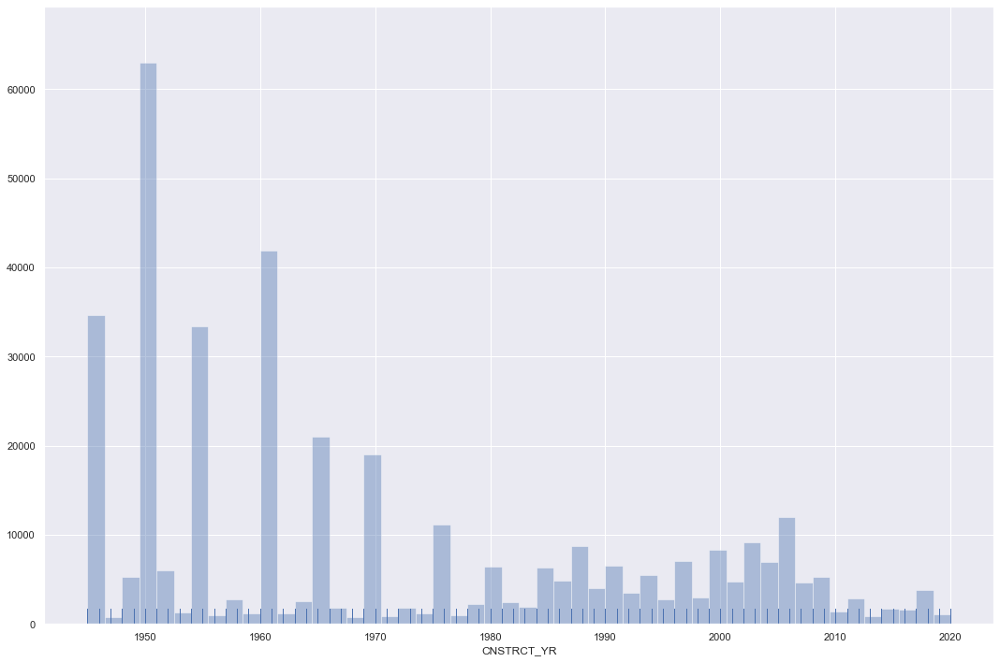

In [59]:
plt.figure(figsize=(15,10))

sns.distplot(building_footprints['CNSTRCT_YR'],
             kde=False, 
             rug=True)

plt.tight_layout()
plt.savefig('figures/3-1-4-c')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


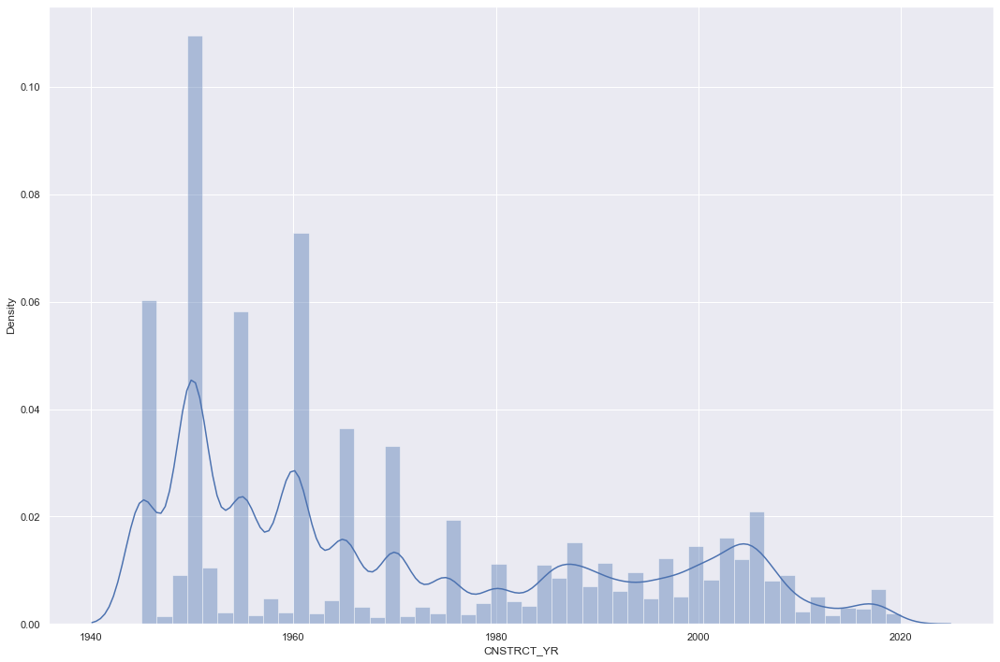

In [60]:
plt.figure(figsize=(15,10))

sns.distplot(building_footprints['CNSTRCT_YR'])

plt.tight_layout()
plt.savefig('figures/3-1-4-d')

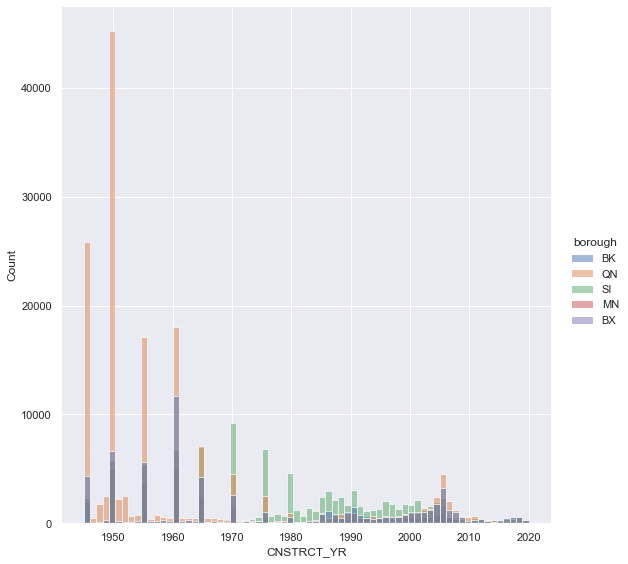

In [61]:
sns.displot(data=building_footprints, 
            x="CNSTRCT_YR", 
            hue="borough", 
            kind="hist",
            height=8,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-1-4-e', bbox_inches='tight')

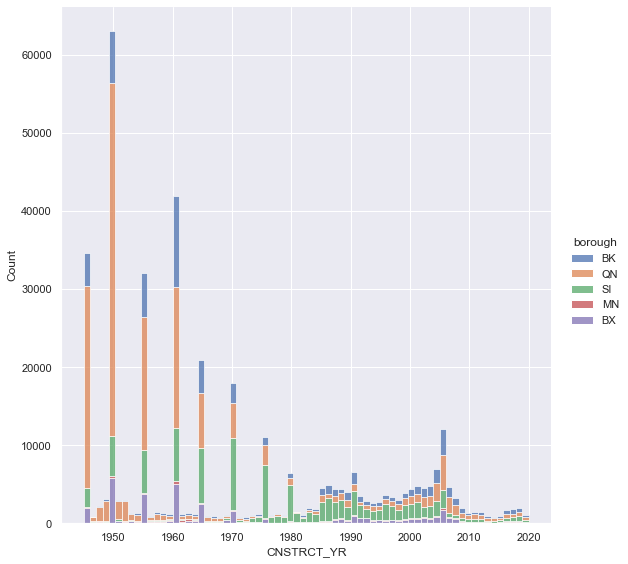

In [62]:
sns.displot(data=building_footprints, 
            x="CNSTRCT_YR", 
            hue="borough", 
            multiple="stack",
            height=8,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-1-4-f', bbox_inches='tight')

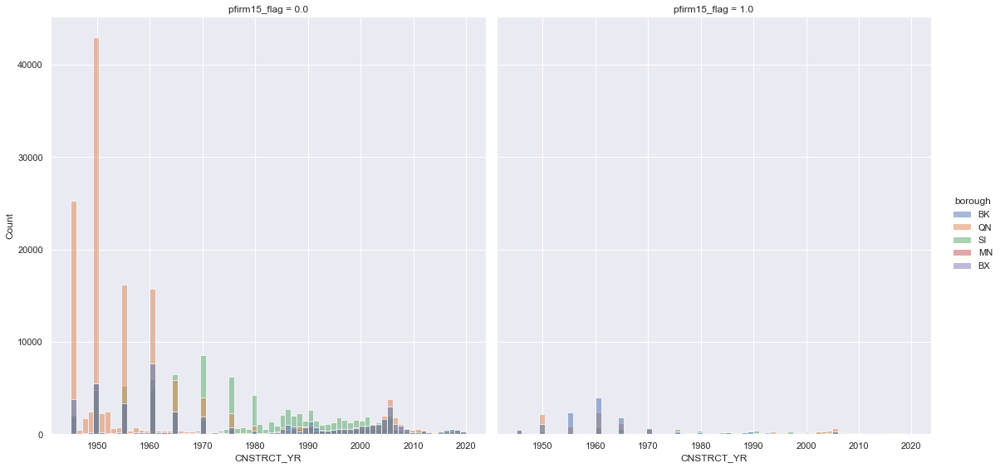

In [63]:
sns.displot(data=building_footprints, 
            x="CNSTRCT_YR", 
            hue="borough", 
            col="pfirm15_flag", 
            kind="hist",
            height=8,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-1-4-g', bbox_inches='tight')

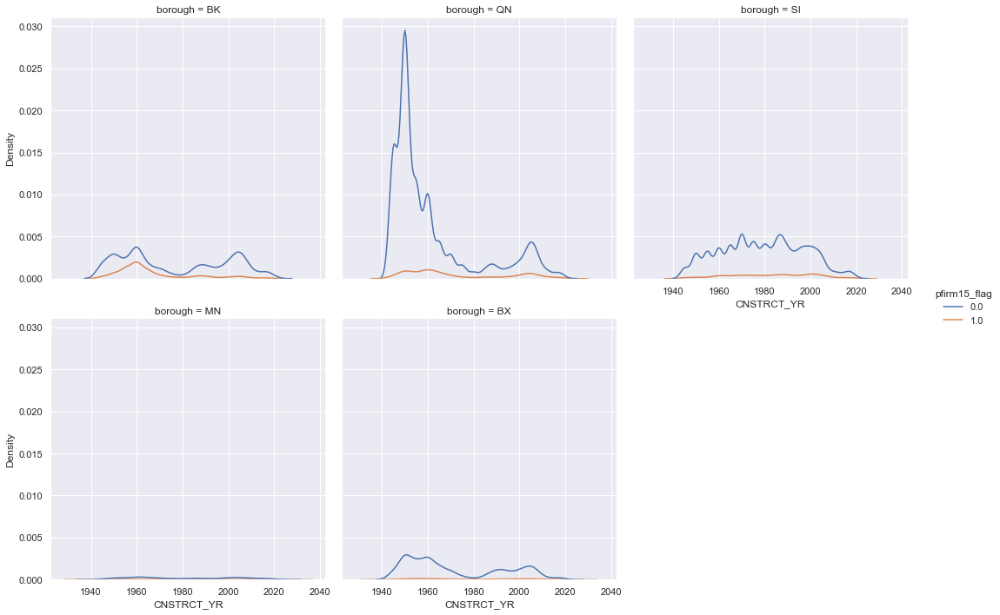

In [64]:
sns.displot(data=building_footprints, 
            x="CNSTRCT_YR", 
            hue="pfirm15_flag", 
            col="borough", 
            kind="kde",
            col_wrap=3,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-1-4-h', bbox_inches='tight')

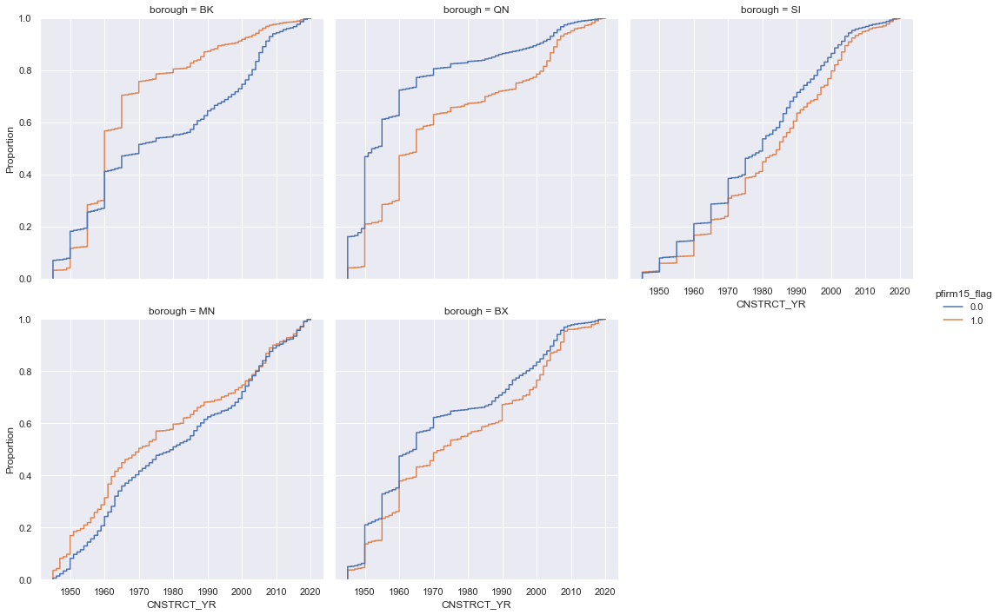

In [65]:
sns.displot(data=building_footprints, 
            x="CNSTRCT_YR", 
            hue="pfirm15_flag", 
            col="borough", 
            kind="ecdf",
            col_wrap=3,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-1-4-i', bbox_inches='tight')

## Relational Plots

### Line Plot

In [66]:
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
0,NaN,MULTIPOLYGON (((-73.87129515296562 40.65717370...,2009.0,3394646,08/22/2017 12:00:00 AM +0000,Constructed,1212853,21.608508,2100.0,18.0,...,1070.0,1019957.0,178731.0,40.657180,-73.871307,1,5.0,33.0,0.0,0.0
3,NaN,MULTIPOLYGON (((-73.85195485799383 40.66235471...,1960.0,4460479,08/22/2017 12:00:00 AM +0000,Constructed,581946,29.811570,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
4,NaN,MULTIPOLYGON (((-73.85165049449266 40.66194039...,1960.0,4460497,08/22/2017 12:00:00 AM +0000,Constructed,796268,32.008371,2100.0,12.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
5,NaN,MULTIPOLYGON (((-73.85109292802453 40.66243288...,1960.0,4460503,08/22/2017 12:00:00 AM +0000,Constructed,167798,30.720470,2100.0,10.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0
6,NaN,MULTIPOLYGON (((-73.85300665279054 40.66210254...,1960.0,4460505,08/22/2017 12:00:00 AM +0000,Constructed,75202,30.225970,2100.0,9.0,...,6202.0,1025274.0,180506.0,40.662029,-73.852133,1,10.0,45.0,0.0,1.0


In [67]:
by_year = building_footprints.groupby('CNSTRCT_YR')[['DOITT_ID']].count()
by_year.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)
by_year = by_year.reset_index()
by_year['CNSTRCT_YR'] = by_year['CNSTRCT_YR'].astype(int)

by_year.head()

,CNSTRCT_YR,count
0,1945,34170
1,1946,474
2,1947,817
3,1948,2206
4,1949,3070


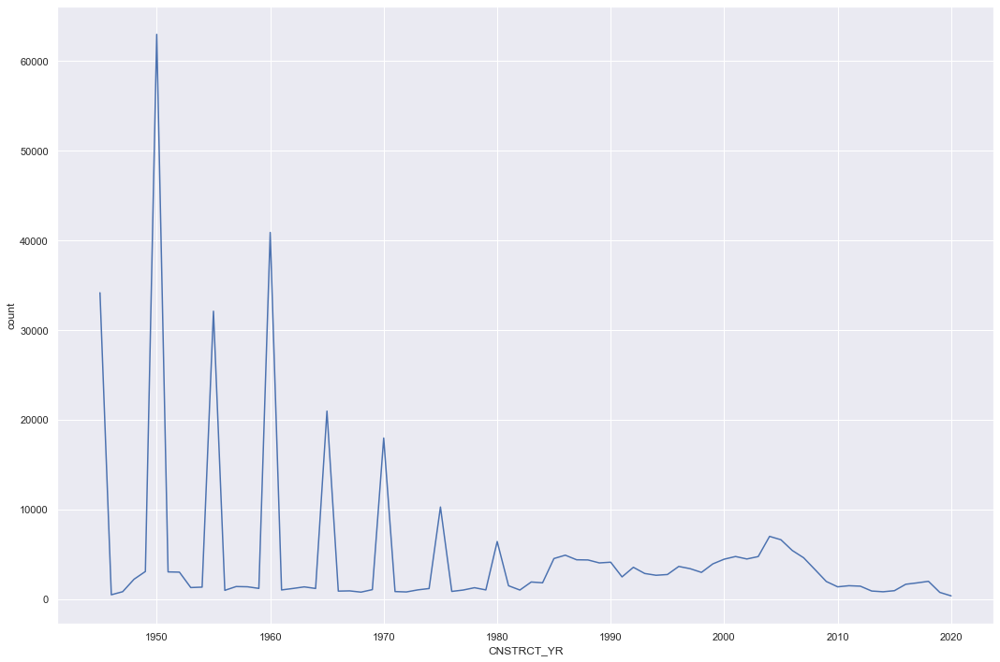

In [68]:
plt.figure(figsize=(15,10))

sns.lineplot(data=by_year, 
             x="CNSTRCT_YR", 
             y="count")

plt.tight_layout()
plt.savefig('figures/3-2-1-a')

In [69]:
line_pivot = pd.pivot_table(building_footprints, 
                      values='DOITT_ID', 
                      index=['CNSTRCT_YR'], 
                      columns = ['borough'], 
                      aggfunc='count')

line_pivot.head()

borough,BK,BX,MN,QN,SI
CNSTRCT_YR,,,,,
1945.0,4212,1948,76,25645,2289
1946.0,95,53,53,192,81
1947.0,34,89,95,495,104
1948.0,152,166,68,1762,58
1949.0,275,174,51,2498,72


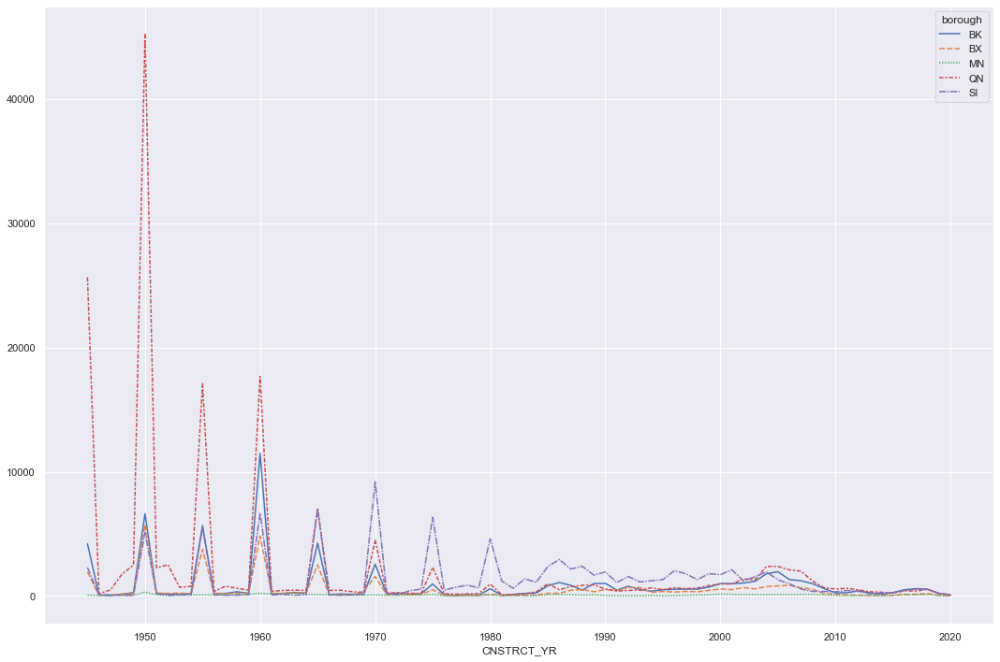

In [70]:
plt.figure(figsize=(15,10))

sns.lineplot(data=line_pivot)

plt.tight_layout()
plt.savefig('figures/3-2-1-b')

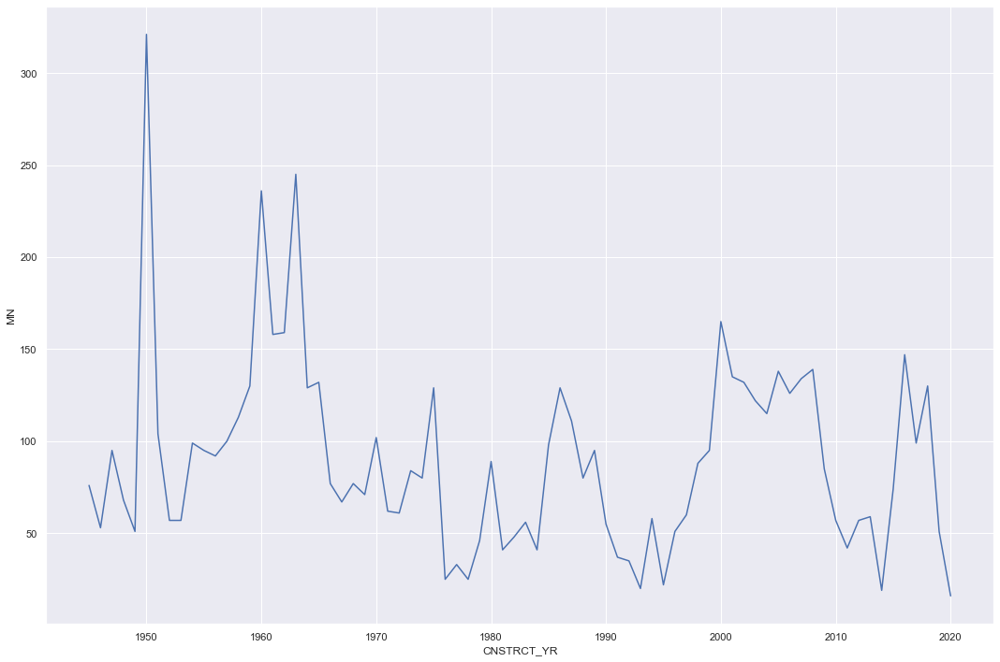

In [71]:
plt.figure(figsize=(15,10))

sns.lineplot(data=line_pivot['MN'])

plt.tight_layout()
plt.savefig('figures/3-2-1-c')

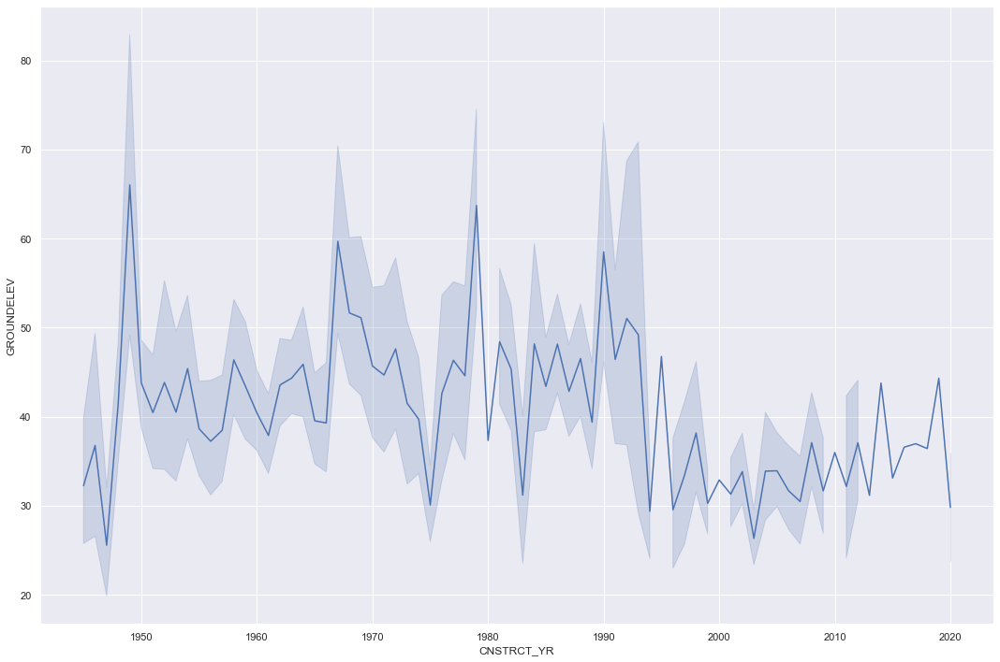

In [72]:
plt.figure(figsize=(15,10))

sns.lineplot(data=building_footprints.loc[building_footprints['borough'] == 'MN'], 
             x="CNSTRCT_YR", 
             y="GROUNDELEV")

plt.tight_layout()
plt.savefig('figures/3-2-1-d')

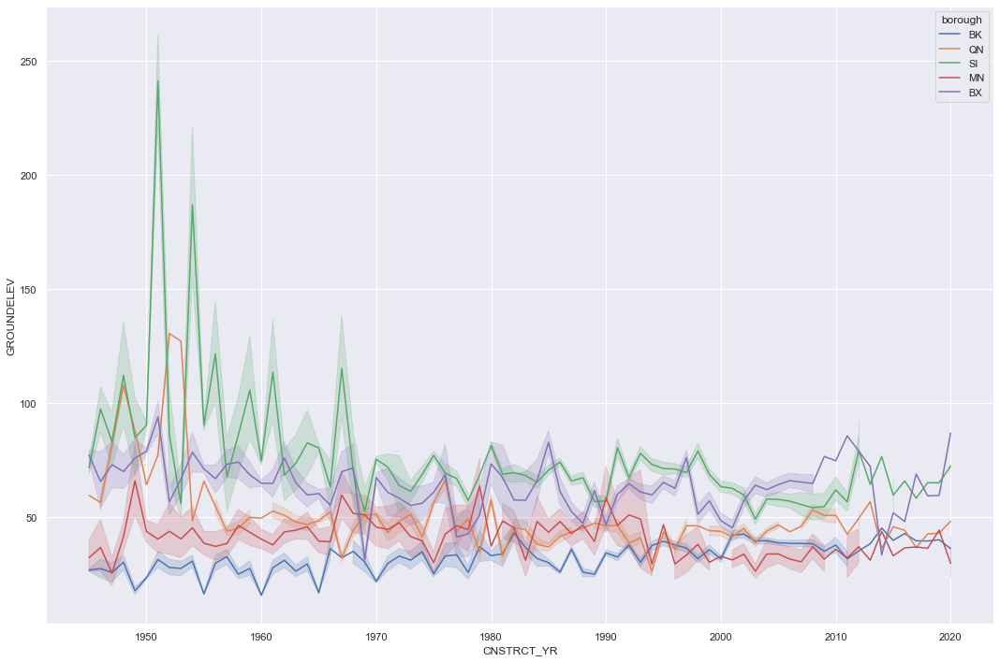

In [73]:
plt.figure(figsize=(15,10))

sns.lineplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             y="GROUNDELEV",
             hue='borough')

plt.tight_layout()
plt.savefig('figures/3-2-1-e')

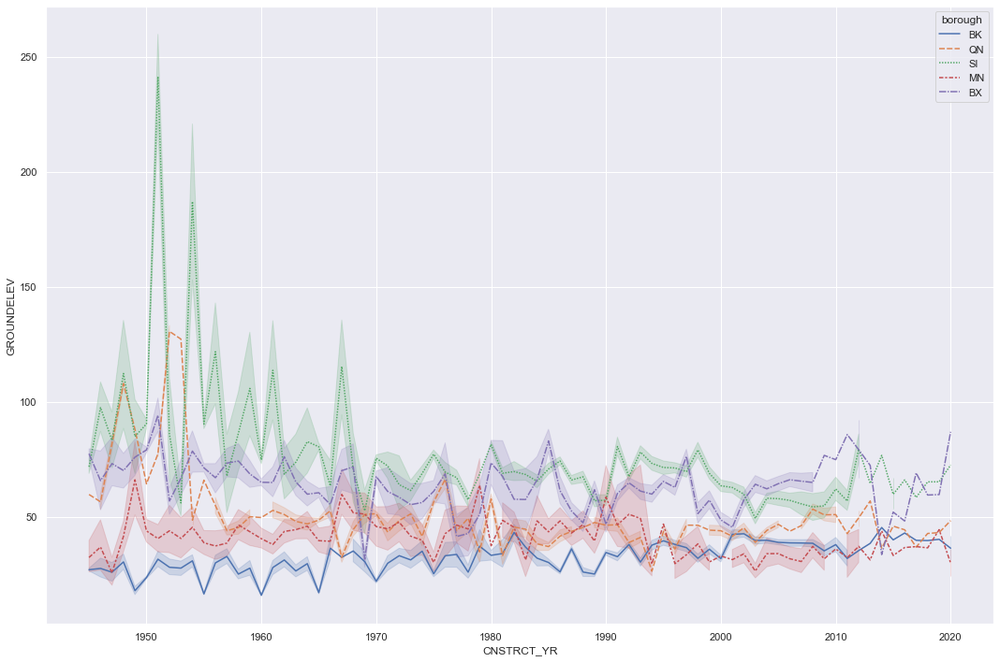

In [74]:
plt.figure(figsize=(15,10))

sns.lineplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             y="GROUNDELEV",
             hue='borough',
             style='borough')

plt.tight_layout()
plt.savefig('figures/3-2-1-f')

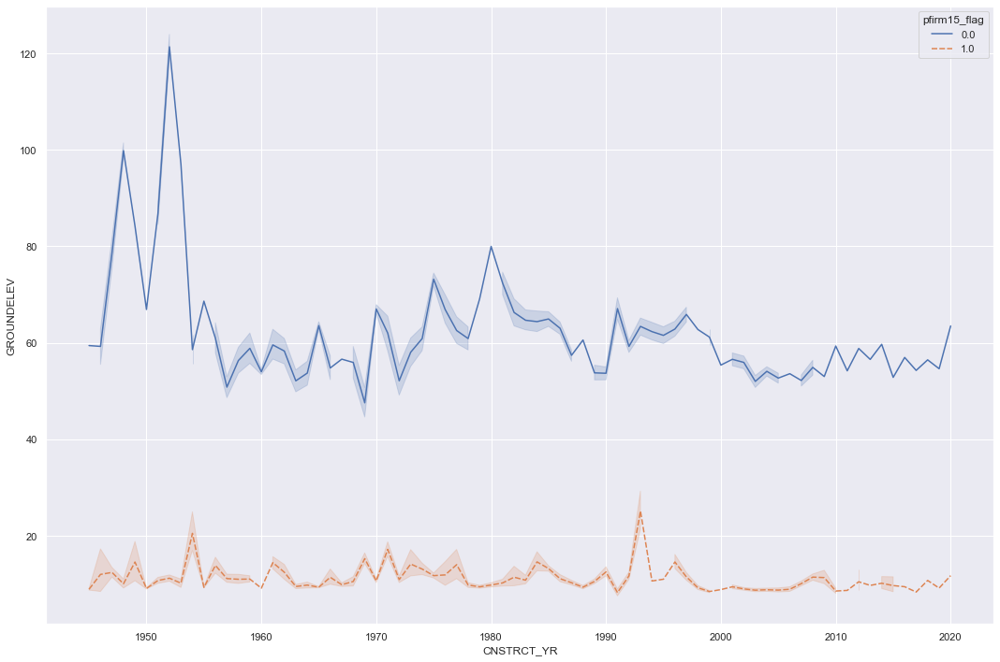

In [75]:
plt.figure(figsize=(15,10))

sns.lineplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             y="GROUNDELEV",
             hue='pfirm15_flag',
             style='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-2-1-g')

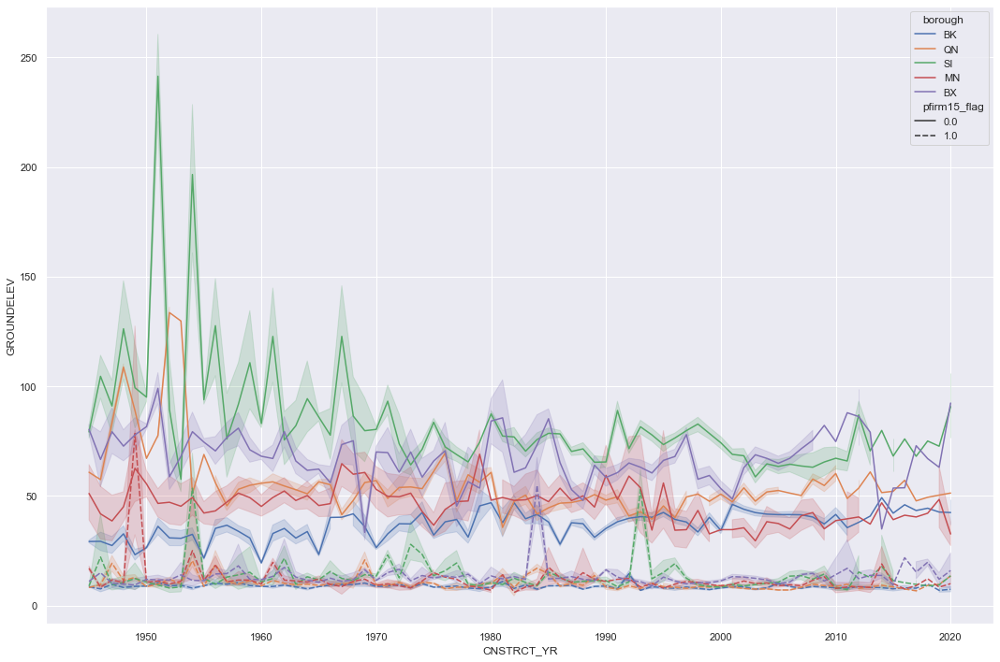

In [76]:
plt.figure(figsize=(15,10))

sns.lineplot(data=building_footprints, 
             x="CNSTRCT_YR", 
             y="GROUNDELEV",
             hue='borough',
             style='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-2-1-h')

<Figure size 1080x720 with 0 Axes>

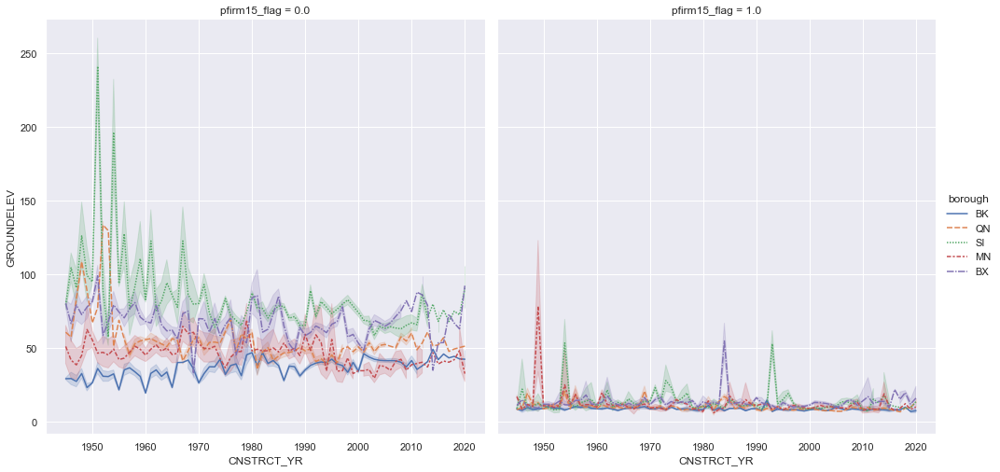

In [77]:
plt.figure(figsize=(15,10))

sns.relplot(data=building_footprints, 
            x="CNSTRCT_YR", 
            y="GROUNDELEV",
            col="pfirm15_flag", 
            hue="borough", 
            style="borough",
            kind="line",
            height = 7,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-2-1-i', bbox_inches='tight')

### Scatter Plots

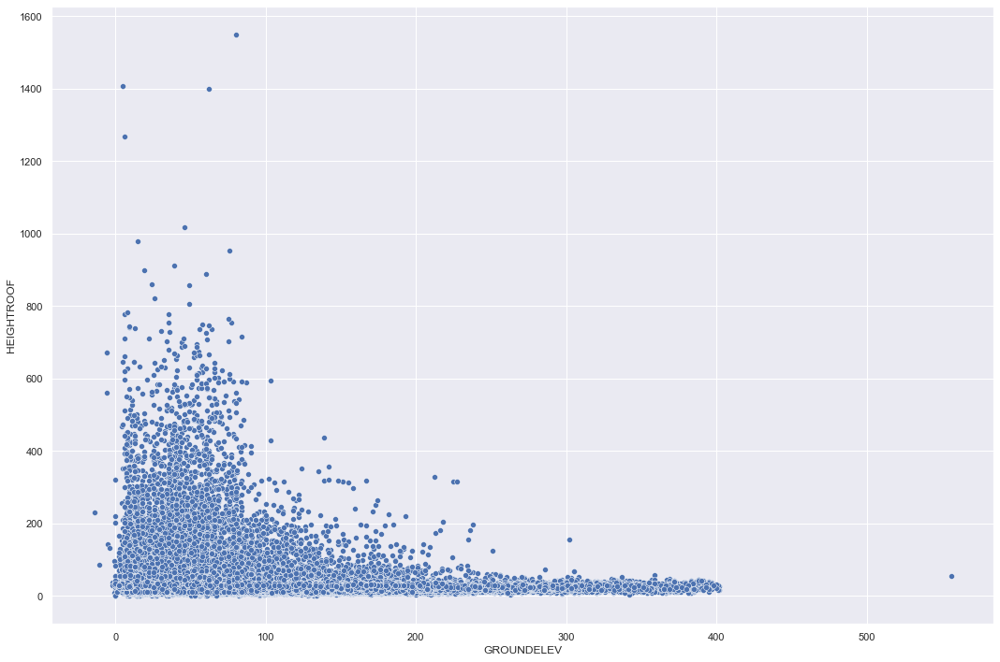

In [78]:
plt.figure(figsize=(15,10))
sns.scatterplot(x = building_footprints['GROUNDELEV'],
                y = building_footprints['HEIGHTROOF'])

plt.tight_layout()
plt.savefig('figures/3-2-2-a')

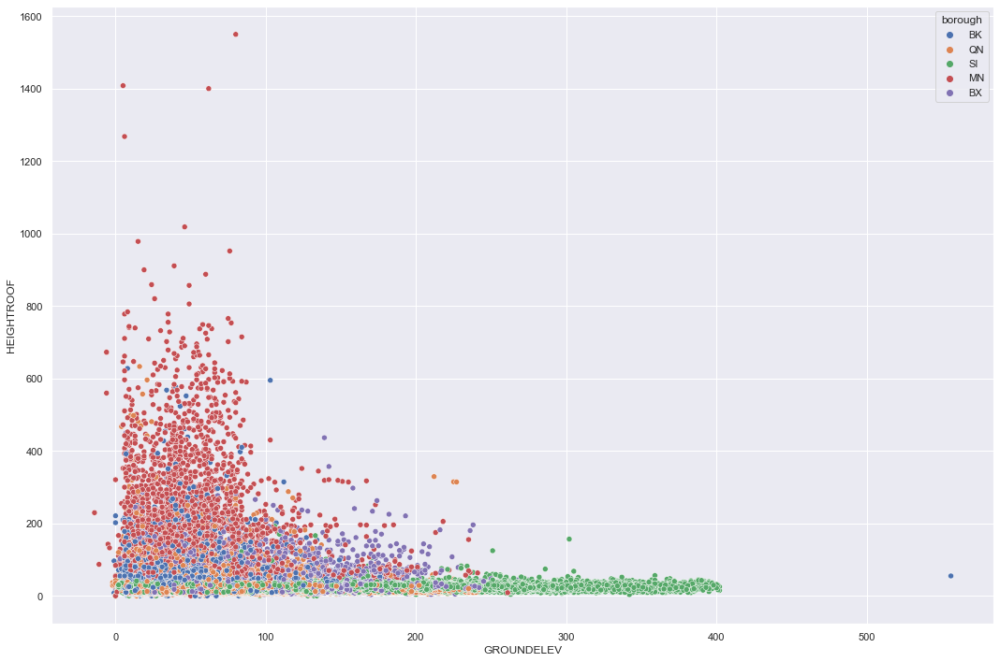

In [79]:
plt.figure(figsize=(15,10))

sns.scatterplot(x = building_footprints['GROUNDELEV'],
                y = building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="borough")

plt.tight_layout()
plt.savefig('figures/3-2-2-b')

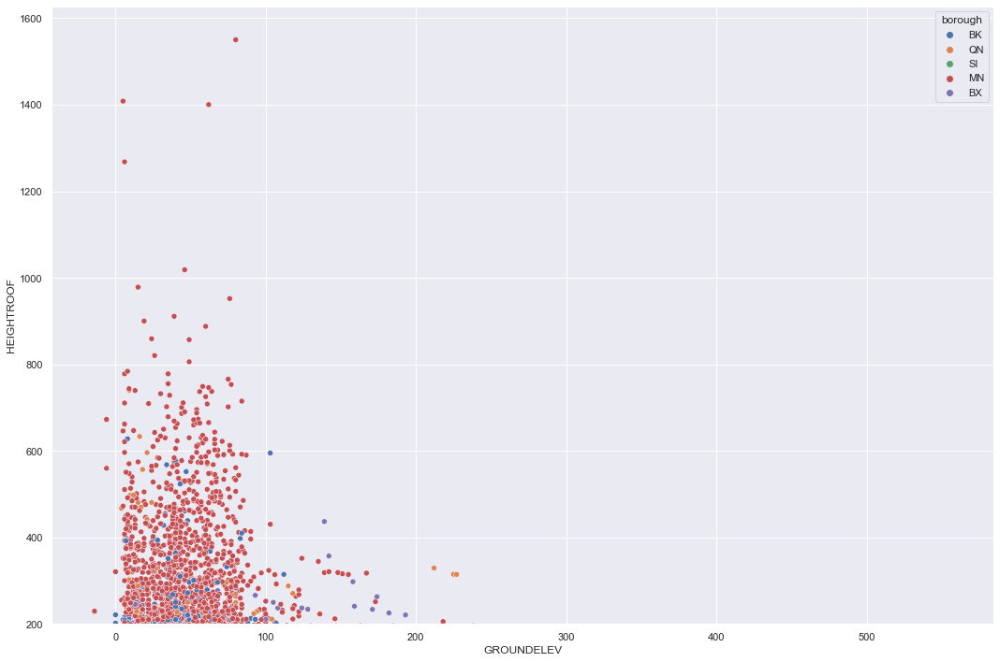

In [80]:
plt.figure(figsize=(15,10))

sns.scatterplot(x = building_footprints['GROUNDELEV'],
                y = building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="borough")

plt.ylim(bottom=200)
plt.tight_layout()
plt.savefig('figures/3-2-2-c')

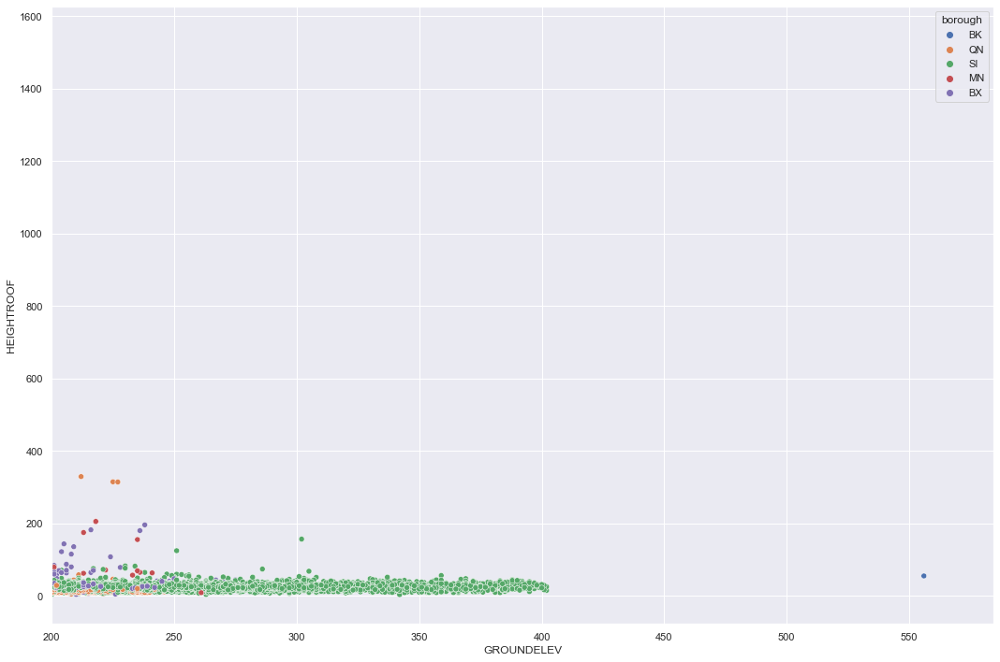

In [81]:
plt.figure(figsize=(15,10))

sns.scatterplot(x = building_footprints['GROUNDELEV'],
                y = building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="borough")

plt.xlim(left=200)
plt.tight_layout()
plt.savefig('figures/3-2-2-d')

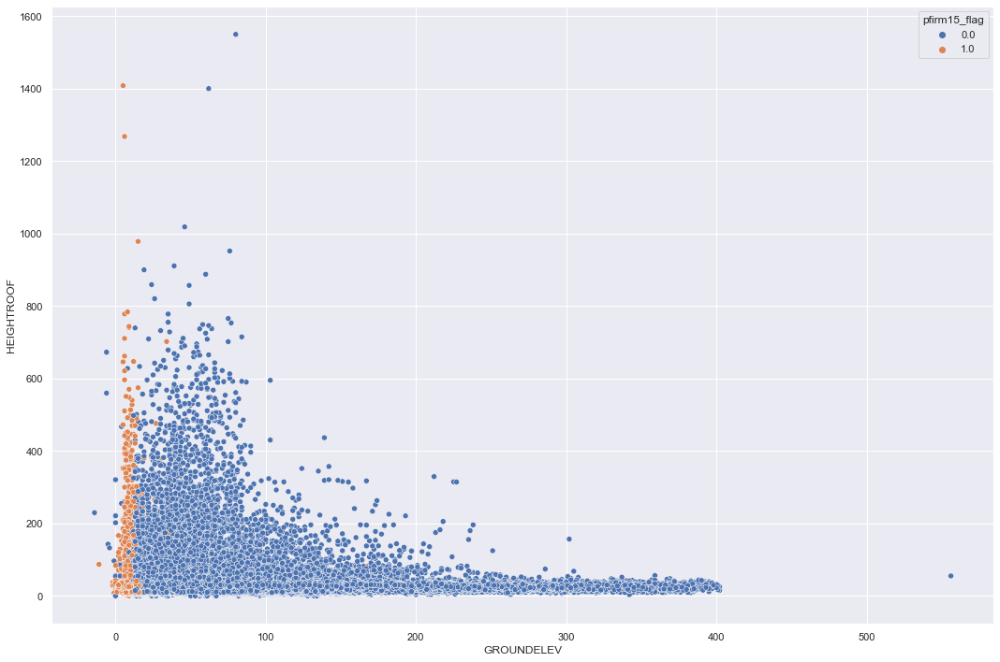

In [82]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="pfirm15_flag")

plt.tight_layout()
plt.savefig('figures/3-2-2-e')

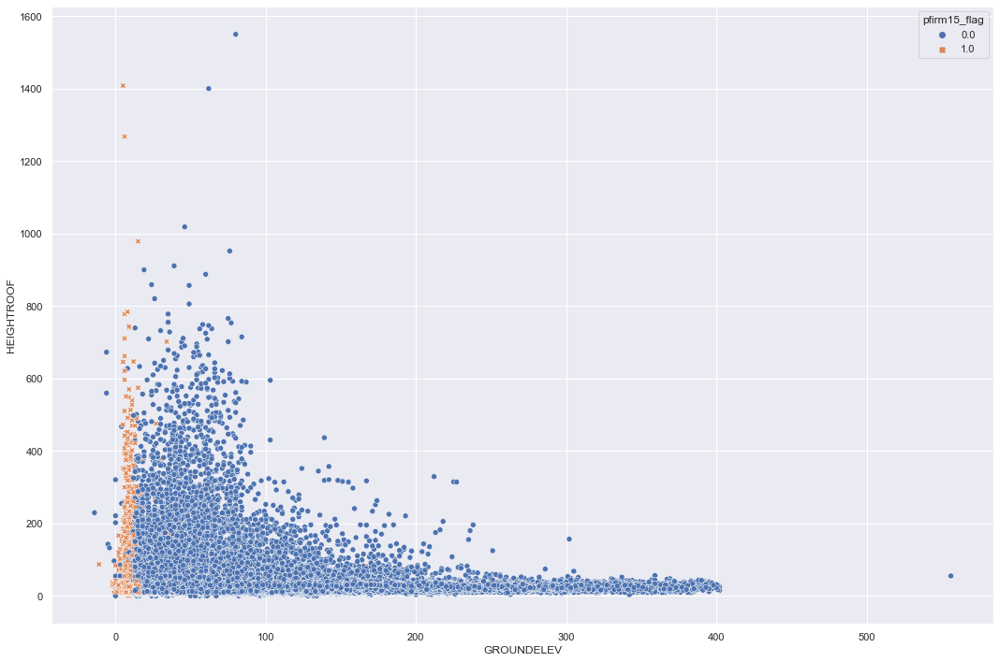

In [83]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="pfirm15_flag", 
                style="pfirm15_flag")

plt.tight_layout()
plt.savefig('figures/3-2-2-f')

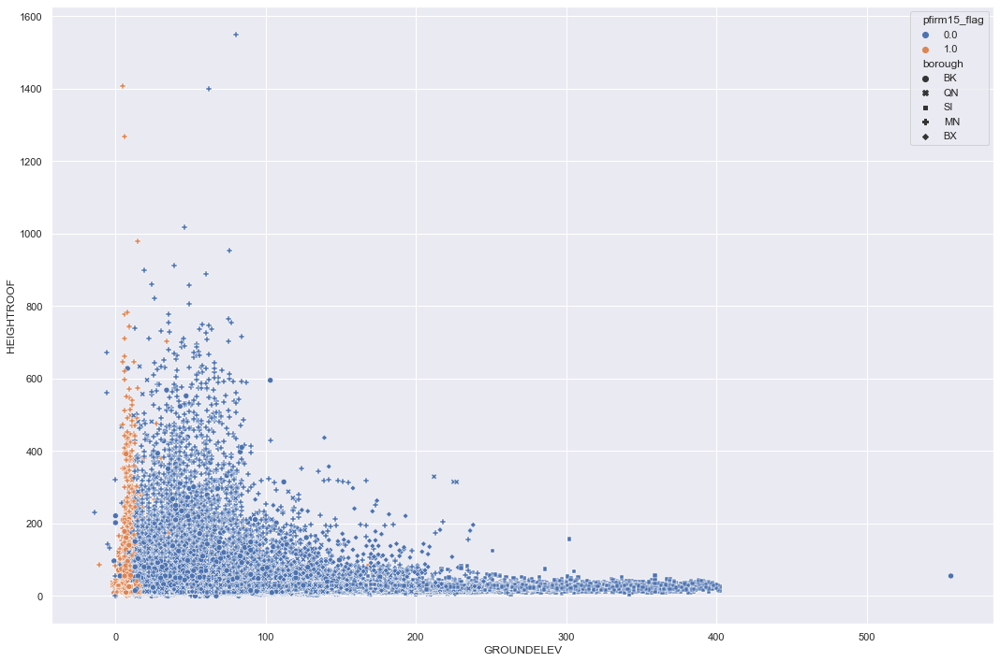

In [84]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="pfirm15_flag", 
                style="borough")

plt.tight_layout()
plt.savefig('figures/3-2-2-g')

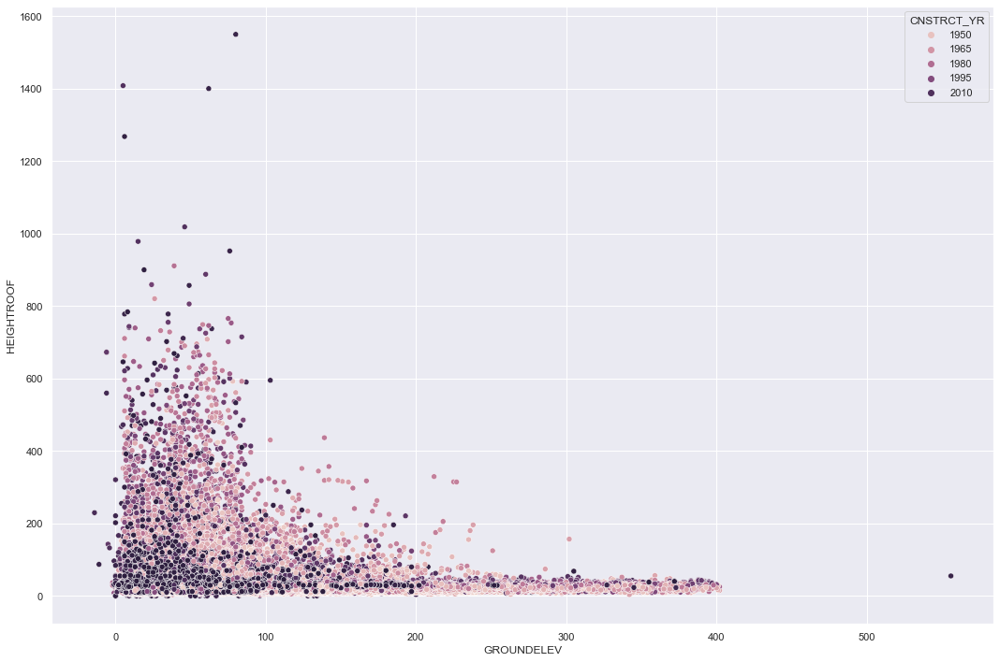

In [85]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="CNSTRCT_YR")

plt.tight_layout()
plt.savefig('figures/3-2-2-h')

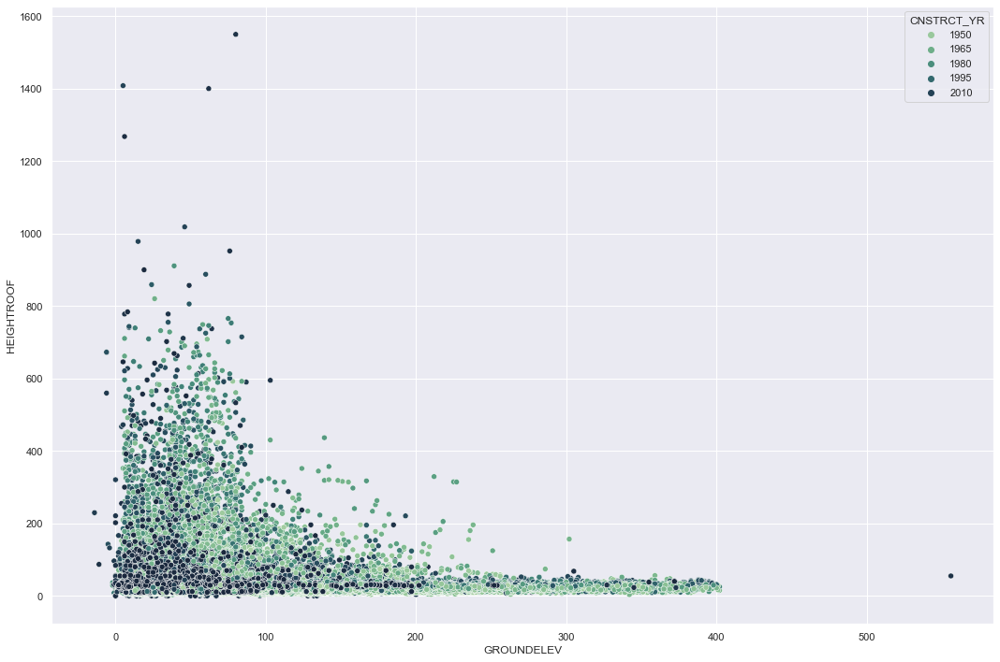

In [86]:
plt.figure(figsize=(15,10))

sns.scatterplot(x = building_footprints['GROUNDELEV'],
                y = building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                hue="CNSTRCT_YR", 
                palette="ch:r=-.5,l=.75")

plt.tight_layout()
plt.savefig('figures/3-2-2-i')

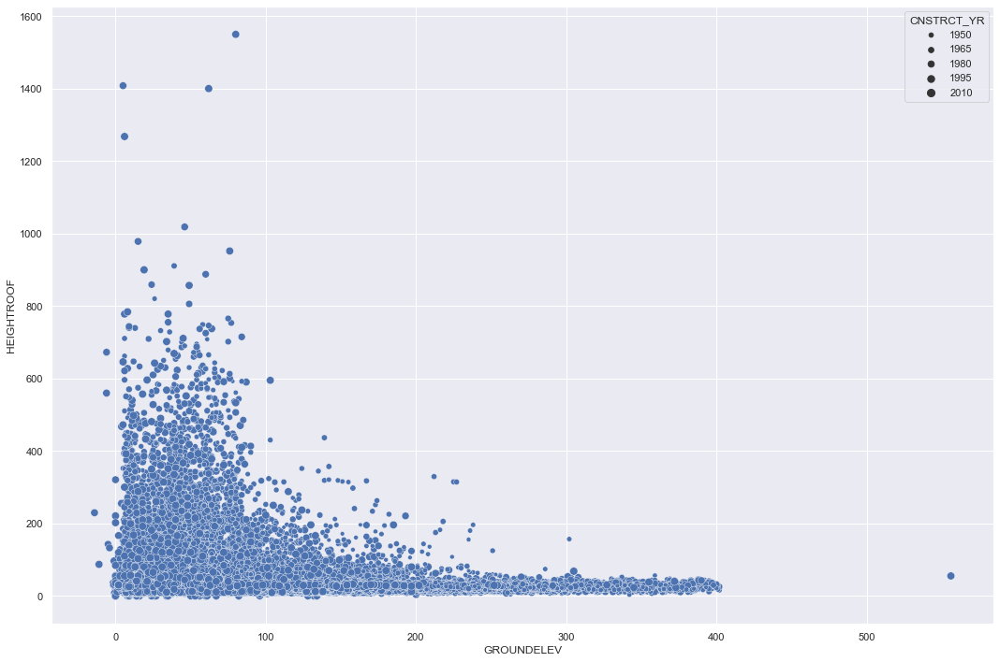

In [87]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                size="CNSTRCT_YR")

plt.tight_layout()
plt.savefig('figures/3-2-2-j')

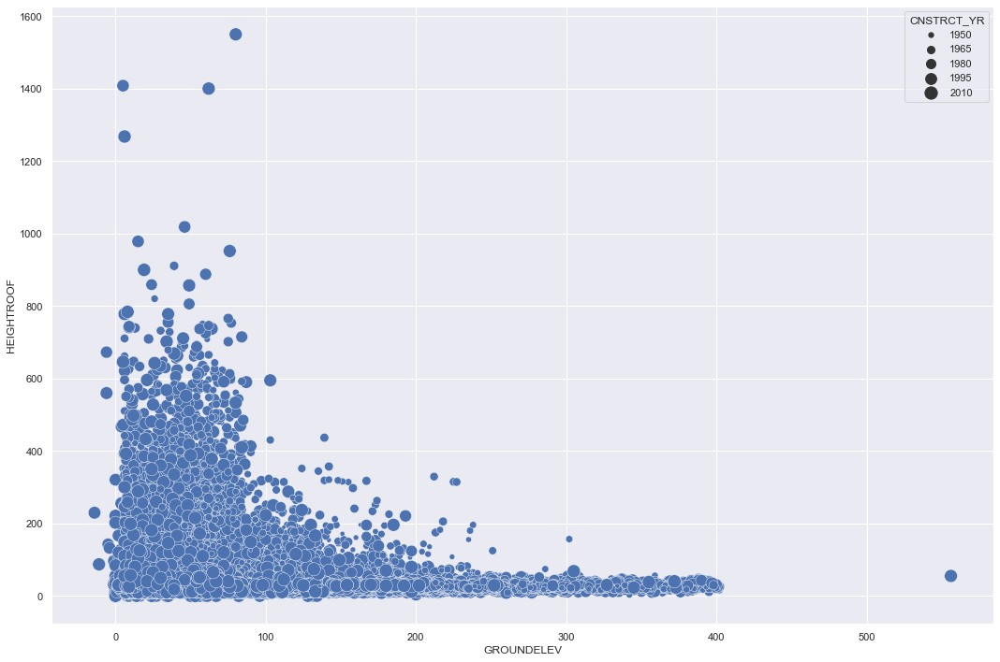

In [88]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                size="CNSTRCT_YR", 
                sizes=(15, 200))

plt.tight_layout()
plt.savefig('figures/3-2-2-k')

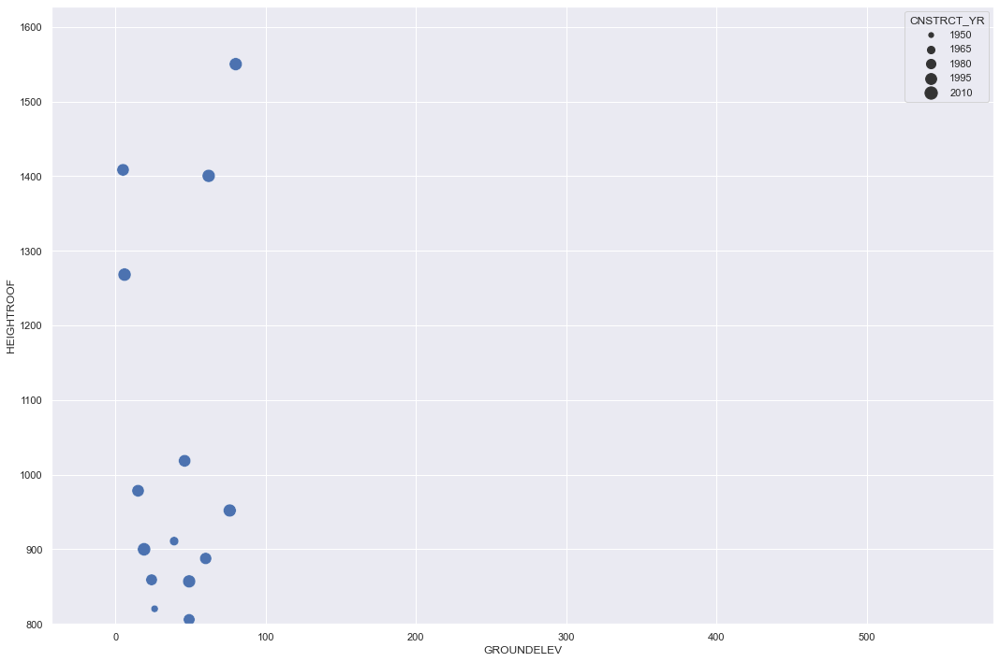

In [89]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=building_footprints['GROUNDELEV'],
                y=building_footprints['HEIGHTROOF'], 
                data=building_footprints, 
                size="CNSTRCT_YR", 
                sizes=(15, 200))

plt.ylim(bottom=800)
plt.tight_layout()
plt.savefig('figures/3-2-2-l')

### Relational Plots onto a Facet Grid

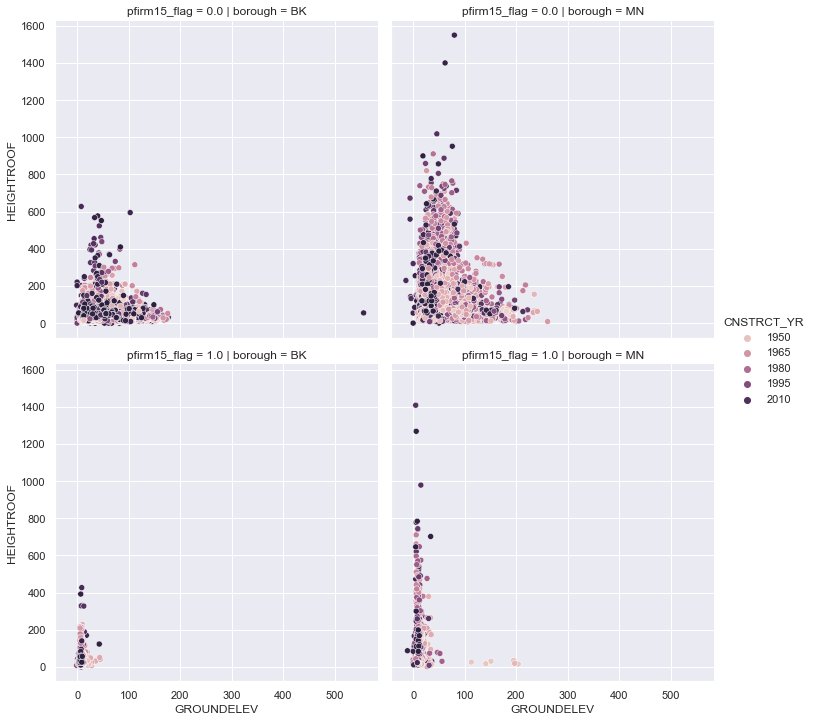

In [90]:
sns.relplot(data=building_footprints.loc[building_footprints['borough'].isin(["MN", "BK"])], 
            x="GROUNDELEV", 
            y="HEIGHTROOF", 
            hue="CNSTRCT_YR", 
            col="borough", 
            row="pfirm15_flag",
            facet_kws={"legend_out": True})

plt.savefig('figures/3-2-3-a', bbox_inches='tight')

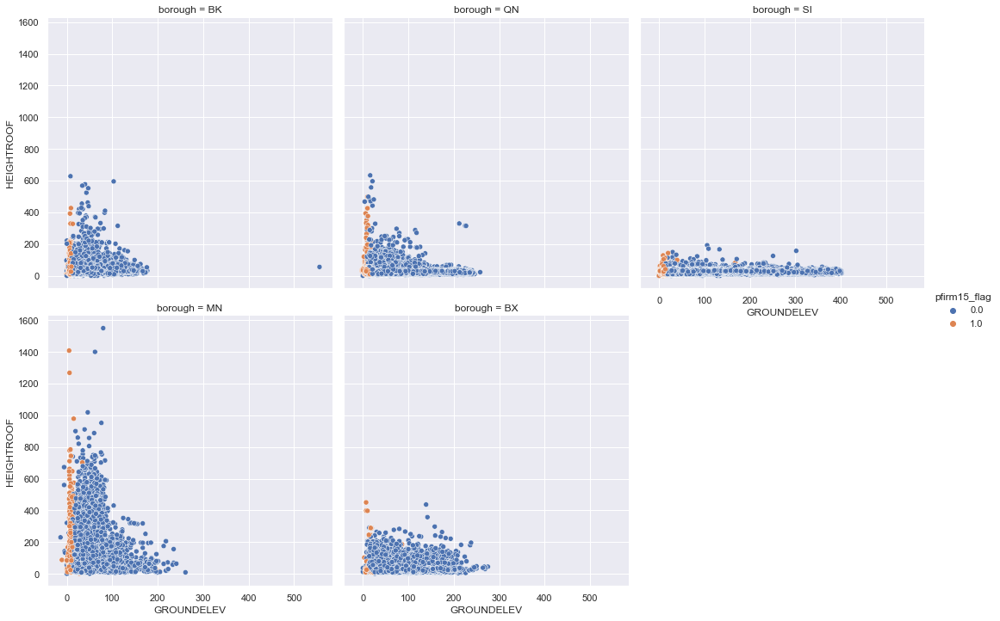

In [91]:
sns.relplot(data=building_footprints, 
            x="GROUNDELEV", 
            y="HEIGHTROOF", 
            hue="pfirm15_flag", 
            col="borough", 
            col_wrap=3,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-2-3-b', bbox_inches='tight')

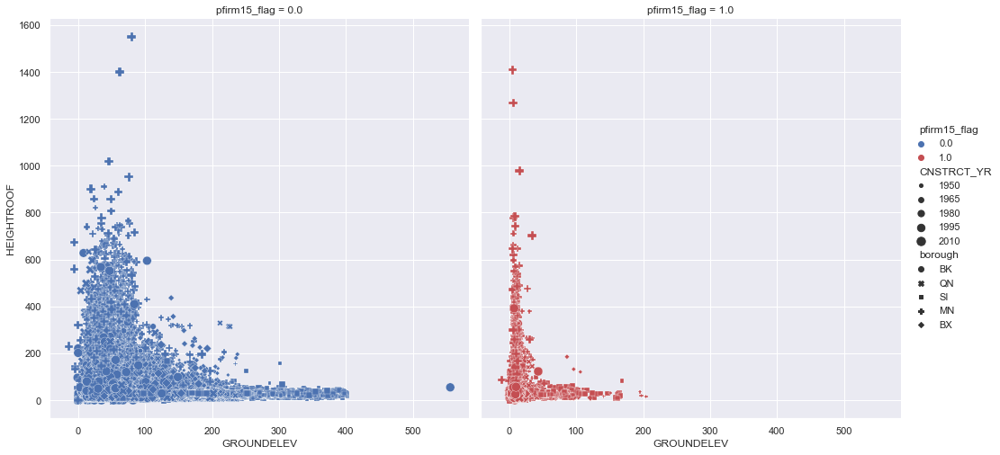

In [92]:
sns.relplot(data=building_footprints, 
            x="GROUNDELEV", 
            y="HEIGHTROOF", 
            col="pfirm15_flag",
            hue="pfirm15_flag", 
            size="CNSTRCT_YR", 
            style="borough",
            palette=["b", "r"], 
            sizes=(10, 100),
            height=7,
            facet_kws={"legend_out": True})

plt.savefig('figures/3-2-3-c', bbox_inches='tight')

## Joint Grids

### Scatter Plots

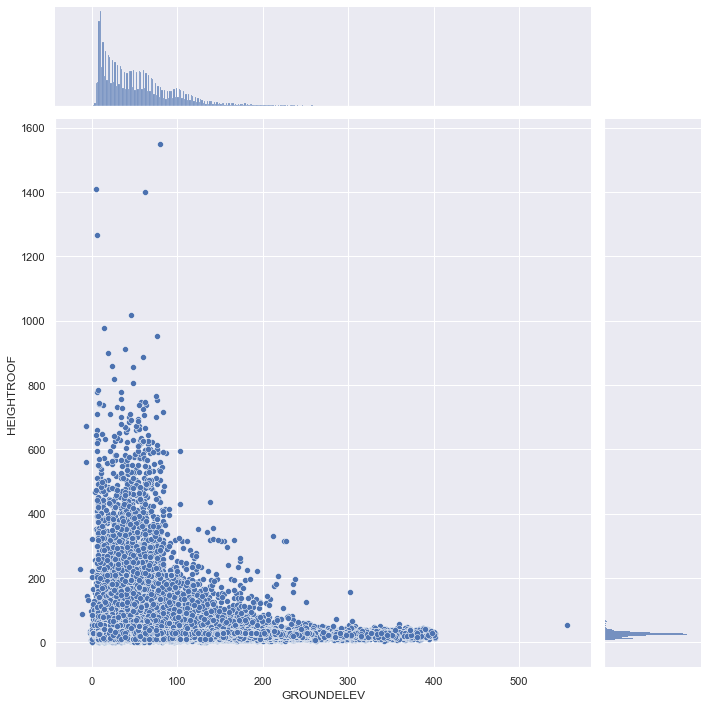

In [93]:
sns.jointplot(x='GROUNDELEV',
              y='HEIGHTROOF',
              data=building_footprints,
              height=10)

plt.tight_layout()
plt.savefig('figures/3-3-1-a')

### Hexbin Plots

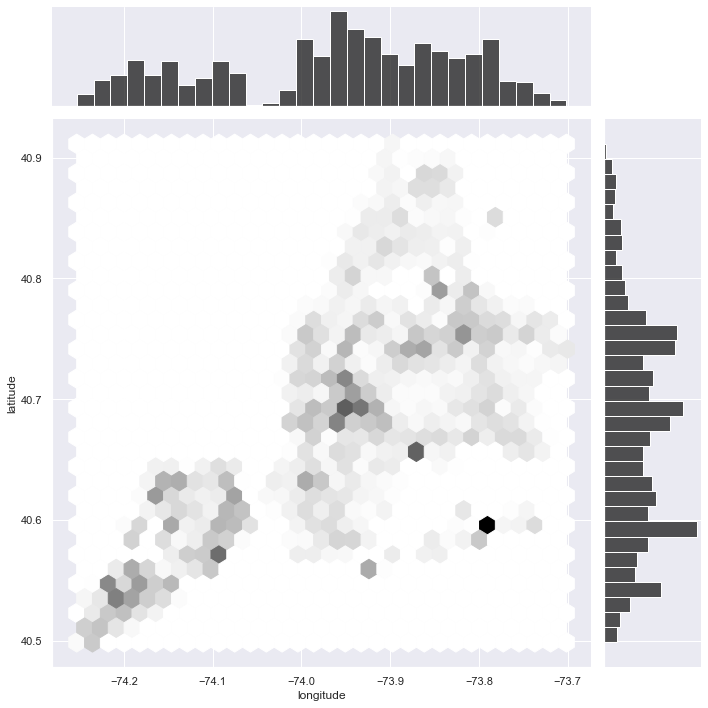

In [94]:
sample = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

sns.jointplot(x='longitude',
              y='latitude', 
              data=sample,
              kind="hex", 
              color="k", 
              height=10) 

plt.tight_layout()
plt.savefig('figures/3-3-2-a')

### Kernel Density Estimation

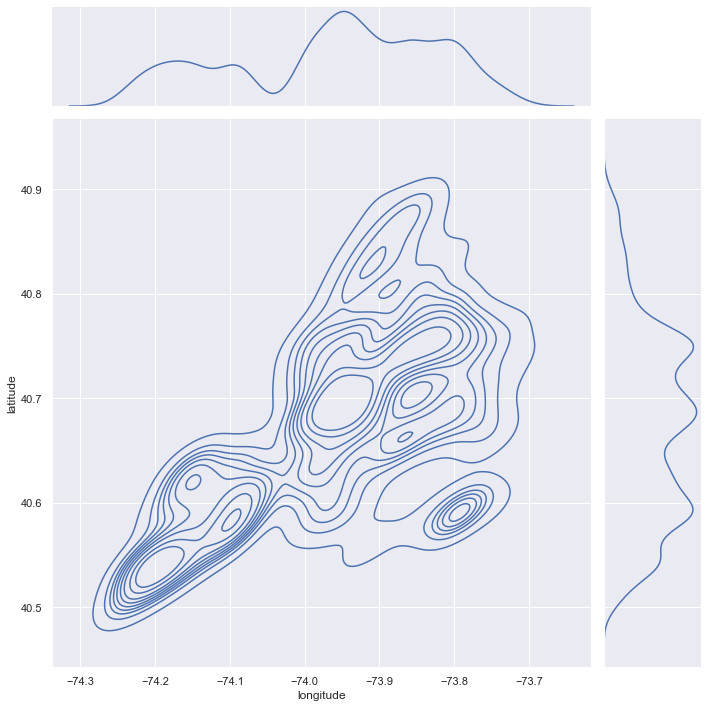

In [95]:
sample = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

sns.jointplot(x='longitude', 
              y='latitude', 
              data=sample, 
              kind="kde", 
              height=10)

plt.tight_layout()
plt.savefig('figures/3-3-3-a')

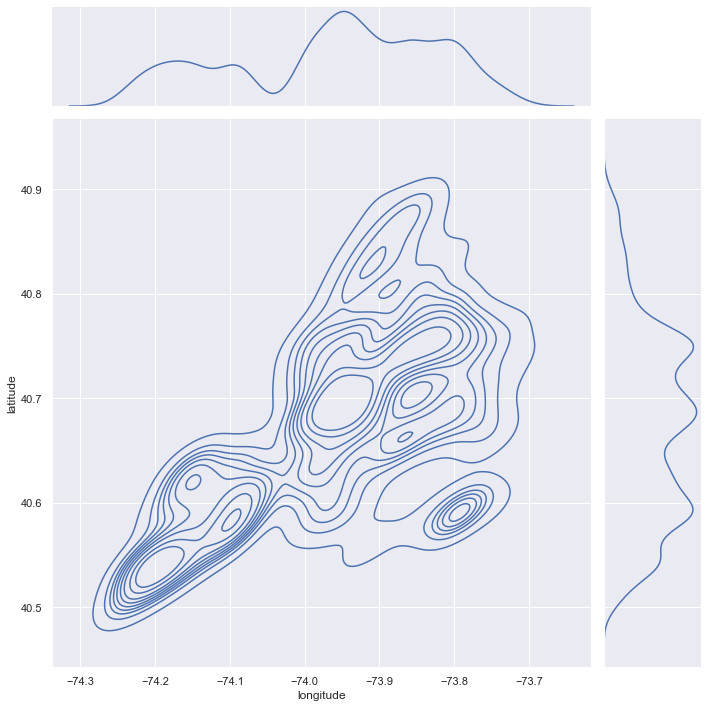

In [96]:
sample = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

sns.jointplot(x='longitude', 
              y='latitude', 
              data=sample, 
              kind="kde", 
              shade=False, 
              height=10)

plt.tight_layout()
plt.savefig('figures/3-3-3-b')

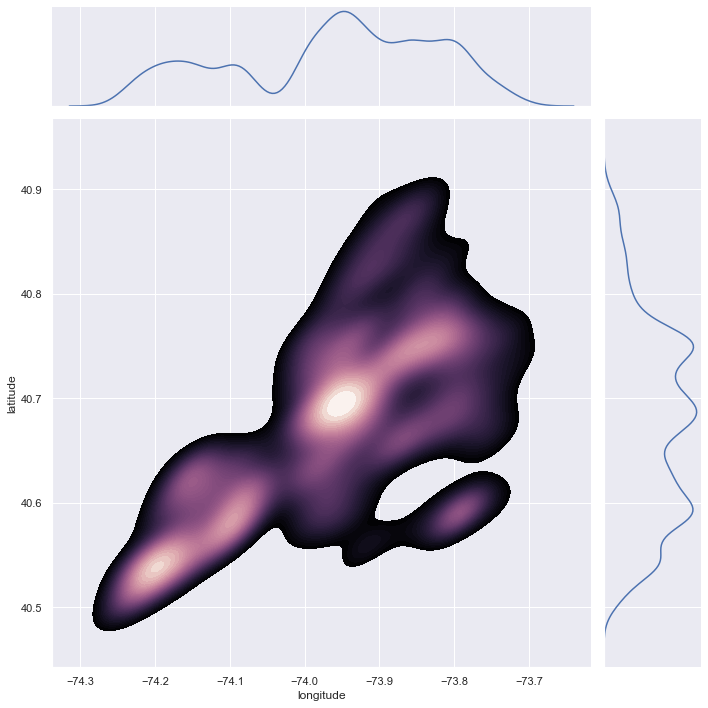

In [97]:
sample = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

cmap = sns.cubehelix_palette(as_cmap=True, 
                             dark=0, 
                             light=1, 
                             reverse=True)

sns.jointplot(x='longitude', 
              y='latitude', 
              data=sample, 
              kind="kde", 
              height=10, 
              cmap=cmap, 
              n_levels=60, 
              shade=True)

plt.tight_layout()
plt.savefig('figures/3-3-3-c')

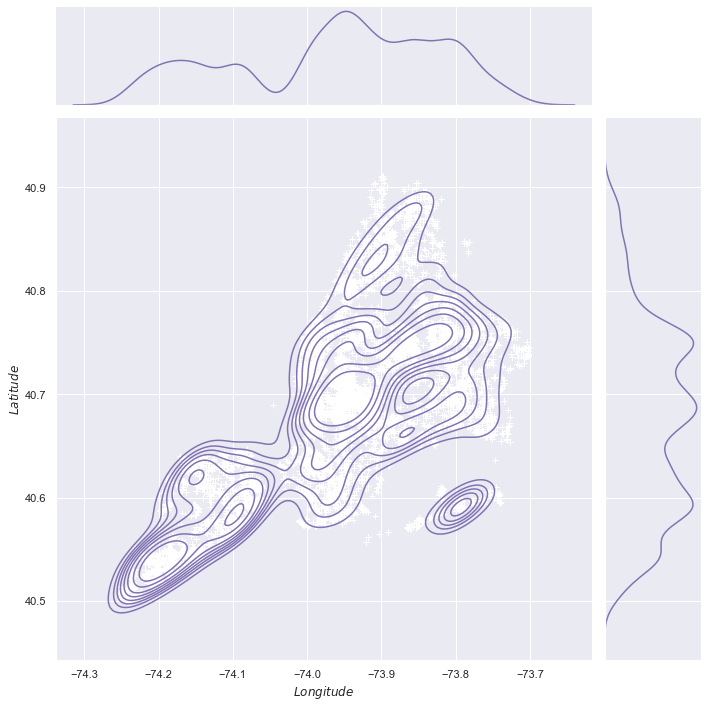

In [98]:
sample = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

g = sns.jointplot(x='longitude', 
                  y='latitude', 
                  data=sample, 
                  kind="kde", 
                  color="m", 
                  height=10)

g.plot_joint(plt.scatter, 
             c="w", 
             s=30, 
             linewidth=1,
             marker="+")

g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$Longitude$", "$Latitude$")
plt.tight_layout()
plt.savefig('figures/3-3-3-d')

## Visualizing Pairwise Relationships in a Dataset

### Pair Plot

In [99]:
building_footprints.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 383415 entries, 0 to 1083620
Data columns (total 43 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   NAME                  867 non-null     object 
 1   the_geom              383415 non-null  object 
 2   CNSTRCT_YR            383415 non-null  float64
 3   BIN                   383415 non-null  int64  
 4   LSTMODDATE            383415 non-null  object 
 5   LSTSTATYPE            383343 non-null  object 
 6   DOITT_ID              383415 non-null  int64  
 7   HEIGHTROOF            381648 non-null  float64
 8   FEAT_CODE             383413 non-null  float64
 9   GROUNDELEV            383130 non-null  float64
 10  SHAPE_AREA            383415 non-null  float64
 11  SHAPE_LEN             383415 non-null  float64
 12  BASE_BBL              383415 non-null  float64
 13  MPLUTO_BBL            383415 non-null  float64
 14  GEOMSOURCE            383323 non-null  object 
 15 

# Analyzing only buildings built between 2010 and 2020
Mostly to speed up the visualizations

In [100]:
# returning only buildings built between 2010 and 2020
building_footprints = building_footprints[building_footprints['CNSTRCT_YR'].between(2010, 2020)]

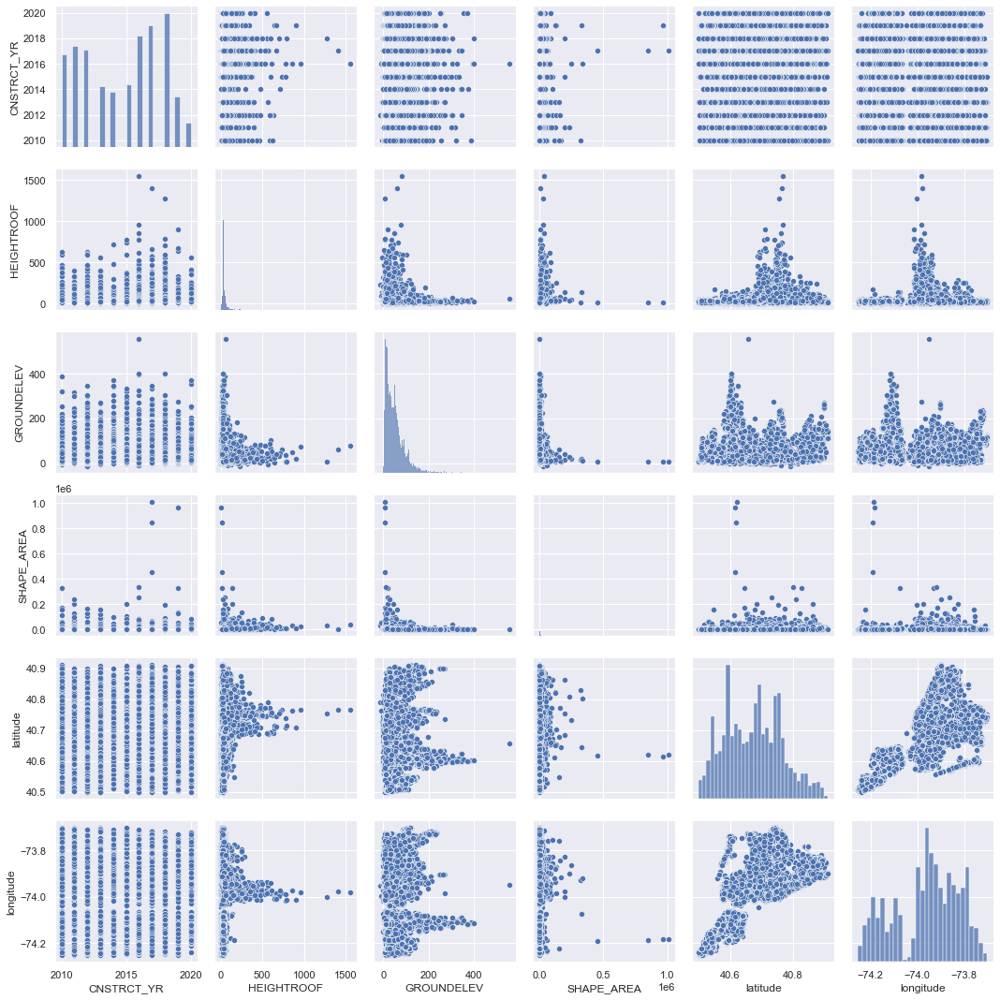

In [101]:
selected = building_footprints[['borough', 
                                'CNSTRCT_YR', 
                                'HEIGHTROOF', 
                                'GROUNDELEV', 
                                'SHAPE_AREA', 
                                'latitude', 
                                'longitude']]

sns.pairplot(selected)

plt.tight_layout()
plt.savefig('figures/3-4-a')

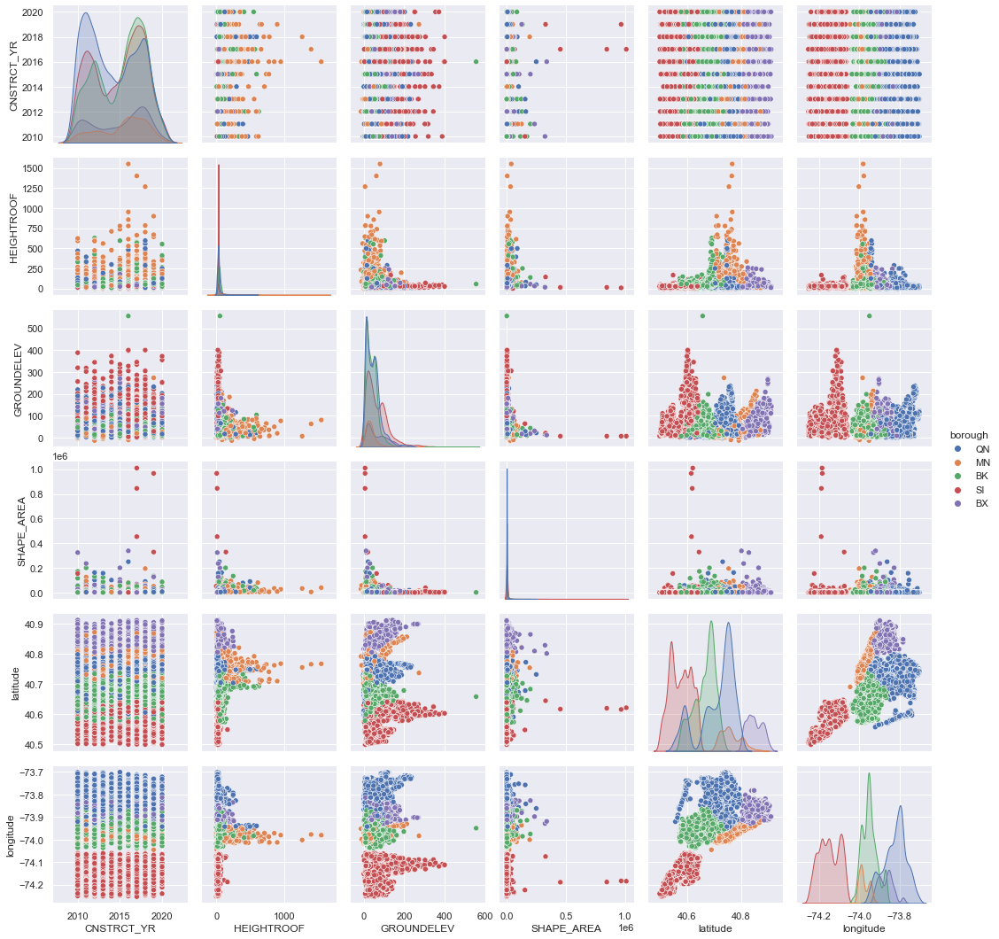

In [102]:
sns.pairplot(selected, 
             hue="borough",
            )

plt.savefig('figures/3-4-b', bbox_inches='tight')

### Heat Maps

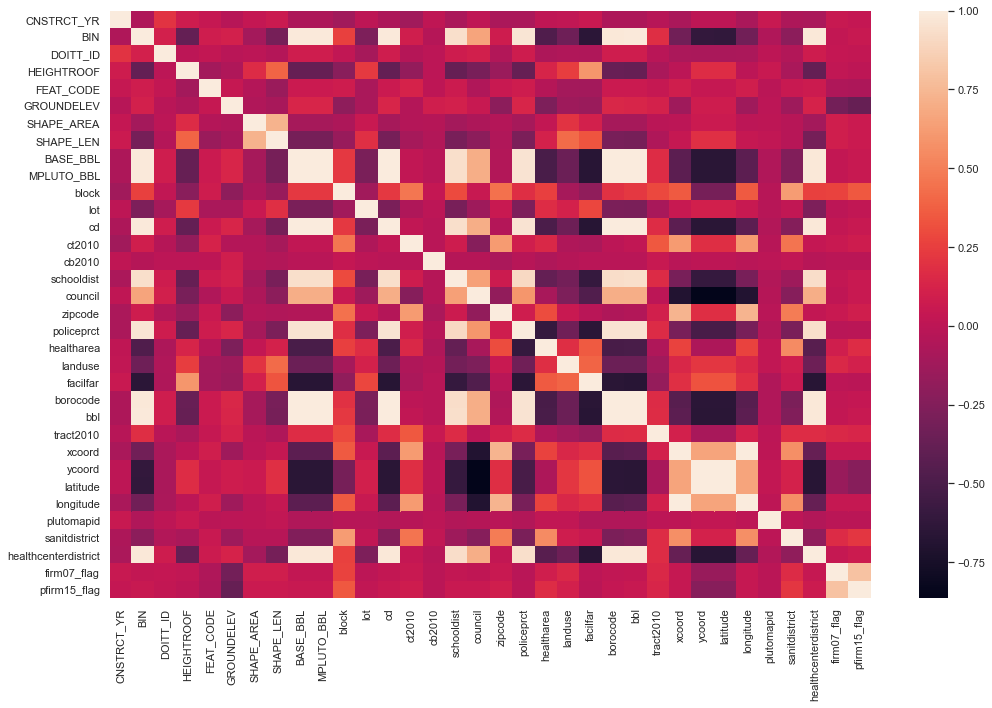

In [103]:
plt.figure(figsize=(15,10))

sns.heatmap(building_footprints.corr())

plt.tight_layout()
plt.savefig('figures/3-5-a')

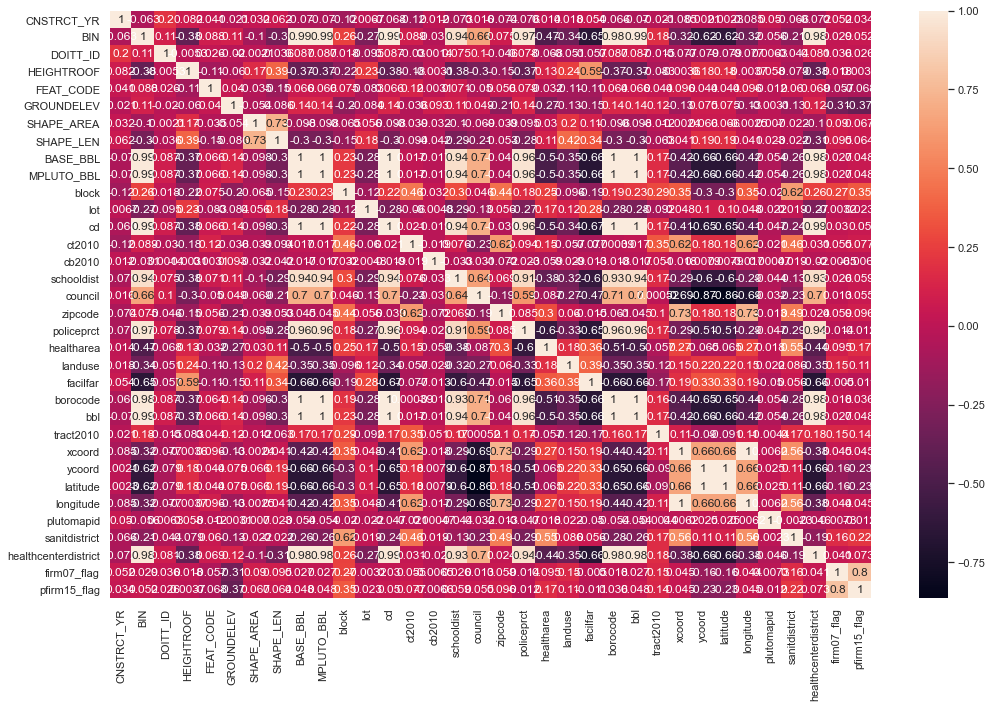

In [104]:
plt.figure(figsize=(15,10))

sns.heatmap(building_footprints.corr(), annot=True)

plt.tight_layout()
plt.savefig('figures/3-5-b')

## Categorical Plots

In [105]:
building_footprints.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13418 entries, 526 to 1083620
Data columns (total 43 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   NAME                  19 non-null     object 
 1   the_geom              13418 non-null  object 
 2   CNSTRCT_YR            13418 non-null  float64
 3   BIN                   13418 non-null  int64  
 4   LSTMODDATE            13418 non-null  object 
 5   LSTSTATYPE            13351 non-null  object 
 6   DOITT_ID              13418 non-null  int64  
 7   HEIGHTROOF            11756 non-null  float64
 8   FEAT_CODE             13416 non-null  float64
 9   GROUNDELEV            13180 non-null  float64
 10  SHAPE_AREA            13418 non-null  float64
 11  SHAPE_LEN             13418 non-null  float64
 12  BASE_BBL              13418 non-null  float64
 13  MPLUTO_BBL            13418 non-null  float64
 14  GEOMSOURCE            13376 non-null  object 
 15  borough        

### Count Plot

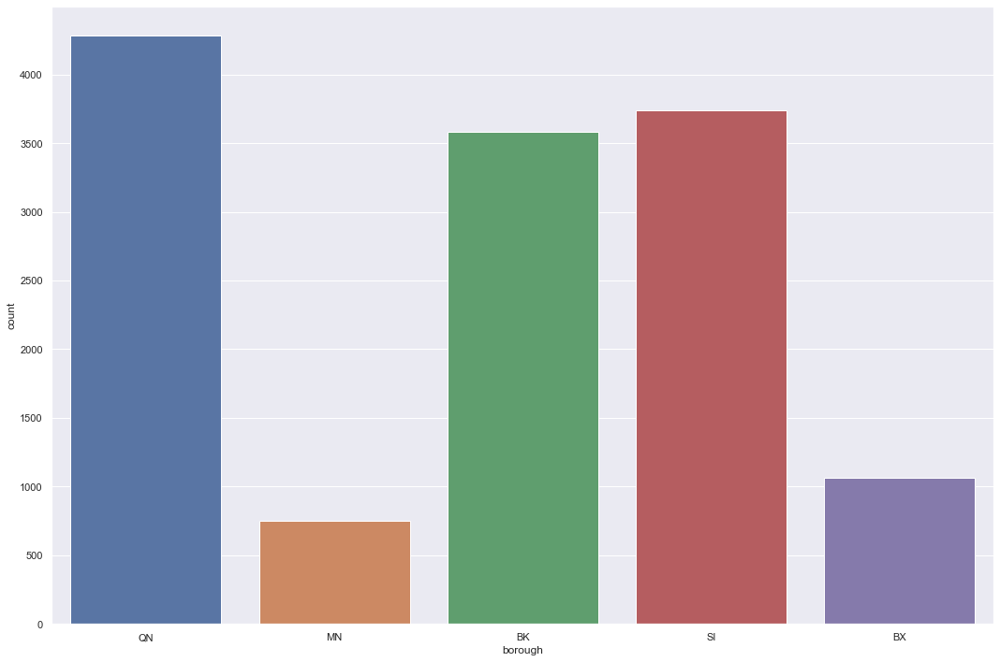

In [106]:
plt.figure(figsize=(15,10))

sns.countplot(x="borough", 
              data=building_footprints)

plt.tight_layout()
plt.savefig('figures/3-6-1-a')

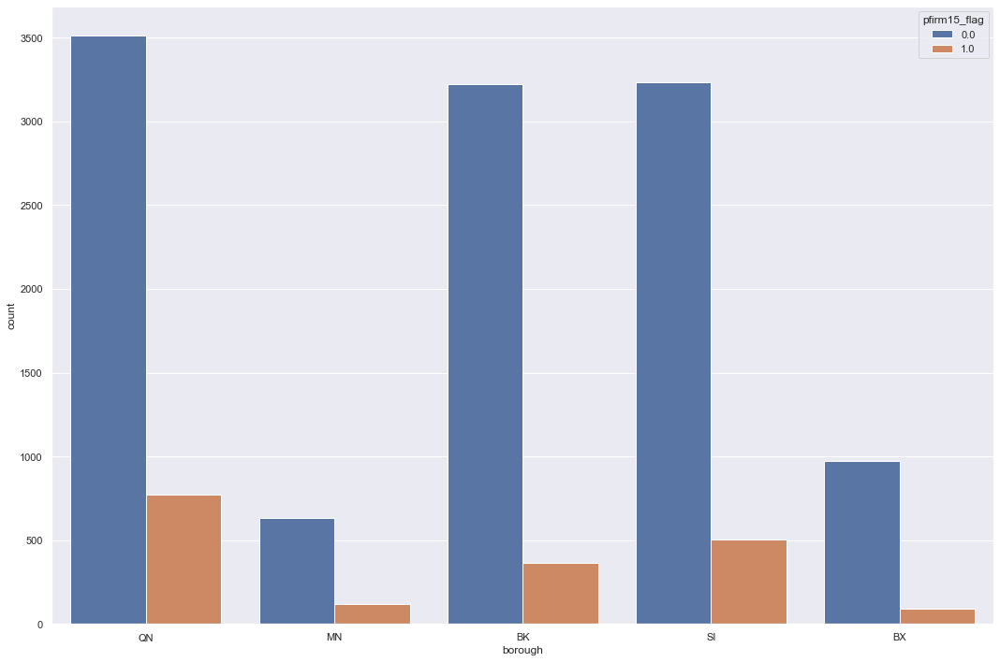

In [107]:
plt.figure(figsize=(15,10))

sns.countplot(x="borough", 
              data=building_footprints,
              hue='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-6-1-b')

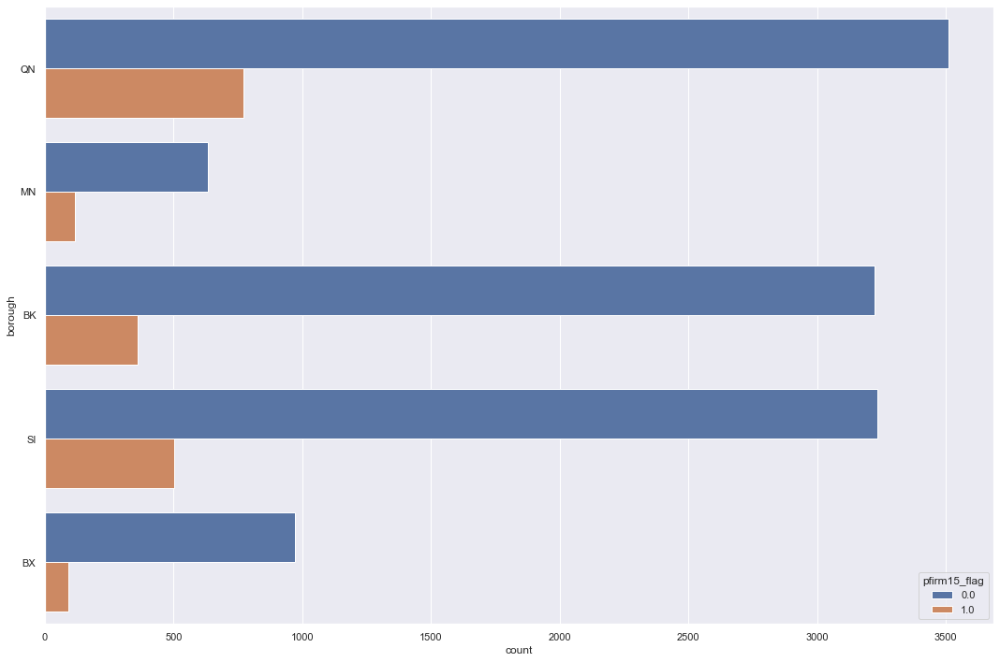

In [108]:
plt.figure(figsize=(15,10))

sns.countplot(y="borough", 
              data=building_footprints,
              hue='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-6-1-c')

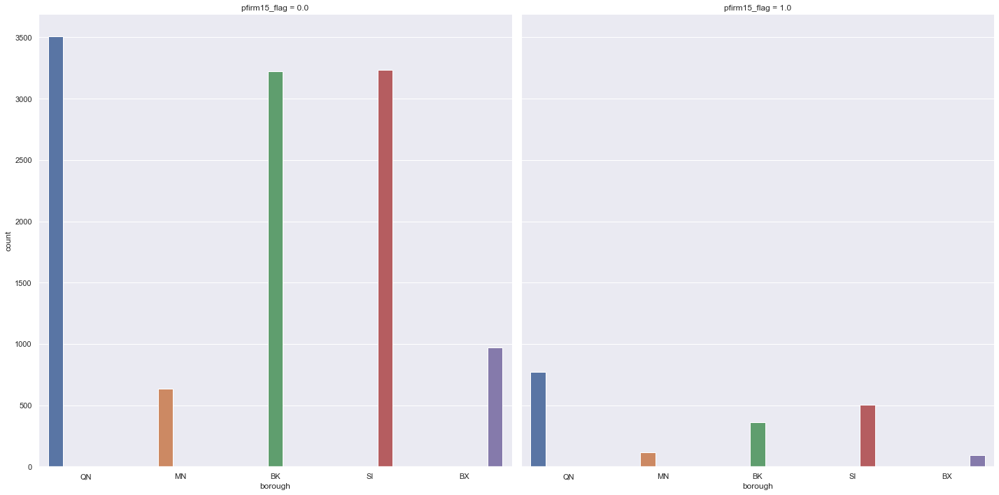

In [109]:
sns.catplot(x="borough", 
            data=building_footprints,
            col='pfirm15_flag',
            hue='borough',
            kind='count',
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-1-d')

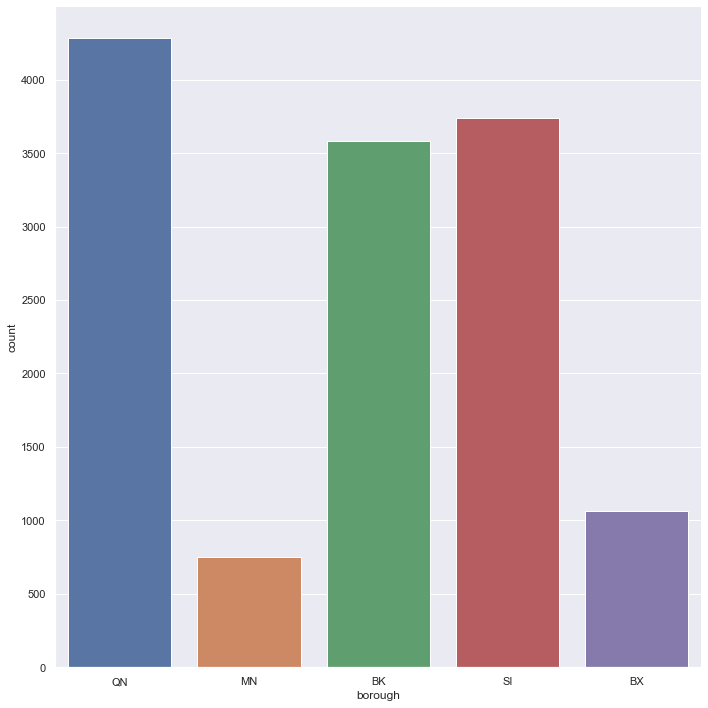

In [110]:
sns.catplot(x="borough", 
            kind="count", 
            data = building_footprints, 
            height = 10)

plt.tight_layout()
plt.savefig('figures/3-6-1-e')

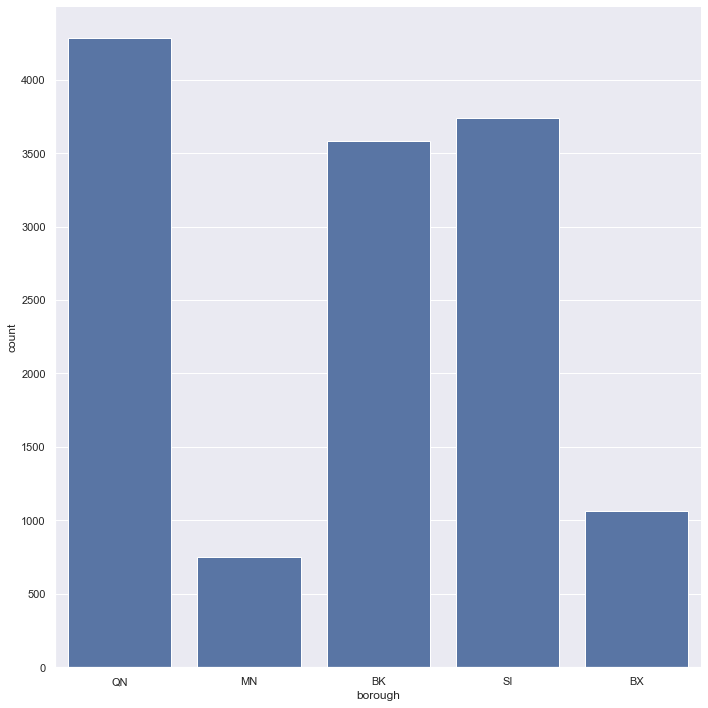

In [111]:
sns.catplot(x="borough", 
            kind="count", 
            data = building_footprints, 
            color="C0", 
            height = 10)

plt.tight_layout()
plt.savefig('figures/3-6-1-f')

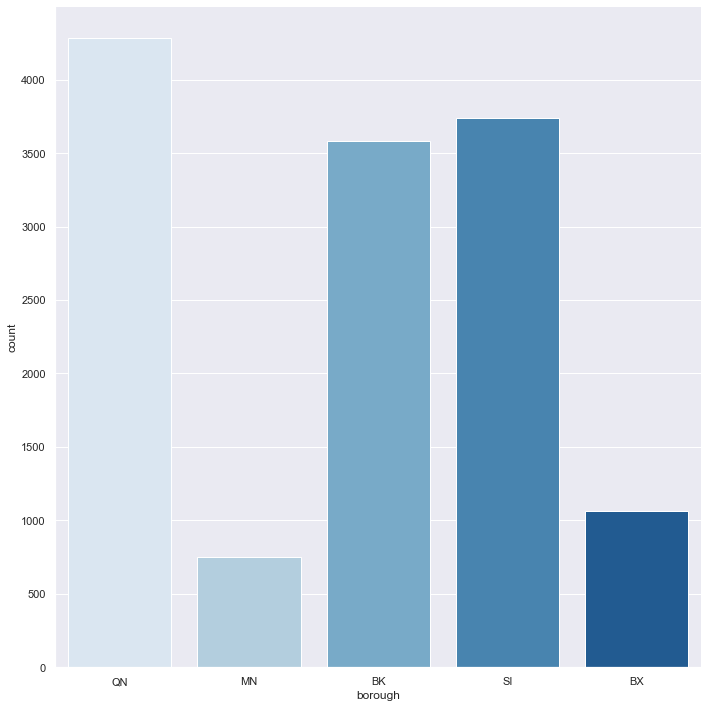

In [112]:
sns.catplot(x="borough", 
            kind="count", 
            palette="Blues", 
            data = building_footprints, 
            height = 10)

plt.tight_layout()
plt.savefig('figures/3-6-1-g')

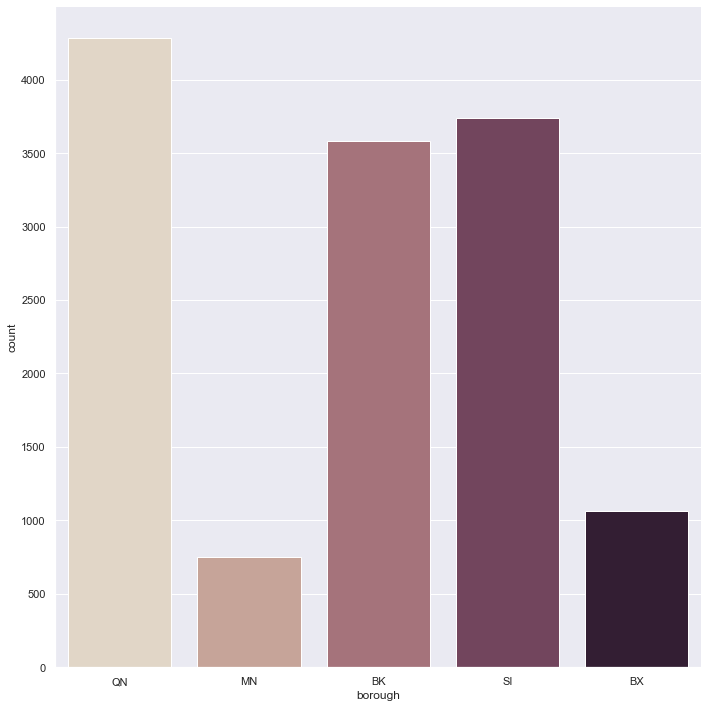

In [113]:
sns.catplot(x="borough", 
            kind="count", 
            palette="ch:.25", 
            data = building_footprints,  
            height = 10)

plt.tight_layout()
plt.savefig('figures/3-6-1-h')

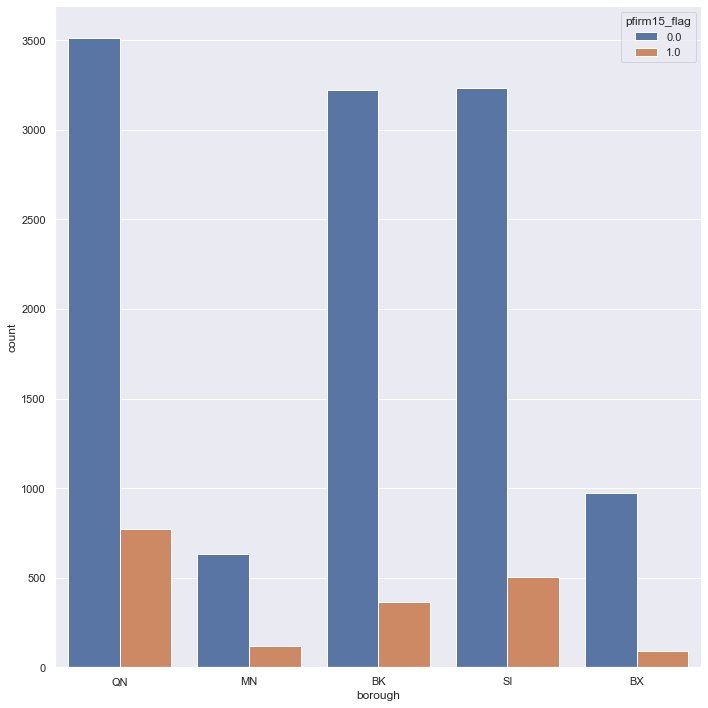

In [114]:
sns.catplot(x="borough",  
            hue="pfirm15_flag", 
            kind="count", 
            data=building_footprints, 
            height = 10, 
            ci=None, 
            legend=False)

plt.legend(loc='upper right', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-1-i')

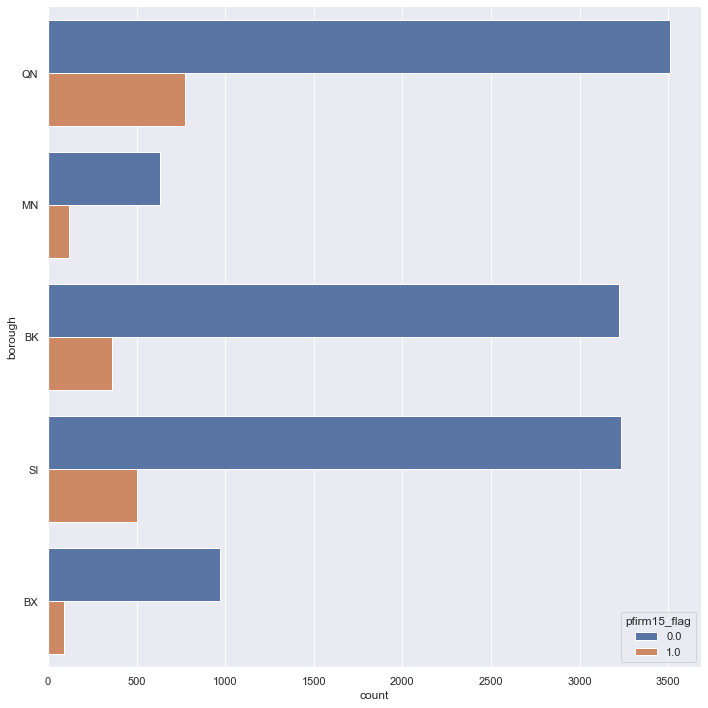

In [115]:
sns.catplot(y="borough",  
            hue="pfirm15_flag", 
            kind="count", 
            data=building_footprints, 
            height = 10, 
            estimator=np.median, 
            ci=None, 
            legend=False)

plt.legend(loc='best', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-1-j')

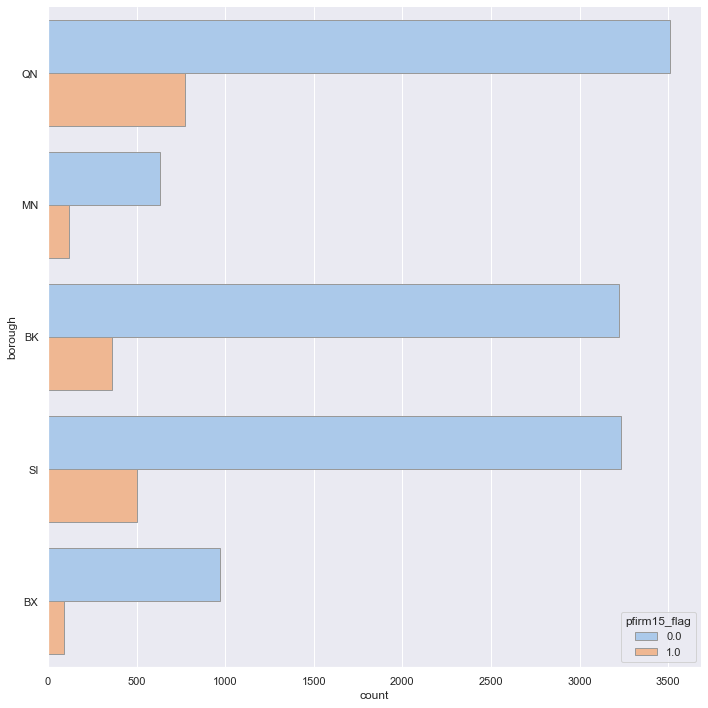

In [116]:
sns.catplot(y="borough", 
            hue="pfirm15_flag", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=building_footprints, 
            height = 10, 
            legend=False)

plt.legend(loc='best', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-1-k')

### Bar Plot

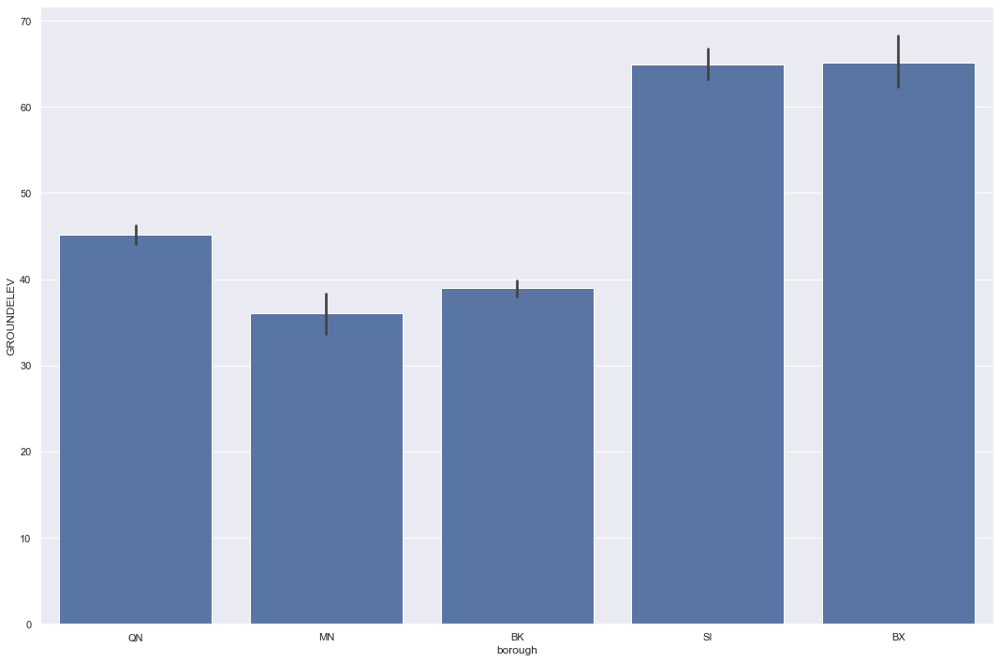

In [117]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV', 
            color="C0")

plt.tight_layout()
plt.savefig('figures/3-6-2-a')

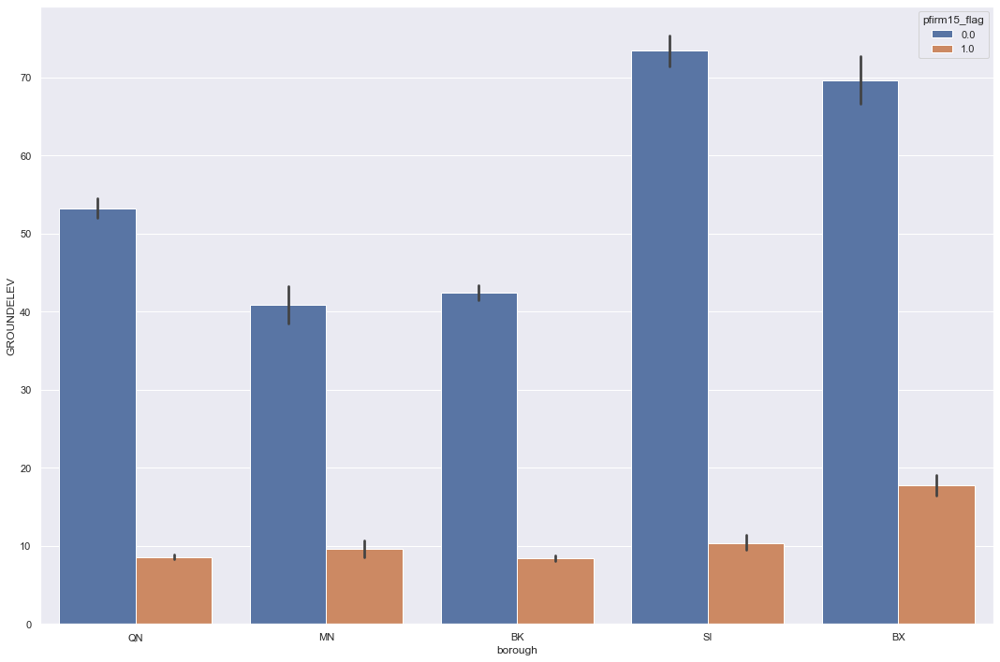

In [118]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV',
            hue='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-6-2-b')

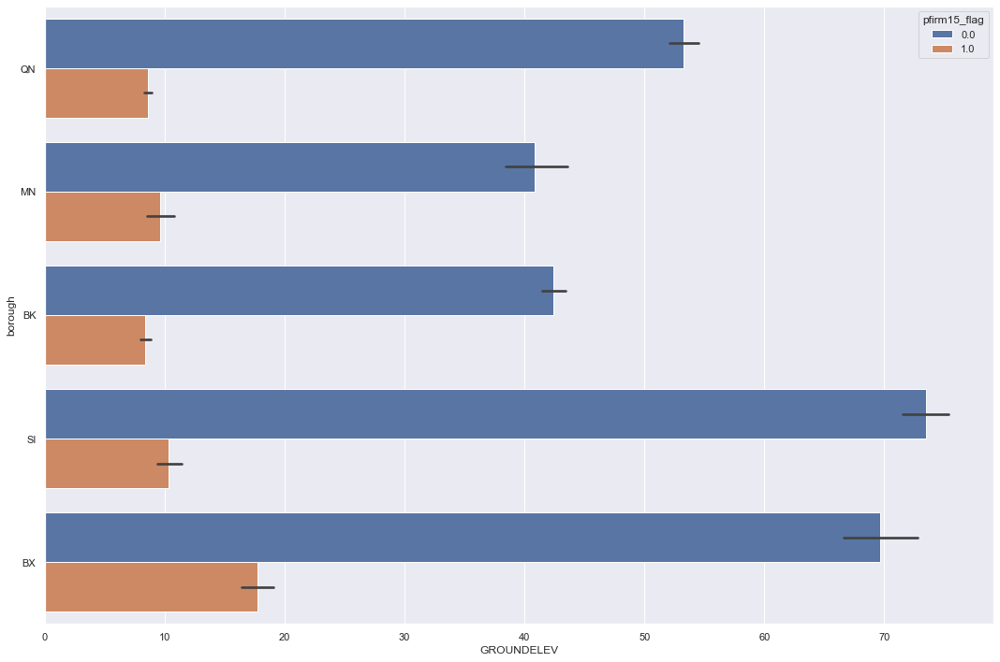

In [119]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='GROUNDELEV',  
            y= 'borough',
            hue='pfirm15_flag')

plt.tight_layout()
plt.savefig('figures/3-6-2-c')

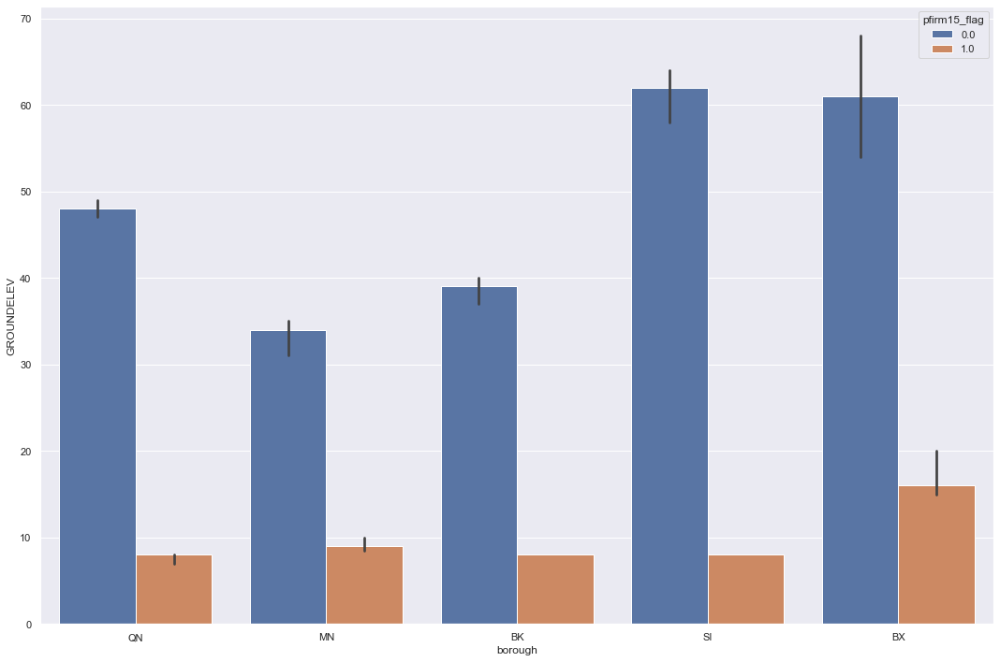

In [120]:
from numpy import median

plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV',
            hue='pfirm15_flag',
            estimator=median)

plt.tight_layout()
plt.savefig('figures/3-6-2-d')

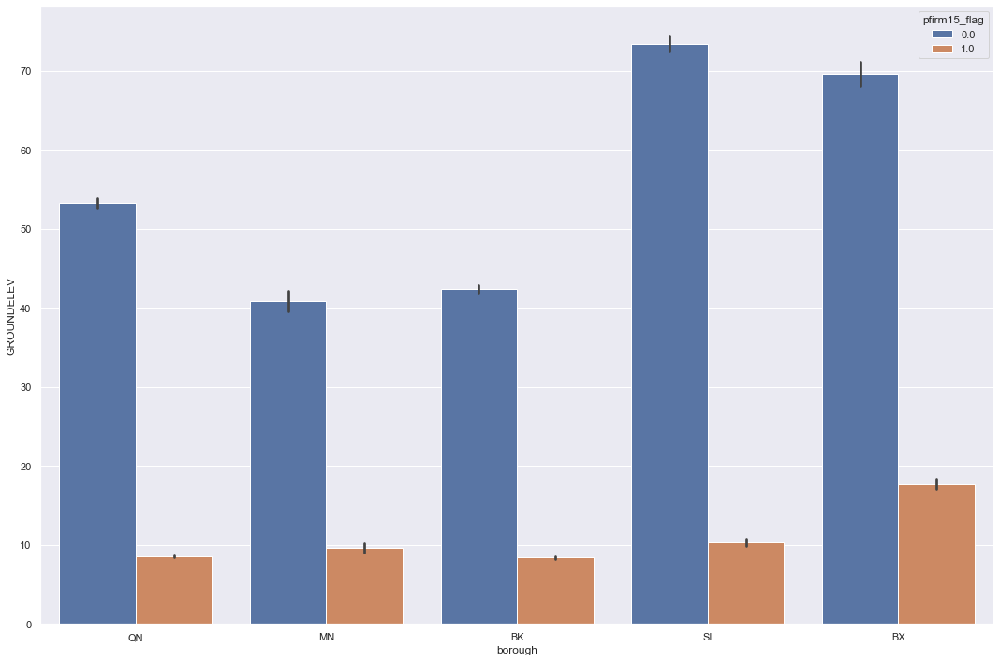

In [121]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV',
            hue='pfirm15_flag',
            ci=68)

plt.tight_layout()
plt.savefig('figures/3-6-2-e')

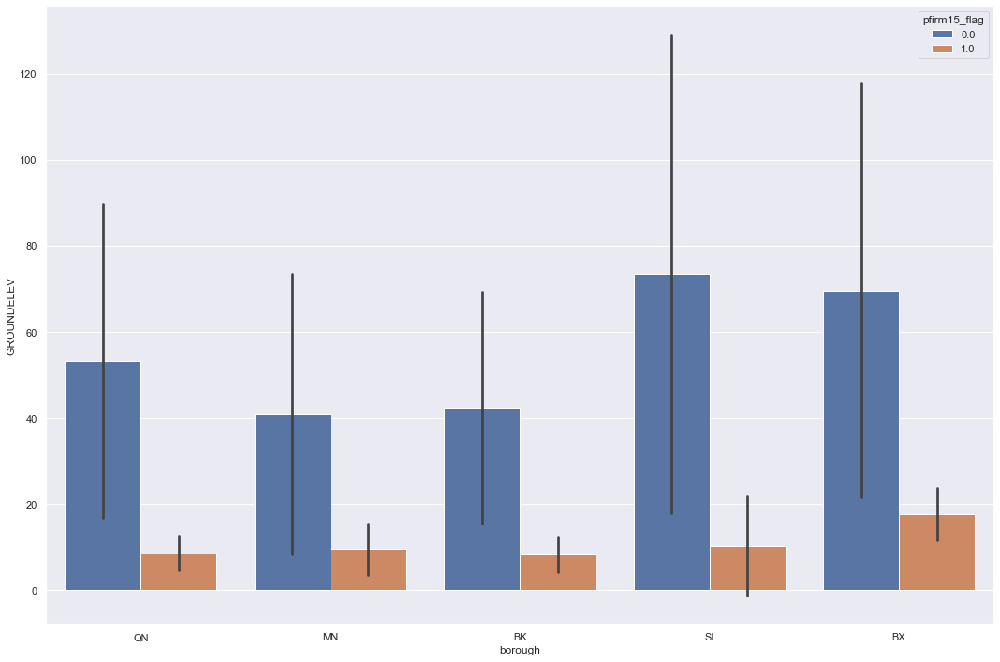

In [122]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV',
            hue='pfirm15_flag',
            ci='sd')

plt.tight_layout()
plt.savefig('figures/3-6-2-f')

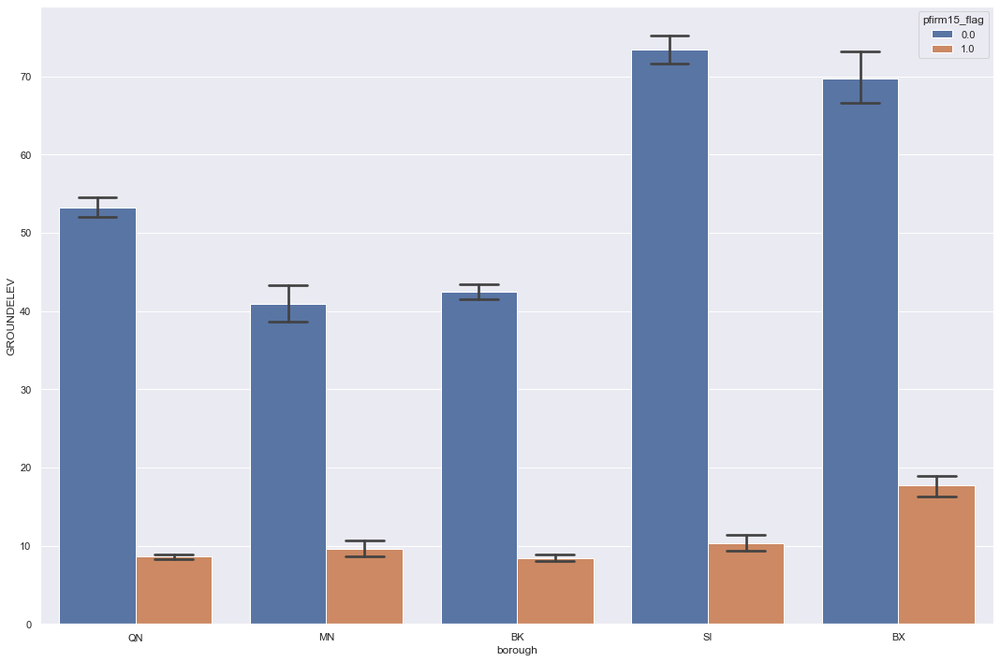

In [123]:
plt.figure(figsize=(15,10))

sns.barplot(data=building_footprints,
            x='borough',  
            y= 'GROUNDELEV',
            hue='pfirm15_flag',
            capsize=.2)

plt.tight_layout()
plt.savefig('figures/3-6-2-g')

### Scatter Plot

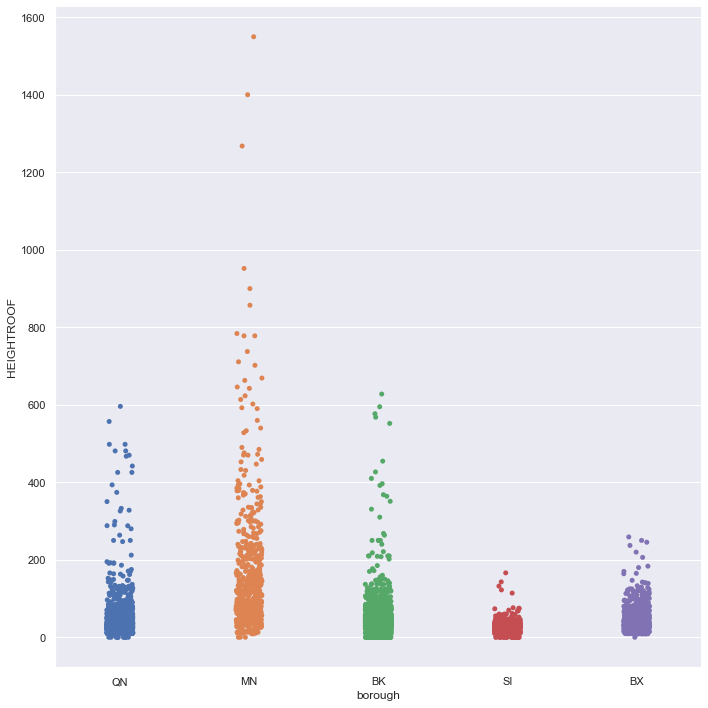

In [124]:
sns.catplot(x='borough', 
            y='HEIGHTROOF', 
            data=building_footprints, 
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-3-a')

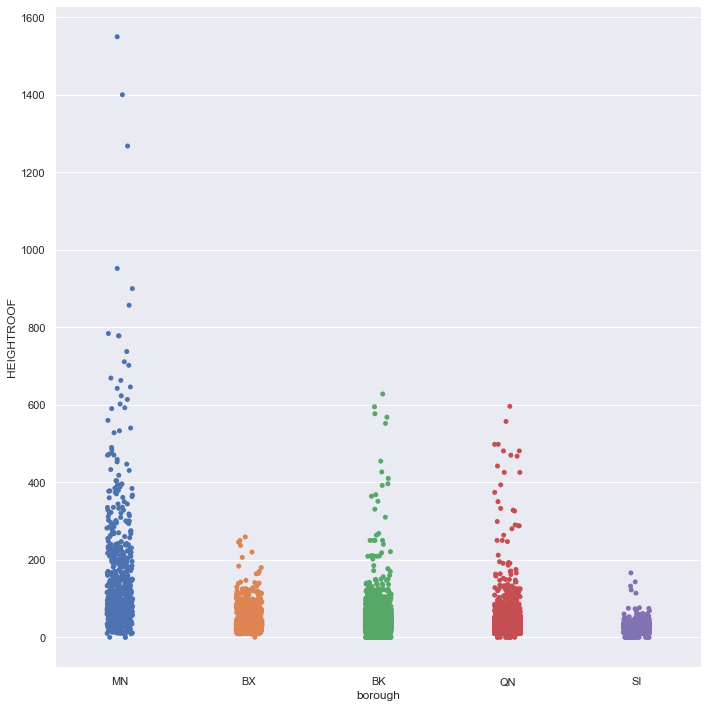

In [125]:
sns.catplot(x='borough', 
            y='HEIGHTROOF', 
            order=["MN", "BX", "BK", "QN", "SI"], 
            data=building_footprints, 
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-3-b')

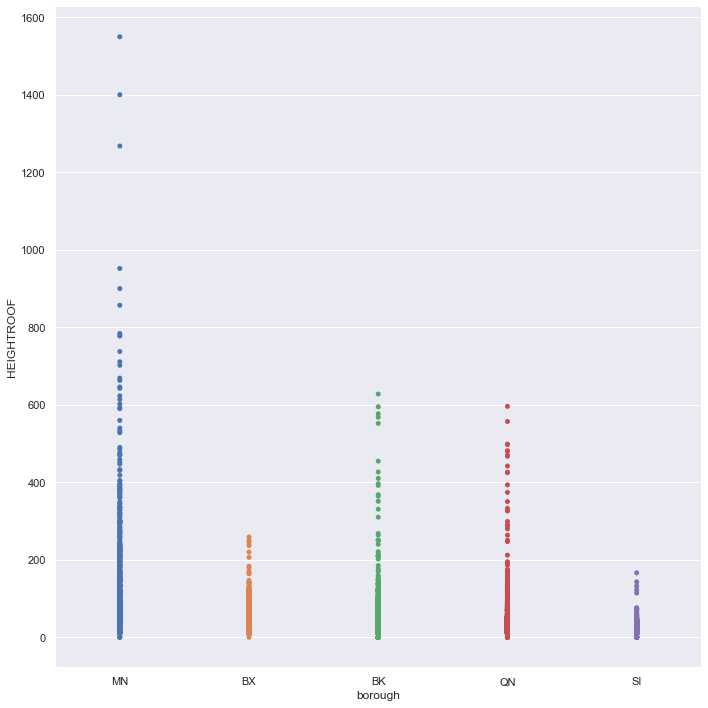

In [126]:
sns.catplot(x='borough', 
            y='HEIGHTROOF', 
            data=building_footprints, 
            order=["MN", "BX", "BK", "QN", "SI"], 
            height=10, 
            jitter=False)

plt.tight_layout()
plt.savefig('figures/3-6-3-c')

### Scatter Plot - Swarm

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 48.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 41.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


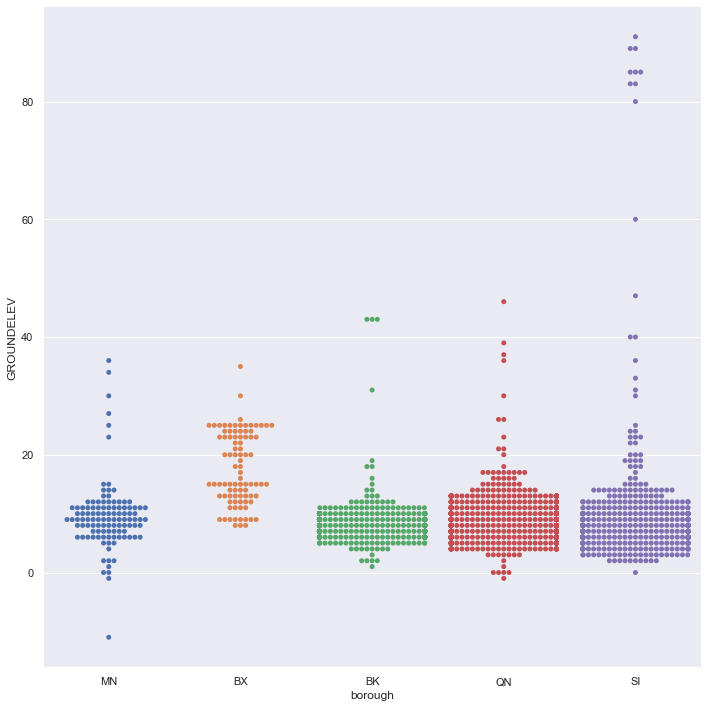

In [127]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order= ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x='borough', 
            y='GROUNDELEV', 
            kind='swarm', 
            order=order, 
            data=data, 
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-4-a')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 48.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 64.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 41.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


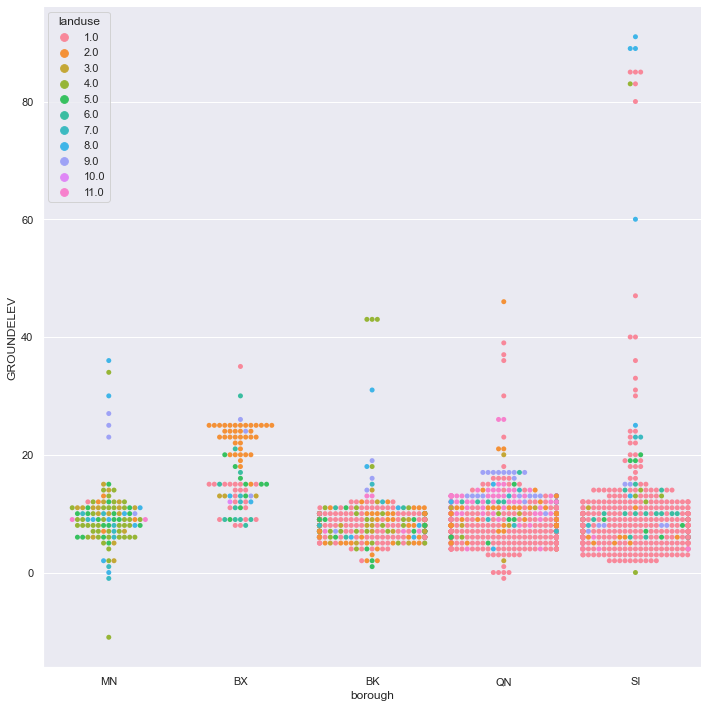

In [128]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order = ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x='borough', 
            y='GROUNDELEV', 
            hue='landuse', 
            kind='swarm', 
            data=data, 
            order=order, 
            height=10,
            legend=False)

plt.legend(loc='upper left', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-4-b')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 48.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 64.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 41.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


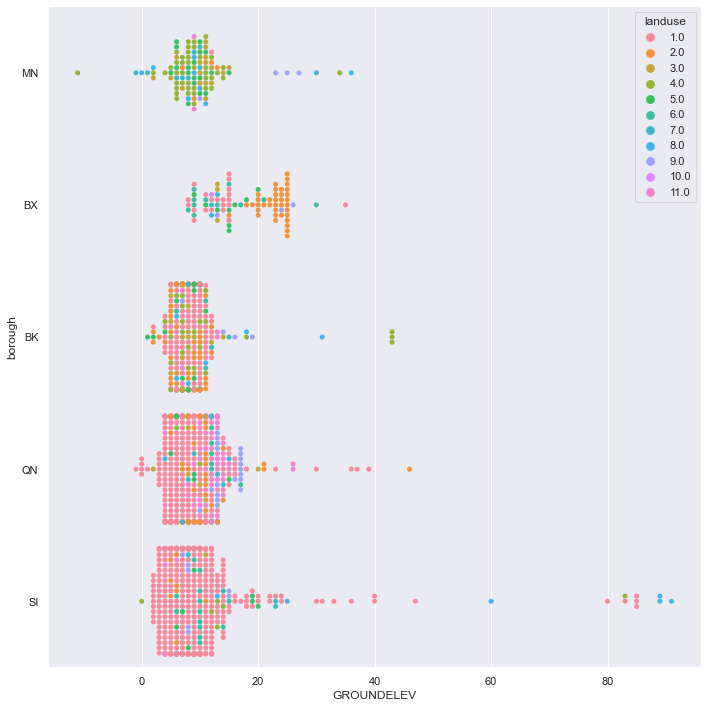

In [129]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order = ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x='GROUNDELEV', 
            y='borough', 
            hue='landuse', 
            kind='swarm', 
            data=data, 
            order=order, 
            height=10,
            legend=False)

plt.legend(loc='upper right', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-4-c')

### Box Plot

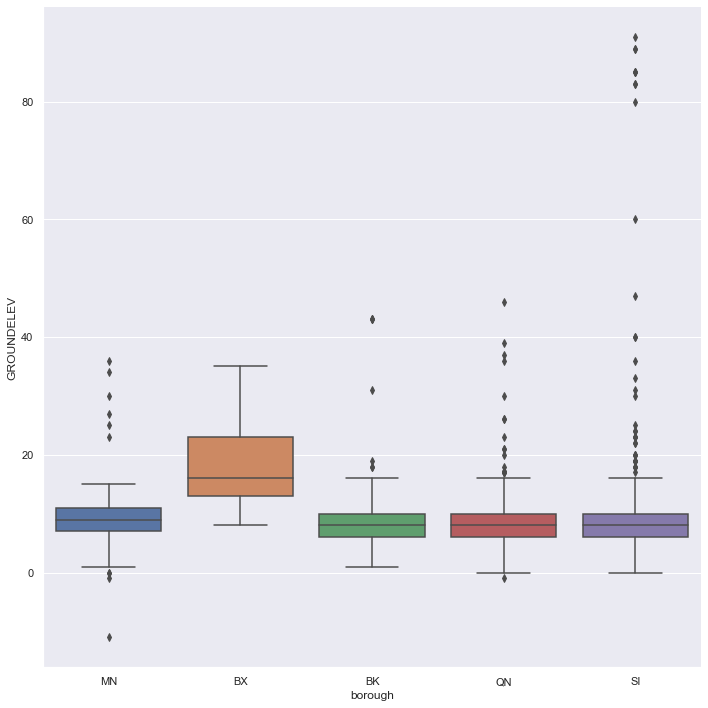

In [130]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order = ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x="borough", 
            y="GROUNDELEV", 
            kind="box", 
            data=data, 
            order=order, 
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-5-a')

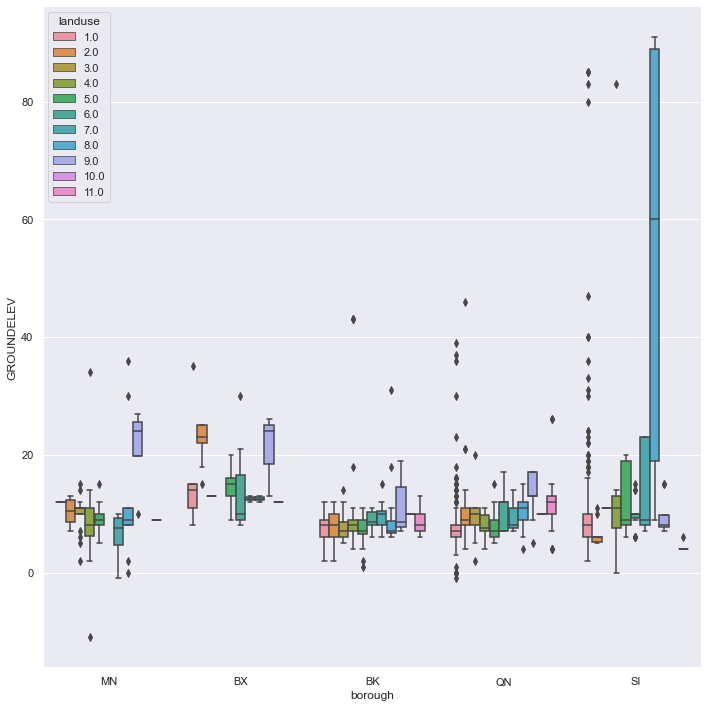

In [131]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order = ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x="borough", 
            y="GROUNDELEV", 
            kind="box", 
            hue='landuse', 
            data=data, 
            order=order, 
            height=10,
            legend=False)

plt.legend(loc='upper left', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-5-b')

### Boxen Plot

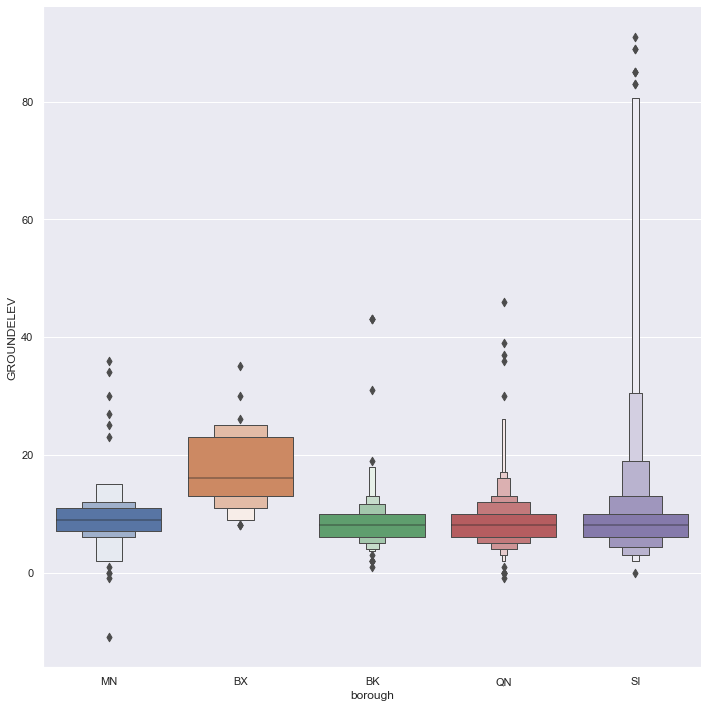

In [132]:
data = building_footprints.loc[building_footprints['pfirm15_flag'] == 1]
order = ["MN", "BX", "BK", "QN", "SI"]

sns.catplot(x="borough", 
            y="GROUNDELEV", 
            kind="boxen", 
            data=data, 
            order=order, 
            height=10)

plt.tight_layout()
plt.savefig('figures/3-6-6-a')

### Violin Plot

In [133]:
(building_footprints['borough'].isin(["MN", "BK"]))

526        False
527        False
528         True
804        False
810        False
           ...  
1083616    False
1083617    False
1083618    False
1083619    False
1083620    False
Name: borough, Length: 13418, dtype: bool

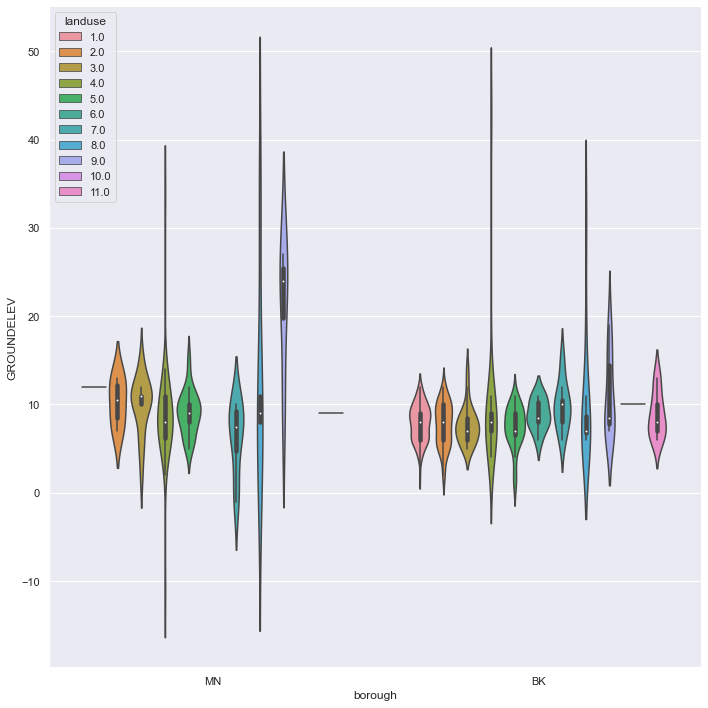

In [134]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="borough", 
            y="GROUNDELEV", 
            kind="violin", 
            hue='landuse', 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper left', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-7-a')

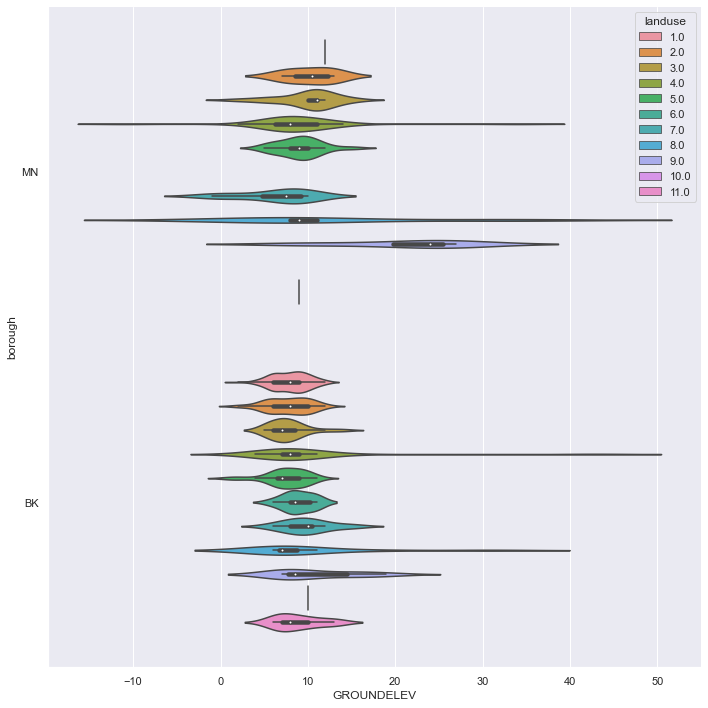

In [135]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                               (building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="GROUNDELEV", 
            y="borough", 
            kind="violin", 
            hue='landuse', 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper right', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-7-b')

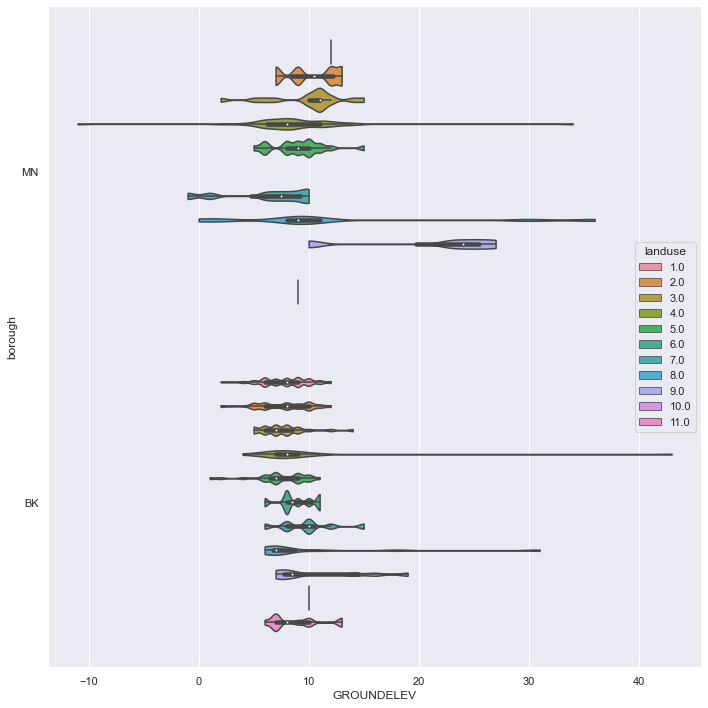

In [136]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="GROUNDELEV", 
            y="borough", 
            kind="violin", 
            hue='landuse', 
            data = data, 
            bw=.15, 
            cut=0, 
            height=10, legend=False)

plt.legend(loc='center right', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-7-c')

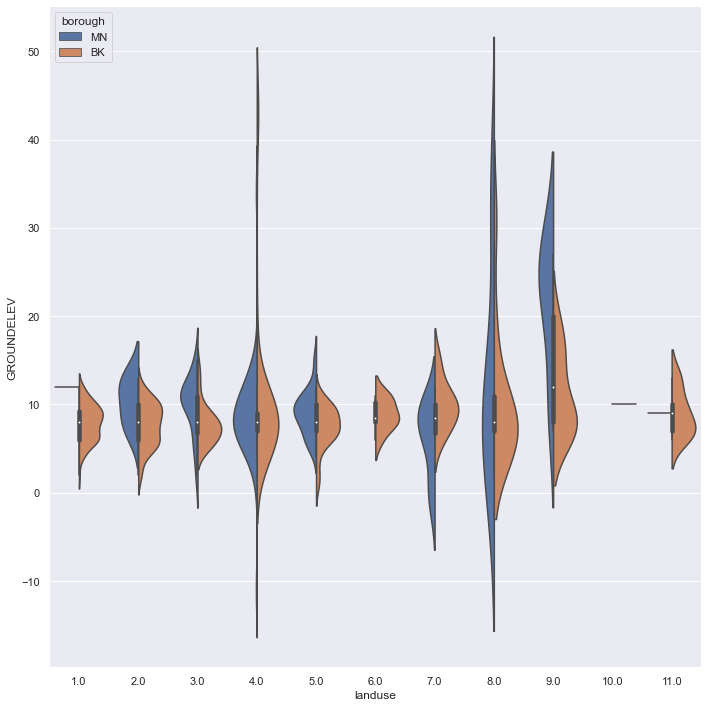

In [137]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="landuse", 
            y="GROUNDELEV", 
            hue="borough", 
            kind="violin", 
            split=True, 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper left', title='borough')
plt.tight_layout()
plt.savefig('figures/3-6-7-d')

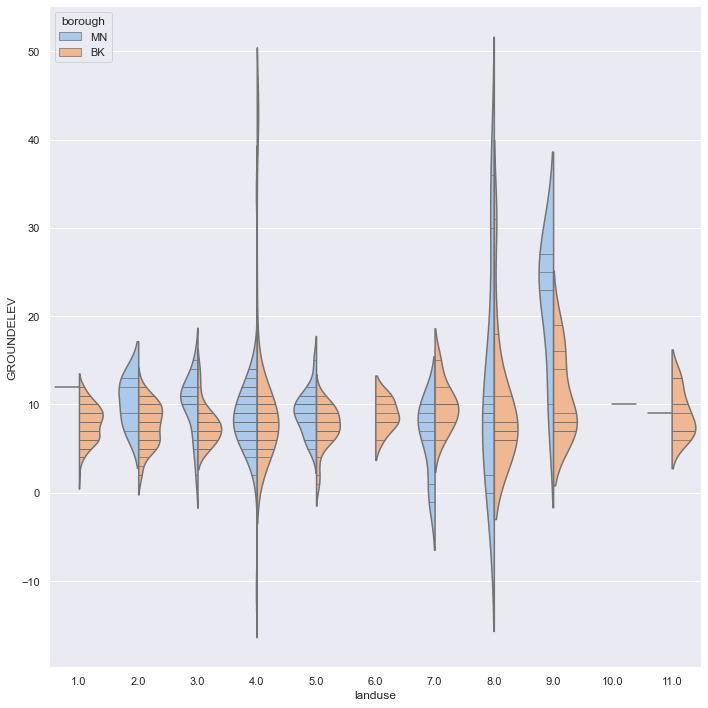

In [138]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="landuse", 
            y="GROUNDELEV", 
            hue="borough", 
            kind="violin", 
            inner="stick", 
            split=True,
            palette="pastel", 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper left', title='borough')
plt.tight_layout()
plt.savefig('figures/3-6-7-e')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


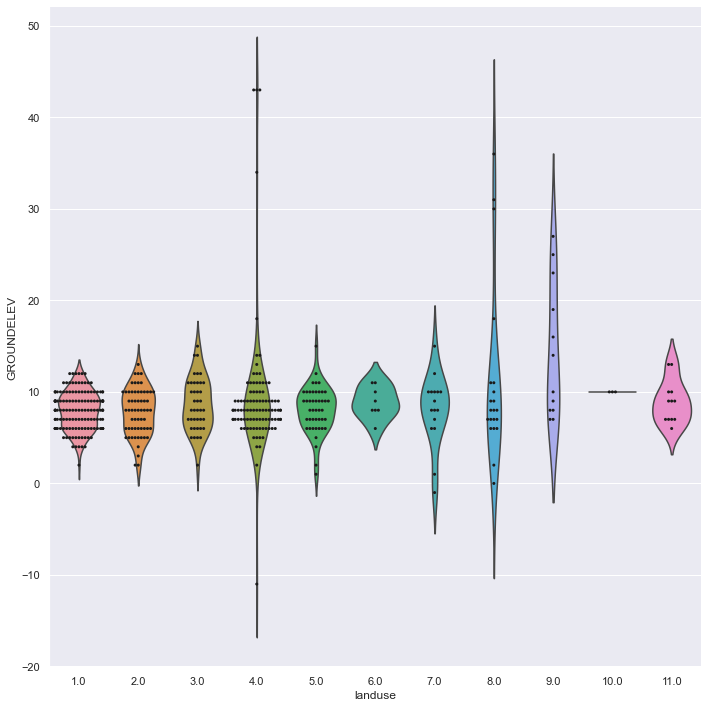

In [139]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN", "BK"]))]

g = sns.catplot(x="landuse", 
                y="GROUNDELEV", 
                kind="violin", 
                inner=None, 
                data=data, 
                height=10)

sns.swarmplot(x="landuse", 
              y="GROUNDELEV", 
              color="k", 
              size=3, 
              data=data, 
              ax=g.ax)

plt.tight_layout()
plt.savefig('figures/3-6-7-f')

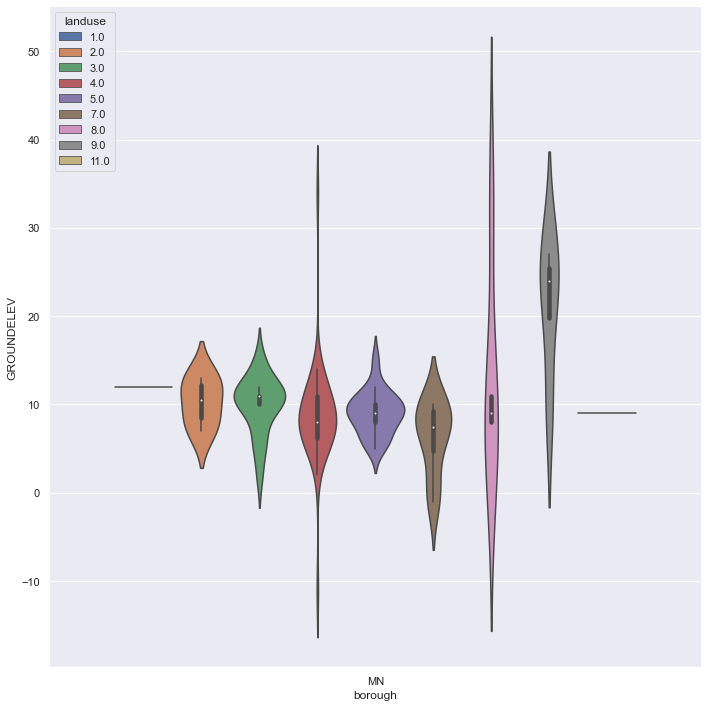

In [140]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                              (building_footprints['borough'].isin(["MN"]))]

sns.catplot(x="borough", 
            y="GROUNDELEV", 
            kind="violin", 
            hue='landuse', 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper left', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-7-g')

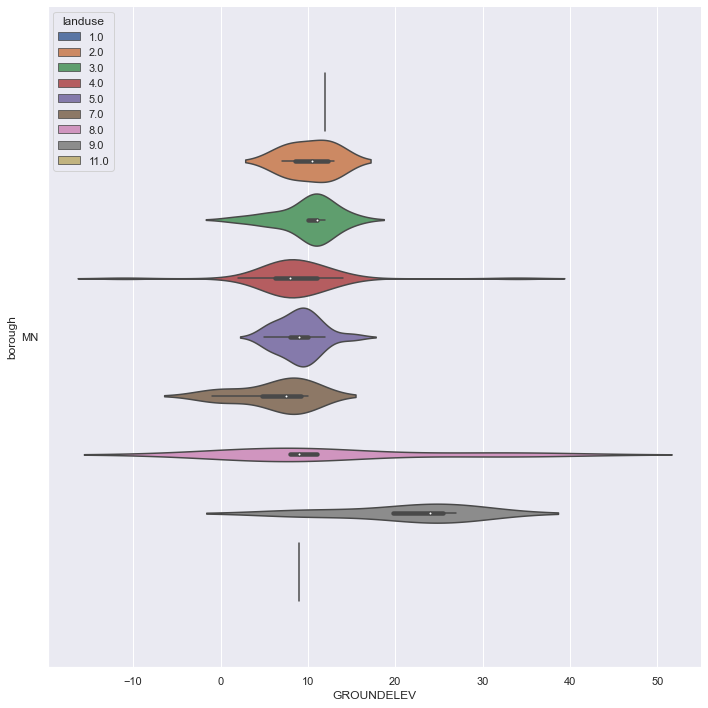

In [141]:
data = building_footprints.loc[(building_footprints['pfirm15_flag'] == 1) & 
                               (building_footprints['borough'].isin(["MN"]))]

sns.catplot(x="GROUNDELEV", 
            y="borough", 
            kind="violin", 
            hue='landuse', 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper left', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-7-h')

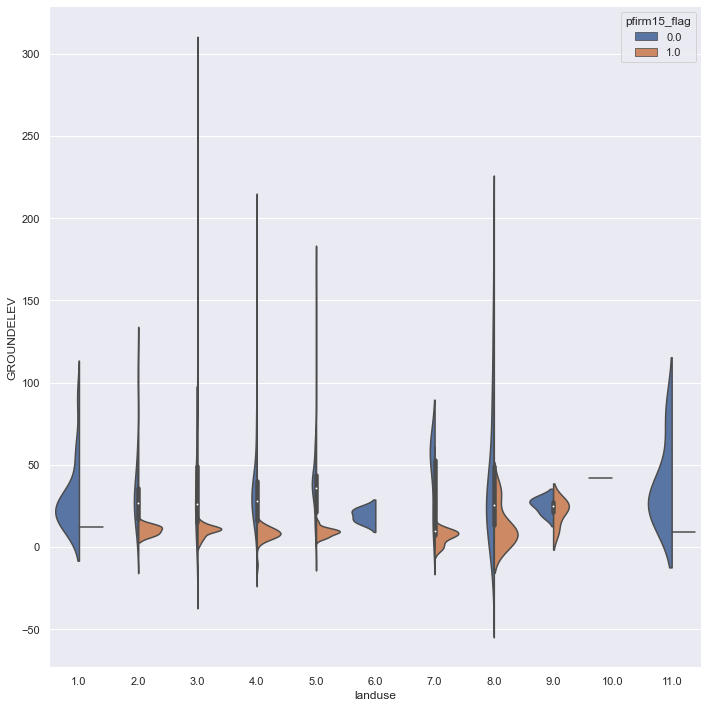

In [142]:
data = building_footprints.loc[building_footprints['borough'].isin(["MN"])]

sns.catplot(x="landuse", 
            y="GROUNDELEV", 
            hue="pfirm15_flag", 
            kind="violin", 
            split=True, 
            data=data, 
            height=10, 
            legend=False)

plt.legend(loc='upper right', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-7-i')

### Point Plot

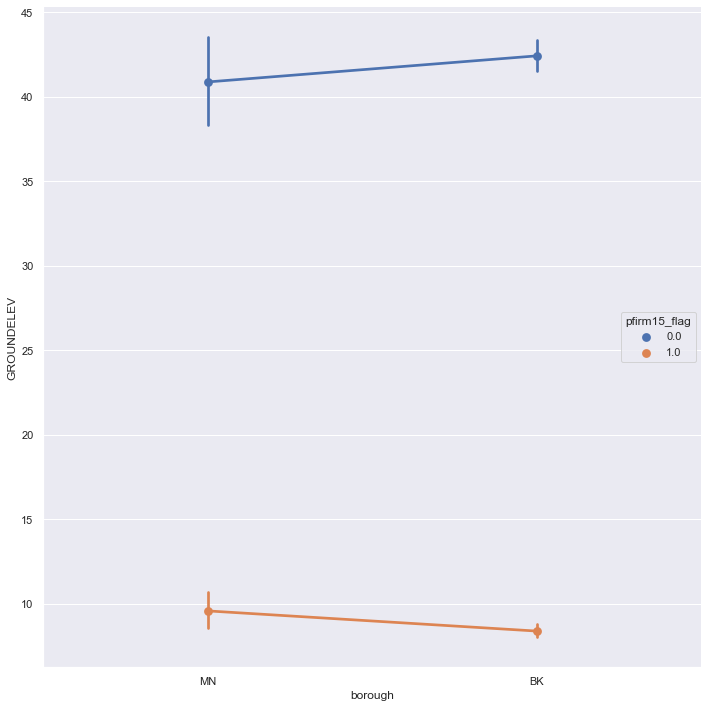

In [143]:
data = building_footprints.loc[(building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="borough", 
            y='GROUNDELEV',
            hue="pfirm15_flag", 
            kind="point", 
            data=data,
            height=10, 
            legend=False)

plt.legend(loc='center right', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-8-a')

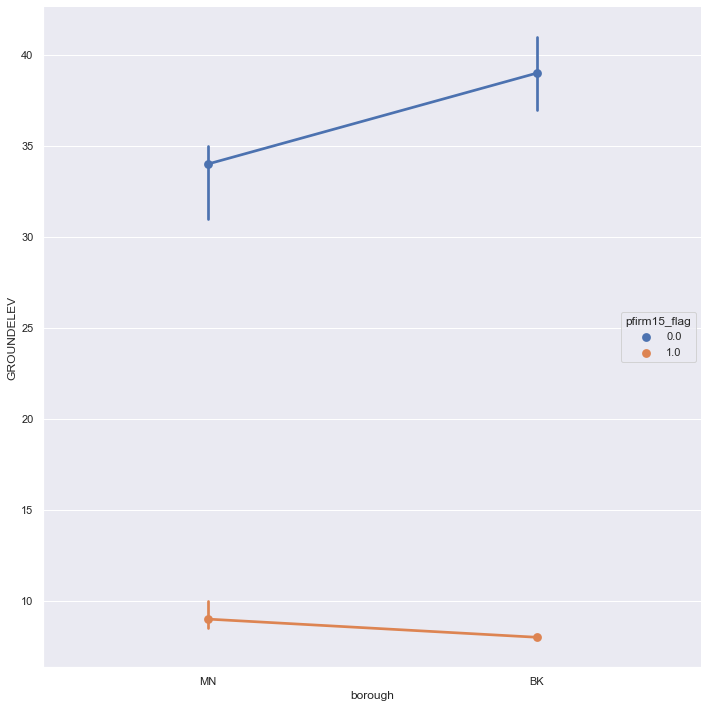

In [144]:
data = building_footprints.loc[(building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="borough", 
            y='GROUNDELEV',
            hue="pfirm15_flag", 
            kind="point", 
            data=data,
            height = 10, 
            estimator=np.median,
            legend=False)

plt.legend(loc='center right', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-8-b')

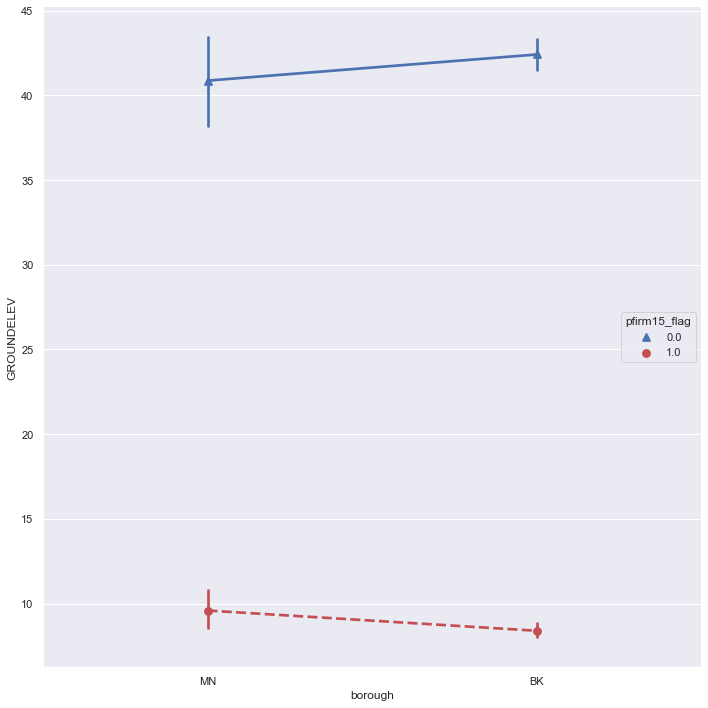

In [145]:
data = building_footprints.loc[(building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="borough", 
            y='GROUNDELEV',
            hue="pfirm15_flag",
            palette={0.0: "b", 1.0: "r"},
            markers=["^", "o"], linestyles=["-", "--"],
            kind="point", 
            data=data, 
            height = 10,
            legend=False)

plt.legend(loc='center right', title='pfirm15_flag')
plt.tight_layout()
plt.savefig('figures/3-6-8-c')

### Showing Multiple Relationships with Facets

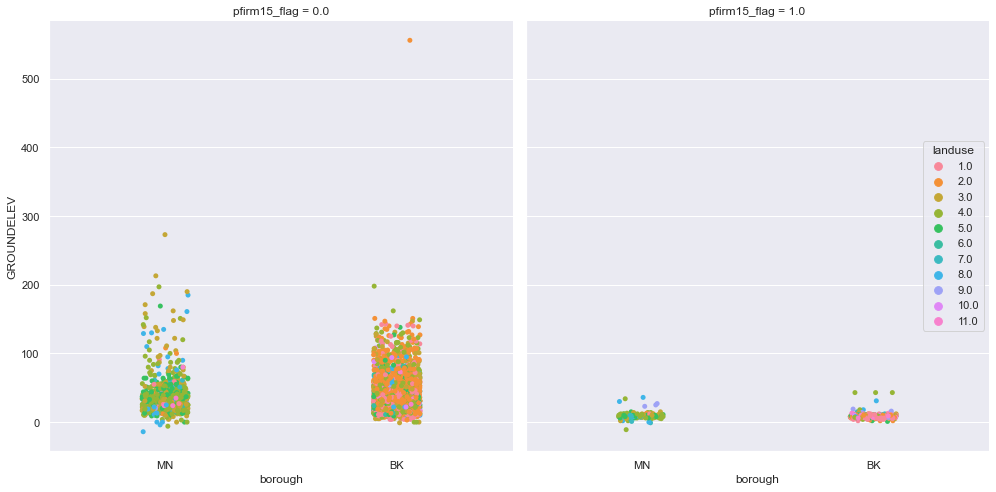

In [146]:
data = building_footprints.loc[(building_footprints['borough'].isin(["MN", "BK"]))]

sns.catplot(x="borough", 
            y="GROUNDELEV",
            hue="landuse",
            col="pfirm15_flag", 
            height = 7, 
            data=data,
            legend=False)

plt.legend(loc='center right', title='landuse')
plt.tight_layout()
plt.savefig('figures/3-6-9-a')

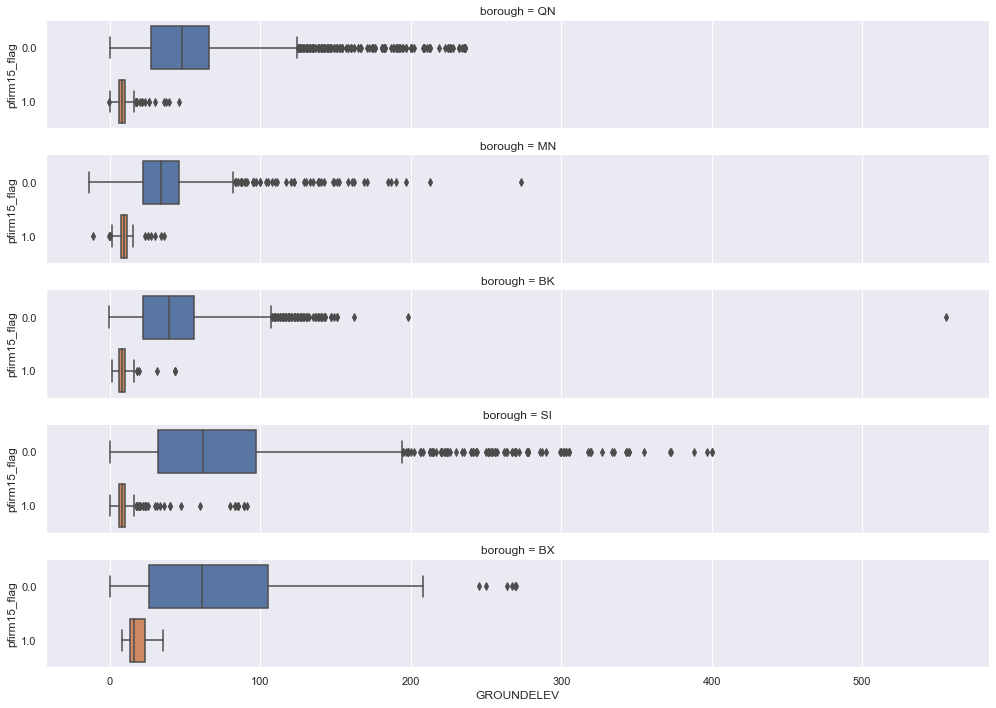

In [147]:
data = building_footprints

sns.catplot(x="GROUNDELEV", 
            y="pfirm15_flag", 
            row="borough",
            kind="box", 
            orient="h", 
            height = 2, 
            aspect = 7, 
            data=data)

plt.tight_layout()
plt.savefig('figures/3-6-9-b')

# 4. Plotting with Pandas 

## Line Plot

In [148]:
by_year = building_footprints.groupby('CNSTRCT_YR')[['DOITT_ID']].count()
by_year.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)
by_year = by_year.reset_index()
by_year['CNSTRCT_YR'] = by_year['CNSTRCT_YR'].astype(int)

by_year.head()

,CNSTRCT_YR,count
0,2010,1360
1,2011,1484
2,2012,1432
3,2013,891
4,2014,809


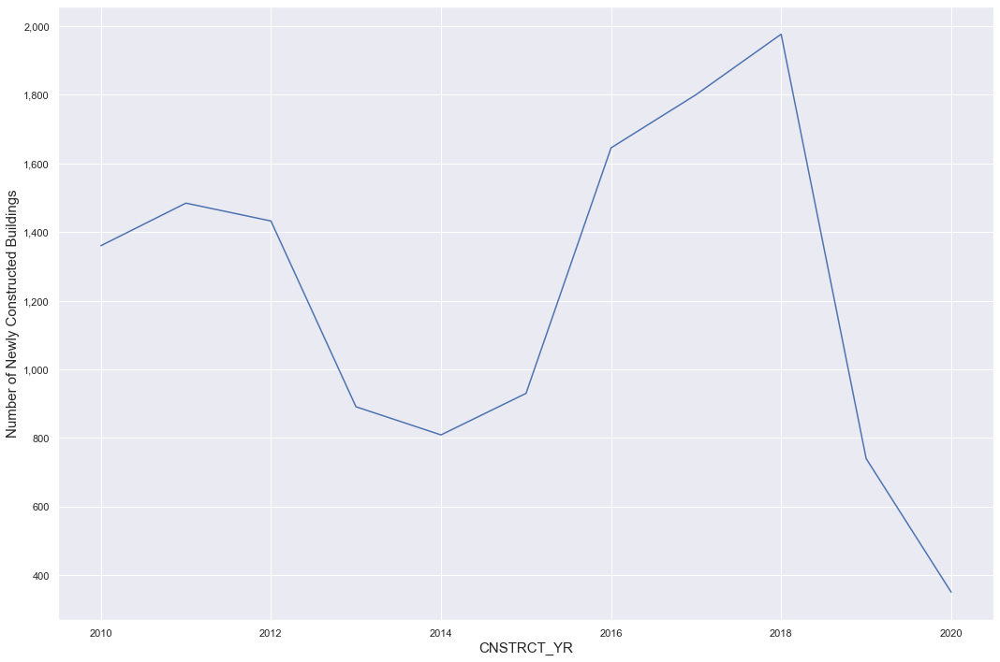

In [149]:
fig, ax = plt.subplots(figsize=(15,10))

by_year.plot(x='CNSTRCT_YR', 
             y='count', 
             legend=False, 
             ax=ax)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xlabel('CNSTRCT_YR', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-1-a')

## Timeseries Plot

In [150]:
g = building_footprints.groupby('CNSTRCT_YR')['DOITT_ID'].count().reset_index()
g.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)

g.set_index('CNSTRCT_YR', drop=False, inplace=True)
g.index = g.index.astype('int64')

# transforming our 'Year' index to datetime
g.index = pd.to_datetime(g.index, format='%Y')

g.index.dtype

dtype('<M8[ns]')

In [151]:
g.head()

,CNSTRCT_YR,count
2010-01-01,2010.0,1360
2011-01-01,2011.0,1484
2012-01-01,2012.0,1432
2013-01-01,2013.0,891
2014-01-01,2014.0,809


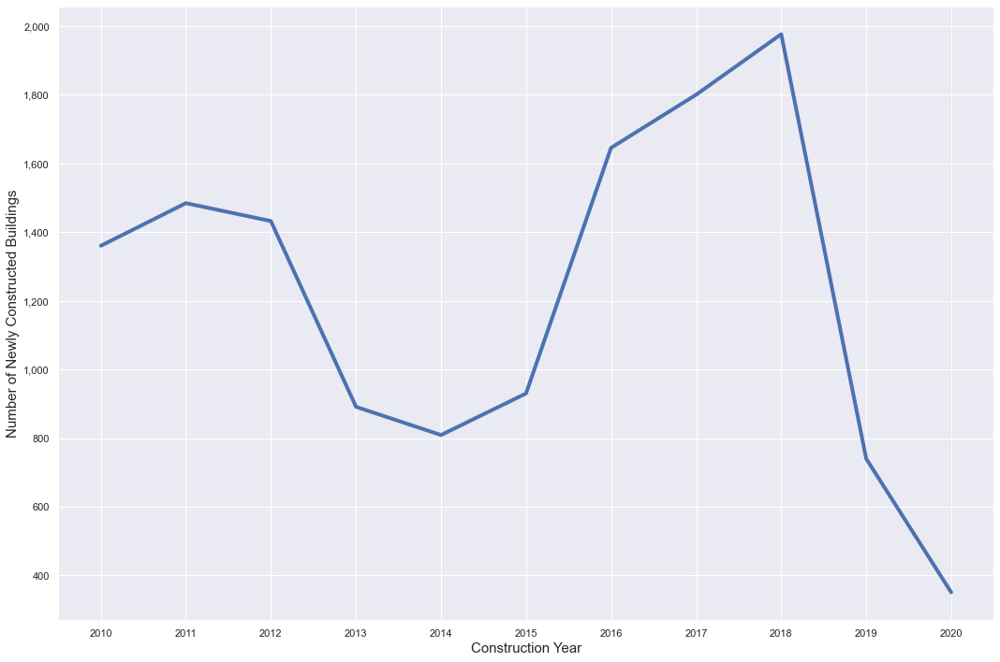

In [152]:
fig, ax = plt.subplots(figsize=(15,10))

# plotting bar chart of number of claims by year
ax.plot(g['count'], 
        linewidth=4)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-1-b')

In [153]:
table = pd.pivot_table(building_footprints, 
                       values='DOITT_ID', 
                       index=['CNSTRCT_YR'], 
                       columns = ['borough'], 
                       aggfunc=pd.Series.nunique)

table.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)
table.index = table.index.astype('int64')
table.index = pd.to_datetime(table.index, format='%Y')

table.index.dtype

dtype('<M8[ns]')

In [154]:
table.head()

borough,BK,BX,MN,QN,SI
2010-01-01,252,141,57,567,343
2011-01-01,267,98,42,627,450
2012-01-01,421,73,57,503,378
2013-01-01,256,50,59,345,181
2014-01-01,145,78,19,309,258


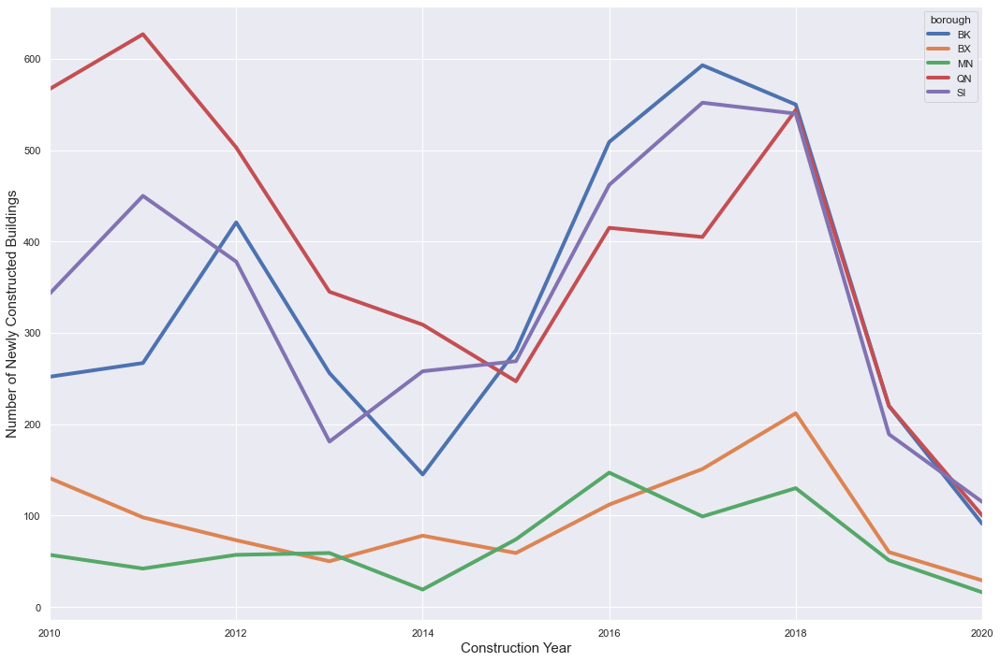

In [155]:
fig, ax = plt.subplots(figsize=(15,10))

table.plot(ax=ax, 
           linewidth=4)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-1-c')

In [156]:
table_cumsum = table.cumsum()
table_cumsum.head()

borough,BK,BX,MN,QN,SI
2010-01-01,252,141,57,567,343
2011-01-01,519,239,99,1194,793
2012-01-01,940,312,156,1697,1171
2013-01-01,1196,362,215,2042,1352
2014-01-01,1341,440,234,2351,1610


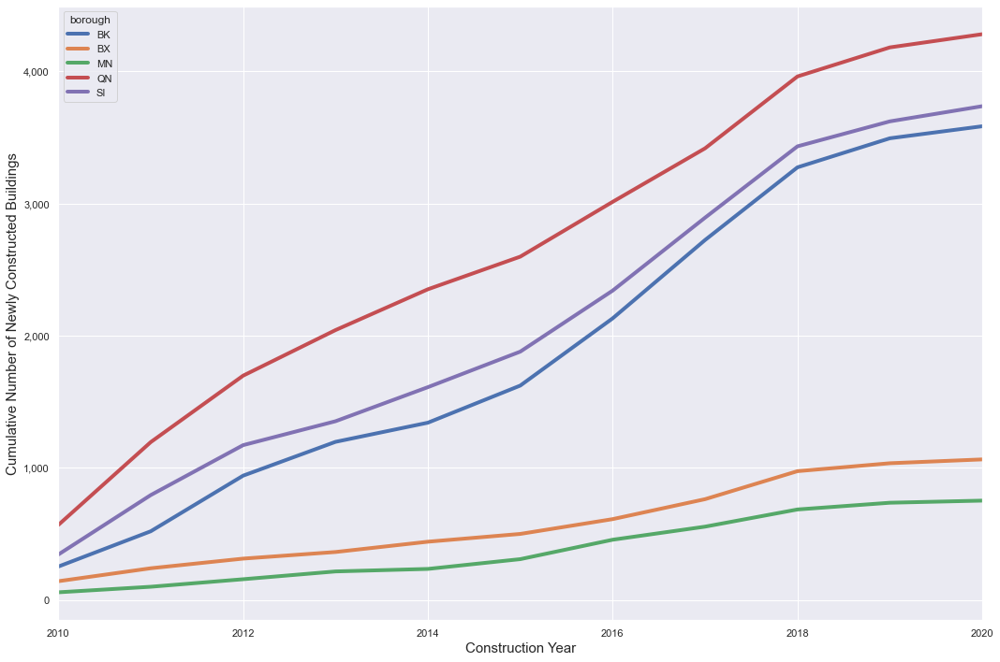

In [157]:
fig, ax = plt.subplots(figsize=(15,10))

table_cumsum.plot(ax=ax, 
                  linewidth=4)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Cumulative Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-1-d')

## Bar Plot

In [158]:
bar = building_footprints.groupby('borough')['DOITT_ID'].count()
bar.rename("count", inplace=True)
bar.sort_values(ascending=False, inplace=True)
bar

borough
QN    4282
SI    3737
BK    3585
BX    1063
MN     751
Name: count, dtype: int64

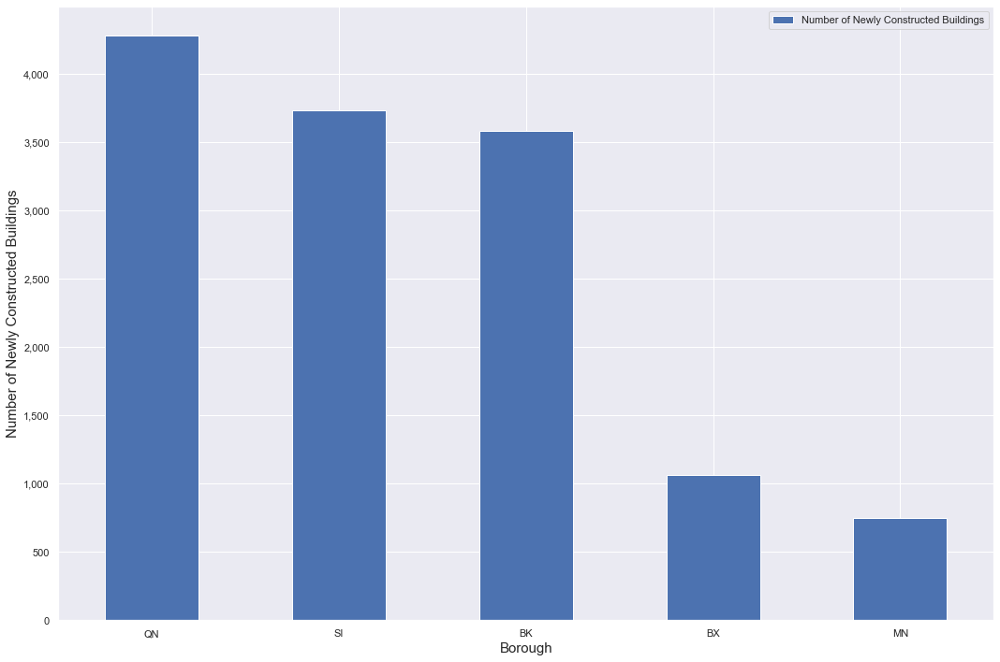

In [159]:
fig, ax = plt.subplots(figsize=(15,10))

bar.plot(kind='bar', 
         ax=ax, 
         label='Number of Newly Constructed Buildings')

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.legend()
plt.xlabel('Borough', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-2-a')

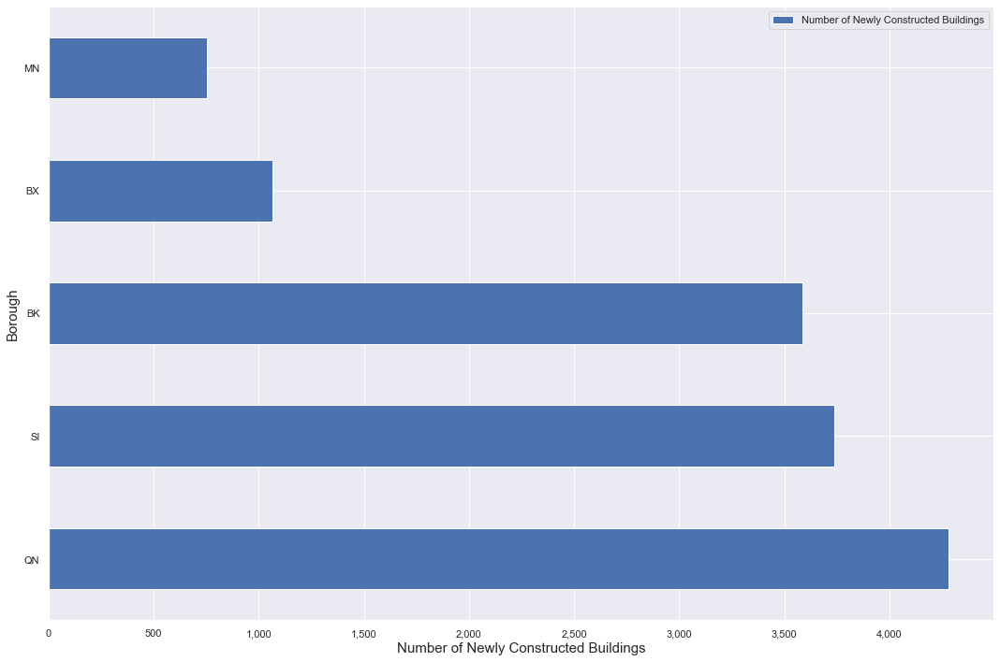

In [160]:
fig, ax = plt.subplots(figsize=(15,10))

bar.plot.barh(ax=ax, 
              label='Number of Newly Constructed Buildings')


# formatting Y axis with comma
ax.get_xaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.legend()
plt.xlabel('Number of Newly Constructed Buildings', fontsize=15)
plt.ylabel('Borough', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-2-b')

In [161]:
table = building_footprints[building_footprints['CNSTRCT_YR'].between(2000, 2020)]


table = pd.pivot_table(table, 
                       values='DOITT_ID', 
                       index=['CNSTRCT_YR'], 
                       columns = ['borough'], 
                       aggfunc=pd.Series.nunique)

table.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)
table.index = table.index.astype('int64')

table.index.dtype

dtype('int64')

In [162]:
table.head()

borough,BK,BX,MN,QN,SI
2010,252,141,57,567,343
2011,267,98,42,627,450
2012,421,73,57,503,378
2013,256,50,59,345,181
2014,145,78,19,309,258


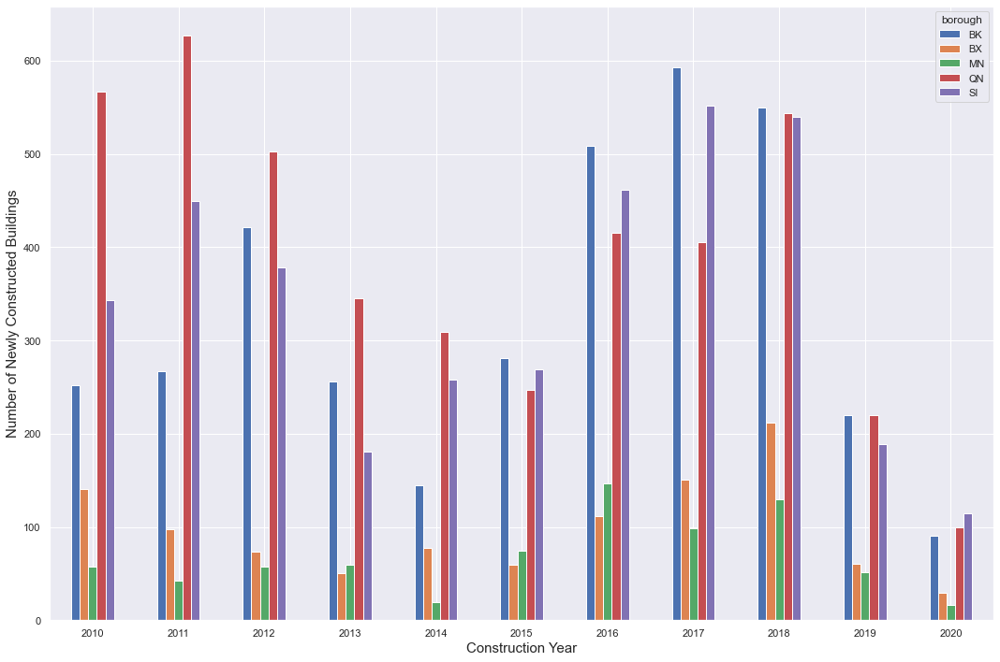

In [163]:
fig, ax = plt.subplots(figsize=(15,10))

table.plot(kind='bar', 
           ax=ax)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-2-c')

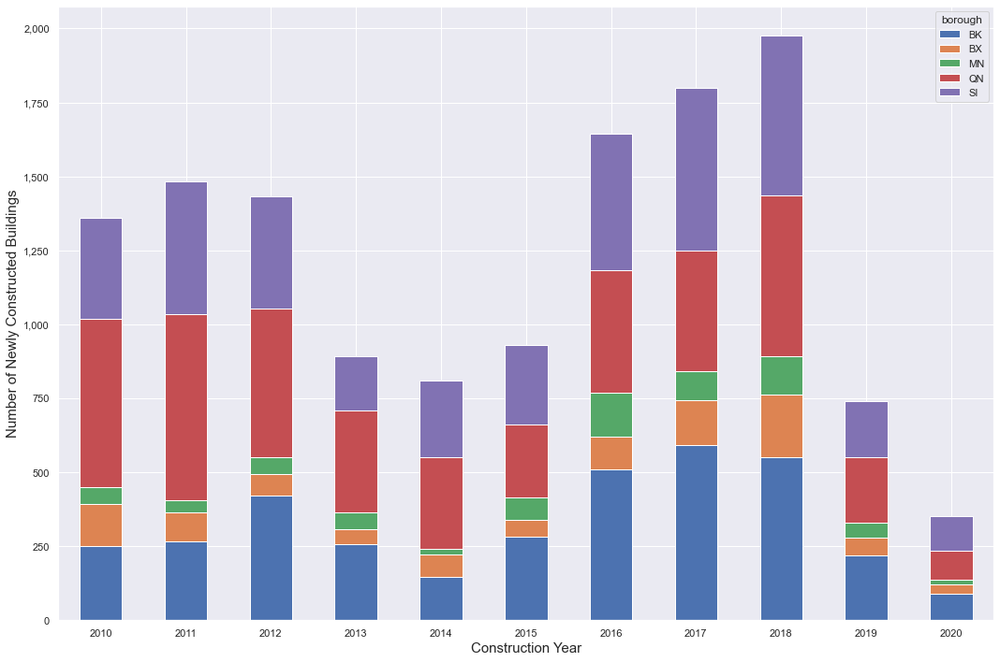

In [164]:
fig, ax = plt.subplots(figsize=(15,10))

table.plot.bar(stacked=True, 
               ax=ax)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-2-d')

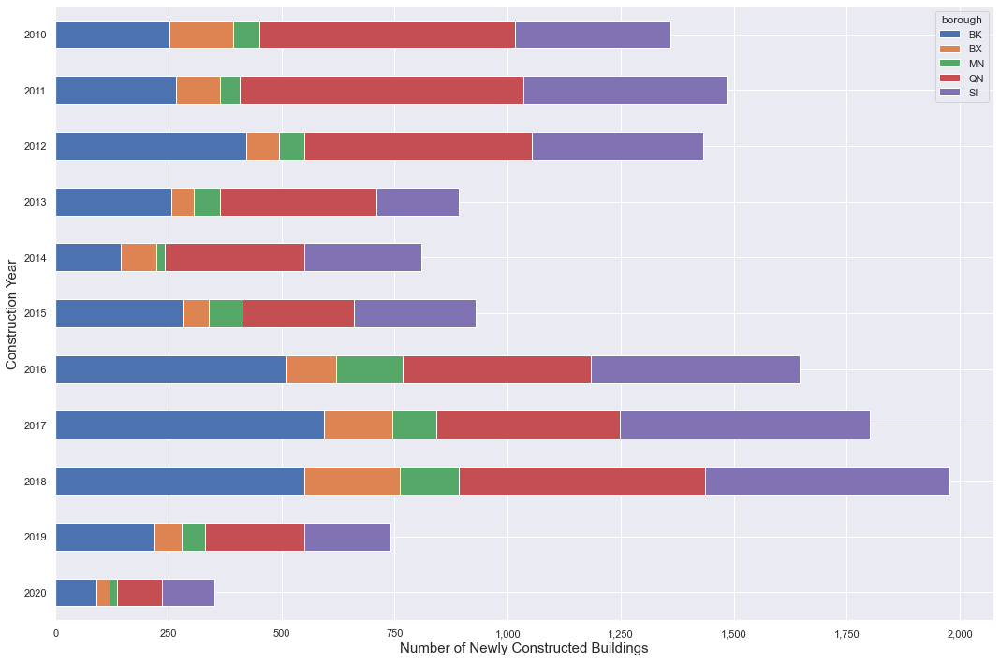

In [165]:
fig, ax = plt.subplots(figsize=(15,10))

table.sort_index(ascending=False).plot.barh(stacked=True, 
                                            ax=ax)

# formatting Y axis with comma
ax.get_xaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Number of Newly Constructed Buildings', fontsize=15)
plt.ylabel('Construction Year', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-2-e')

## Histograms

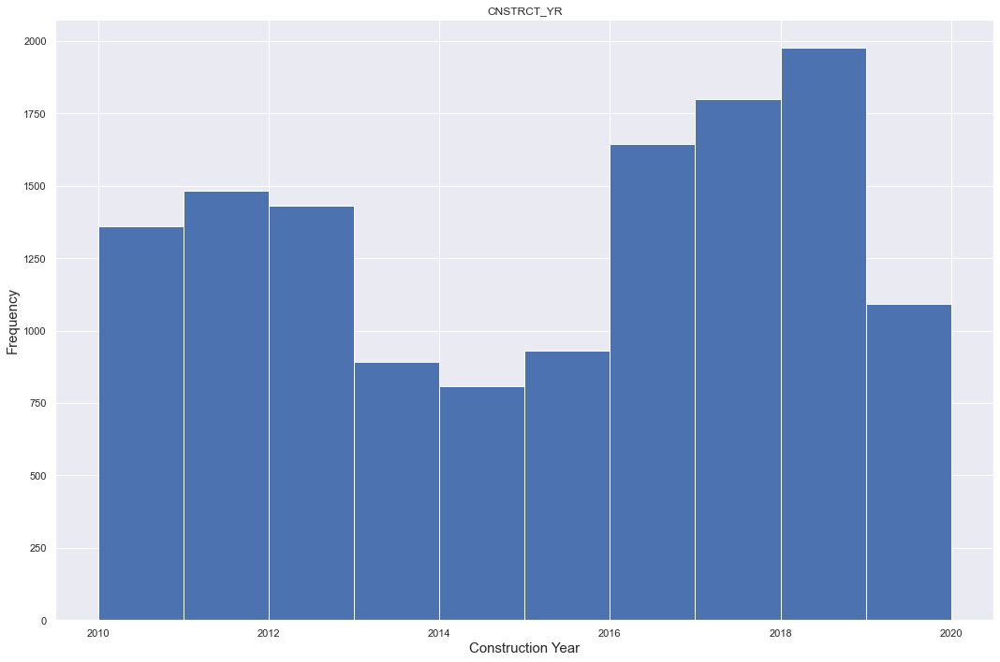

In [166]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints.hist(ax=ax, 
                         column='CNSTRCT_YR')

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-3-a')

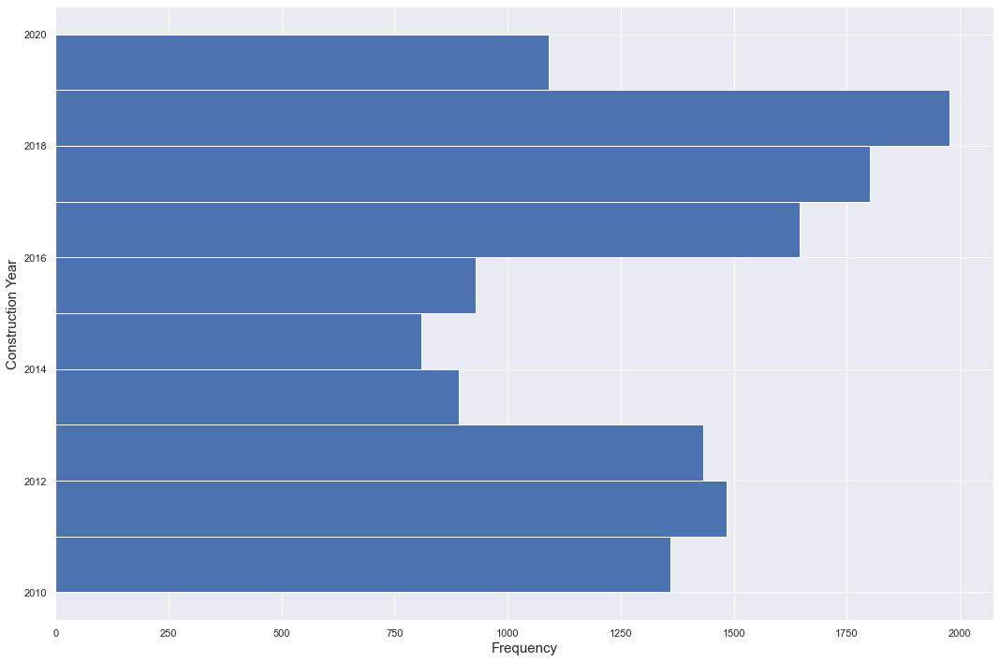

In [167]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints['CNSTRCT_YR'].plot.hist(orientation='horizontal', 
                                            cumulative=False)

plt.xlabel('Frequency', fontsize=15)
plt.ylabel('Construction Year', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-3-b')

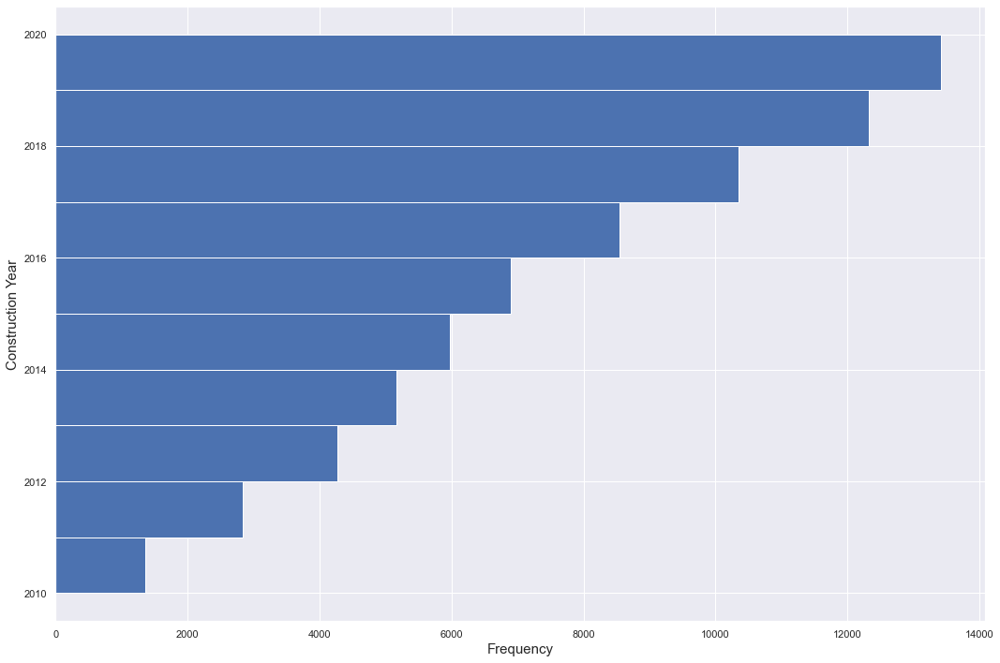

In [168]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints['CNSTRCT_YR'].plot.hist(orientation='horizontal', 
                                            cumulative=True)

plt.xlabel('Frequency', fontsize=15)
plt.ylabel('Construction Year', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-3-c')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/hist.py:377: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  **kwds,
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attrib

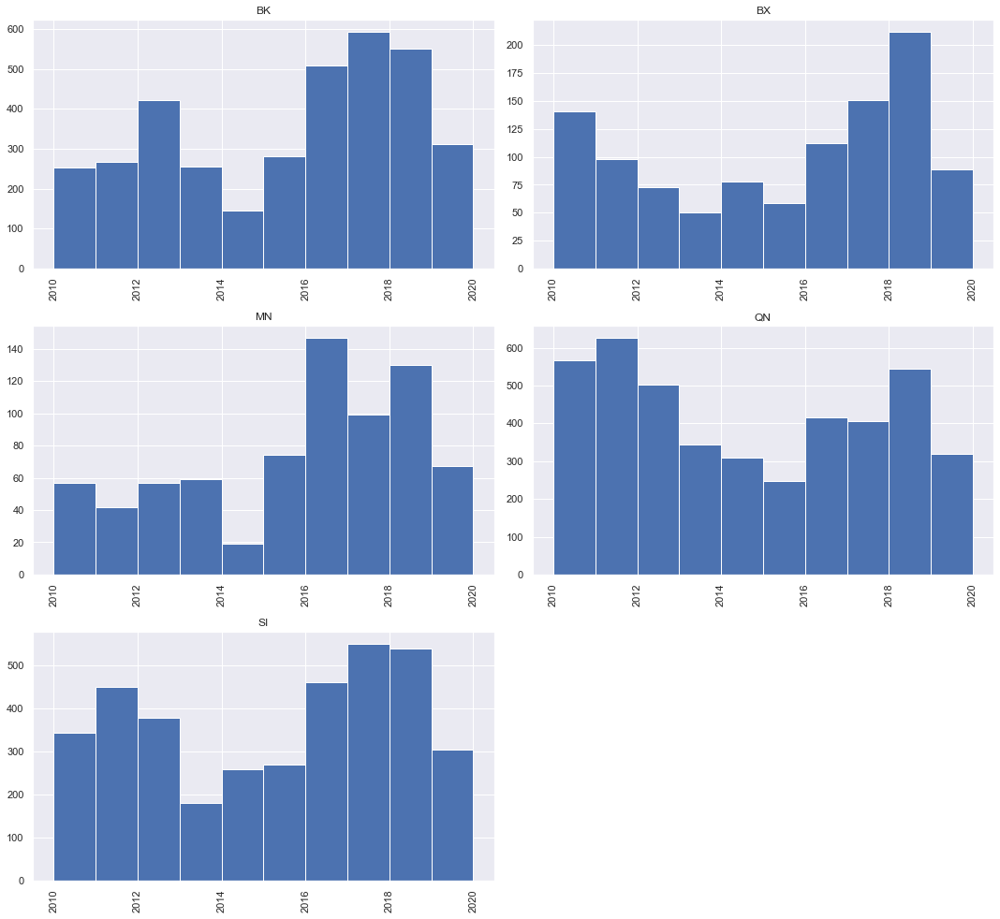

In [169]:
fig, ax = plt.subplots(figsize=(15,15))

building_footprints.hist(ax=ax, 
                         column='CNSTRCT_YR', 
                         by='borough')

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('figures/4-3-d')

In [170]:
mn = building_footprints.loc[(building_footprints['borough'].isin(["MN"]))]
bk = building_footprints.loc[(building_footprints['borough'].isin(["BK"]))]
bx = building_footprints.loc[(building_footprints['borough'].isin(["BX"]))]
qn = building_footprints.loc[(building_footprints['borough'].isin(["QN"]))]
si = building_footprints.loc[(building_footprints['borough'].isin(["SI"]))]

mn = mn['CNSTRCT_YR']
mn.rename('MN', inplace=True)

bk = bk['CNSTRCT_YR']
bk.rename('BK', inplace=True)

bx = bx['CNSTRCT_YR']
bx.rename('BX', inplace=True)

qn = qn['CNSTRCT_YR']
qn.rename('QN', inplace=True)

si = si['CNSTRCT_YR']
si.rename('SI', inplace=True)

8390       2016.0
8539       2010.0
8563       2010.0
13204      2011.0
13205      2011.0
            ...  
1083565    2020.0
1083571    2020.0
1083572    2020.0
1083595    2020.0
1083605    2019.0
Name: SI, Length: 3737, dtype: float64

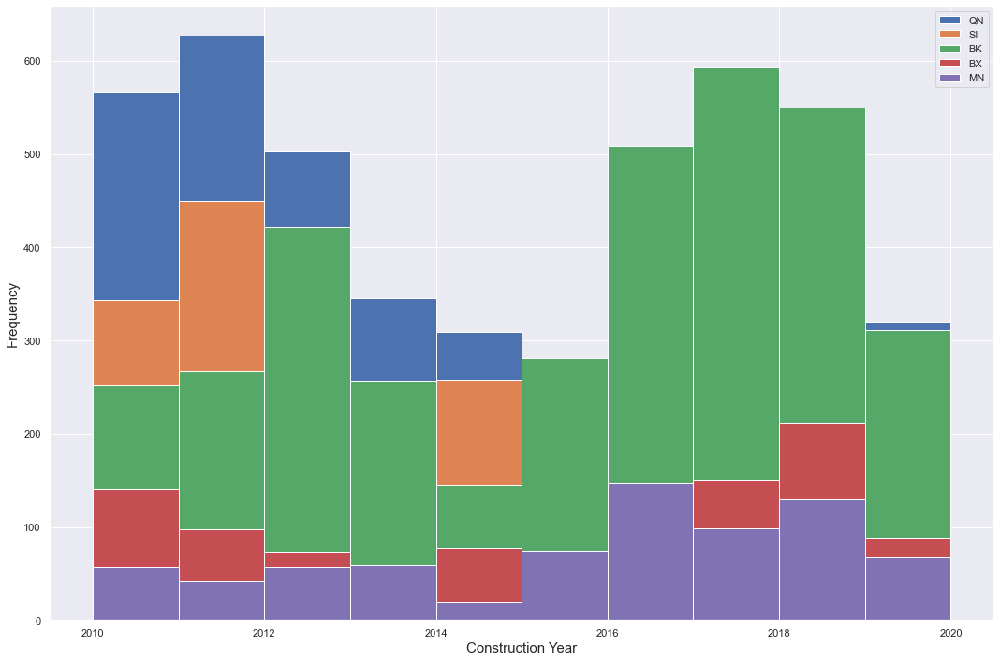

In [171]:
fig, ax = plt.subplots(figsize=(15,10))

qn.plot.hist(ax=ax)
si.plot.hist(ax=ax)
bk.plot.hist(ax=ax)
bx.plot.hist(ax=ax)
mn.plot.hist(ax=ax)

plt.legend()
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-3-e')

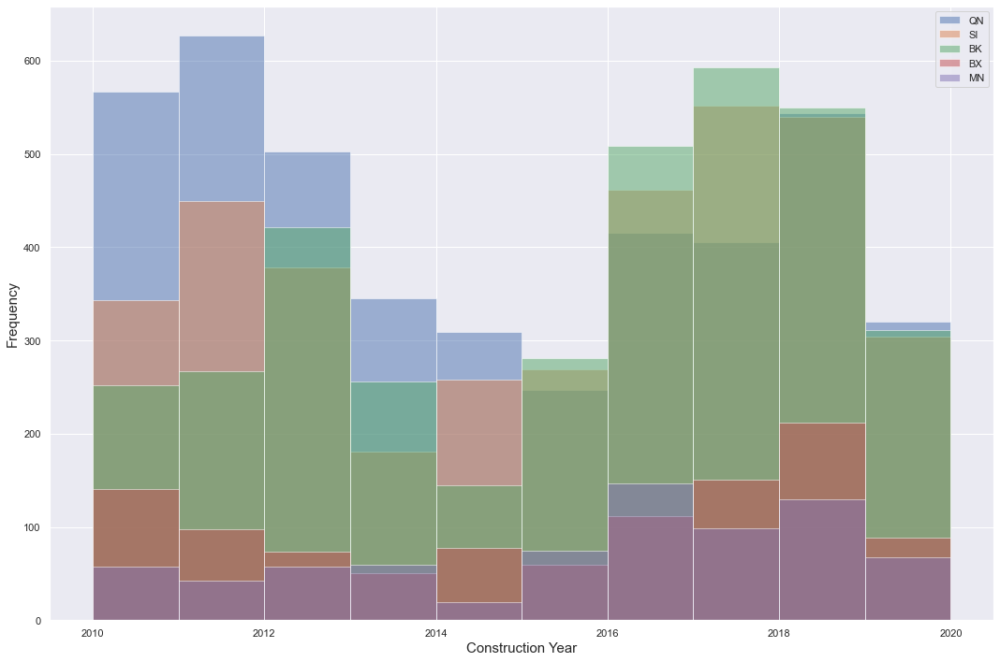

In [172]:
fig, ax = plt.subplots(figsize=(15,10))

qn.plot.hist(ax=ax, alpha=0.5)
si.plot.hist(ax=ax, alpha=0.5)
bk.plot.hist(ax=ax, alpha=0.5)
bx.plot.hist(ax=ax, alpha=0.5)
mn.plot.hist(ax=ax, alpha=0.5)

plt.legend()
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-3-f')

## Box Plot 

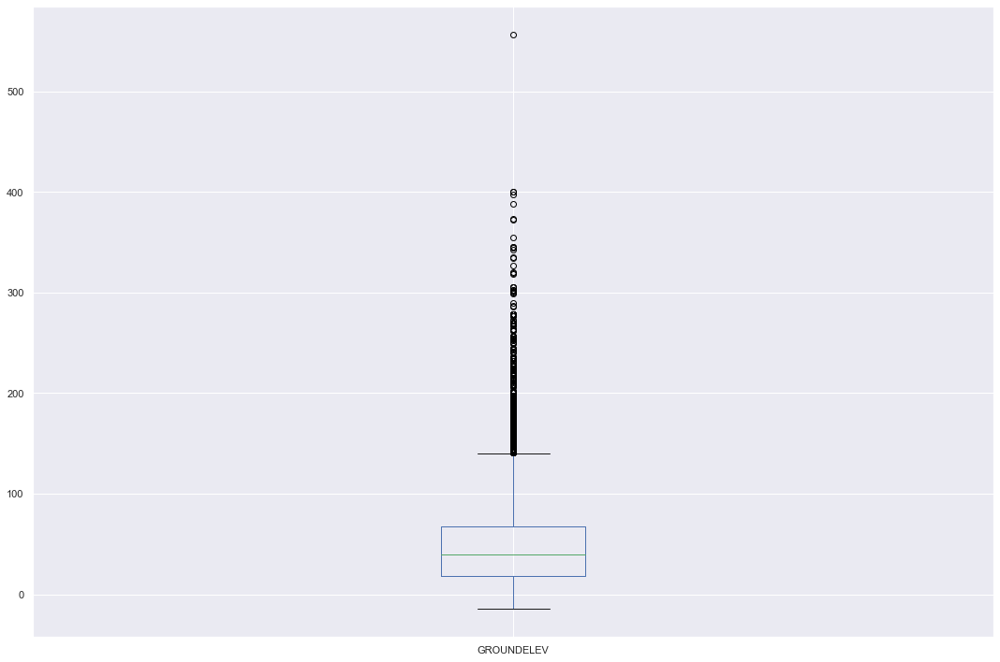

In [173]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints['GROUNDELEV'].plot.box(ax=ax)
plt.tight_layout()
plt.savefig('figures/4-4-a')

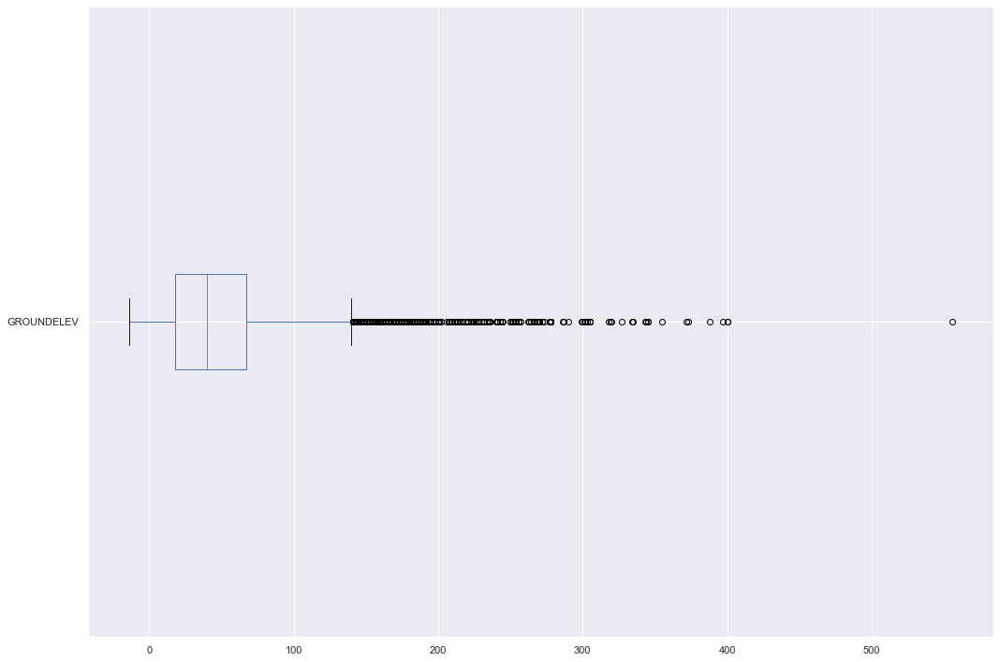

In [174]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints['GROUNDELEV'].plot.box(vert=False, ax=ax)
plt.tight_layout()
plt.savefig('figures/4-4-b')

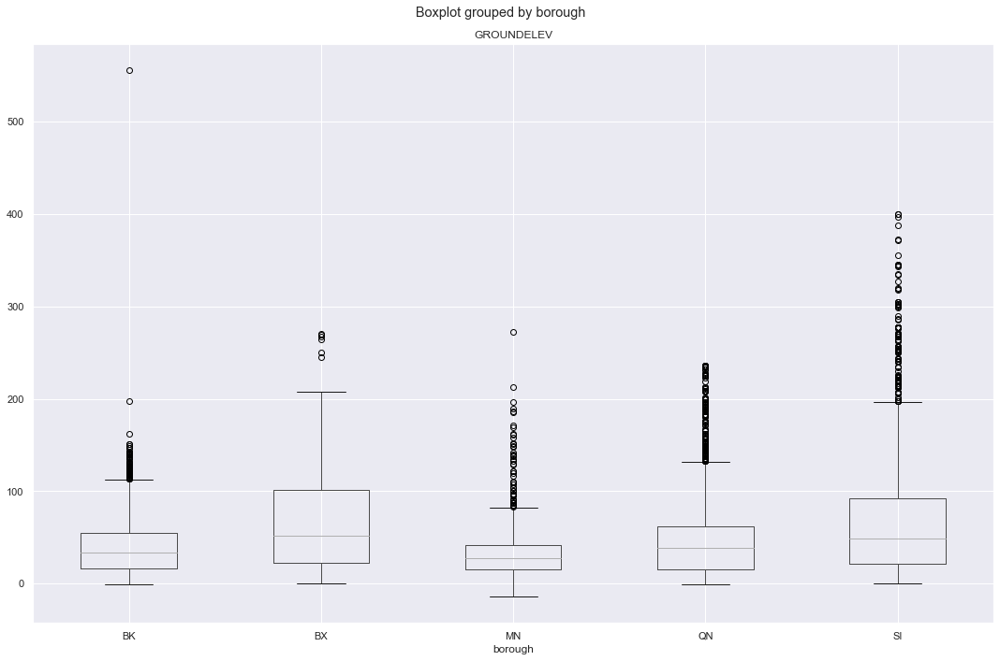

In [175]:
building_footprints_box = building_footprints[['borough', 'GROUNDELEV']]

fig, ax = plt.subplots(figsize=(15,10))

building_footprints_box.boxplot(by='borough', ax=ax)

plt.xlabel('borough')
plt.tight_layout()
plt.savefig('figures/4-4-c')

## Kernel Density Estimate Plot

In [176]:
building_footprints.head()

,NAME,the_geom,CNSTRCT_YR,BIN,LSTMODDATE,LSTSTATYPE,DOITT_ID,HEIGHTROOF,FEAT_CODE,GROUNDELEV,...,tract2010,xcoord,ycoord,latitude,longitude,plutomapid,sanitdistrict,healthcenterdistrict,firm07_flag,pfirm15_flag
526,NaN,MULTIPOLYGON (((-73.8865806294611 40.765213774...,2016.0,4519592,08/22/2017 12:00:00 AM +0000,Constructed,1067231,12.03,2100.0,26.0,...,329.0,1015694.0,218073.0,40.765180,-73.886488,1,3.0,42.0,0.0,0.0
527,NaN,MULTIPOLYGON (((-73.88641411390677 40.76522103...,2016.0,4023525,08/22/2017 12:00:00 AM +0000,Constructed,1002480,23.32,2100.0,25.0,...,329.0,1015694.0,218073.0,40.765180,-73.886488,1,3.0,42.0,0.0,0.0
528,NaN,MULTIPOLYGON (((-73.98406915139554 40.75857096...,2013.0,1022662,08/22/2017 12:00:00 AM +0000,Constructed,633694,76.93,2100.0,49.0,...,125.0,988630.0,215602.0,40.758453,-73.984190,1,5.0,15.0,0.0,0.0
804,NaN,MULTIPOLYGON (((-73.9480784709042 40.754493402...,2018.0,4619885,08/16/2019 12:00:00 AM +0000,Constructed,1289114,NaN,2100.0,17.0,...,25.0,998938.0,214687.0,40.755930,-73.946984,1,1.0,41.0,0.0,0.0
810,NaN,MULTIPOLYGON (((-73.94658847268306 40.75385966...,2018.0,4619888,11/15/2019 12:00:00 AM +0000,Constructed,1289116,NaN,2100.0,19.0,...,25.0,998938.0,214687.0,40.755930,-73.946984,1,1.0,41.0,0.0,0.0


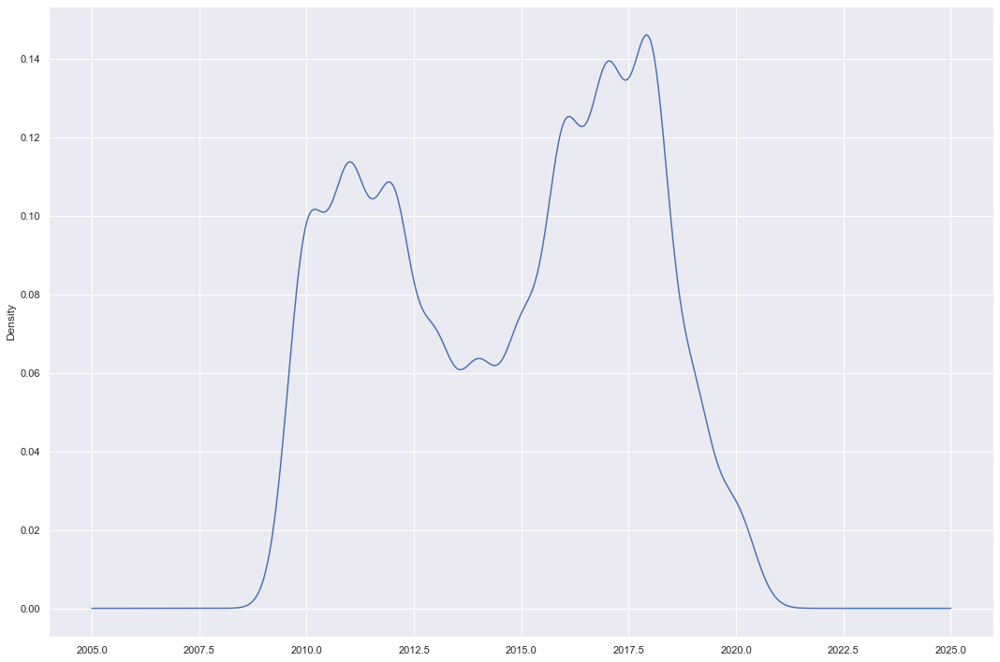

In [177]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints['CNSTRCT_YR'].plot.kde(ax=ax)

plt.tight_layout()
plt.savefig('figures/4-5-a')

## Area Plot

In [178]:
area = pd.pivot_table(building_footprints, 
                      values='DOITT_ID', 
                      index=['CNSTRCT_YR'], 
                      columns = ['borough'], 
                      aggfunc=pd.Series.nunique)

area.rename({'DOITT_ID': 'count'}, axis=1, inplace=True)
area.index = area.index.astype('int64')
area.index = pd.to_datetime(area.index, format='%Y')
                             
area.head()

borough,BK,BX,MN,QN,SI
2010-01-01,252,141,57,567,343
2011-01-01,267,98,42,627,450
2012-01-01,421,73,57,503,378
2013-01-01,256,50,59,345,181
2014-01-01,145,78,19,309,258


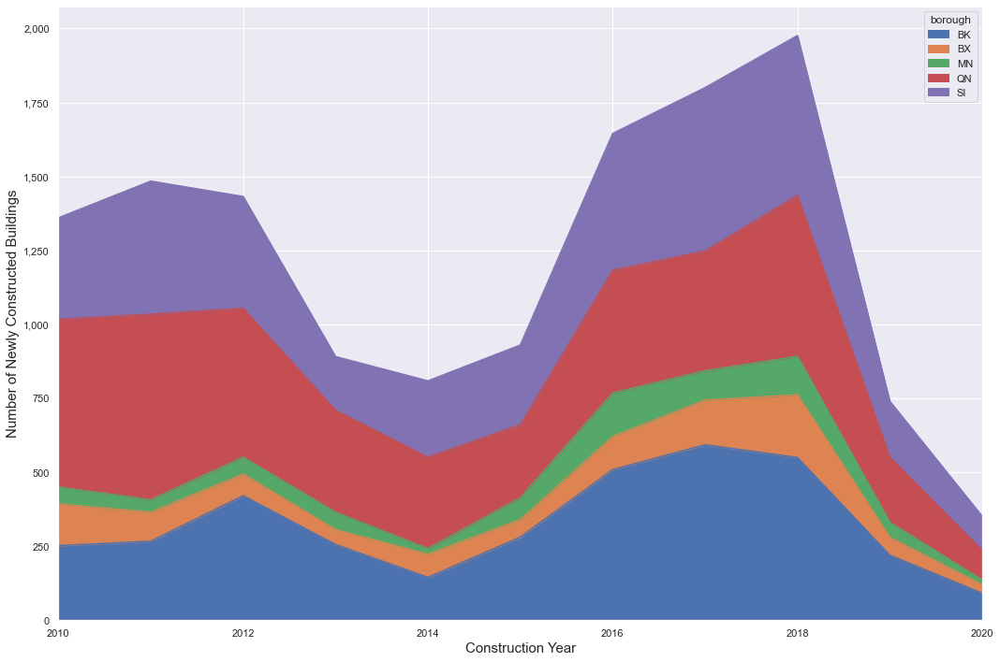

In [179]:
fig, ax = plt.subplots(figsize=(15,10))

area.plot.area(ax=ax)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-6-a')

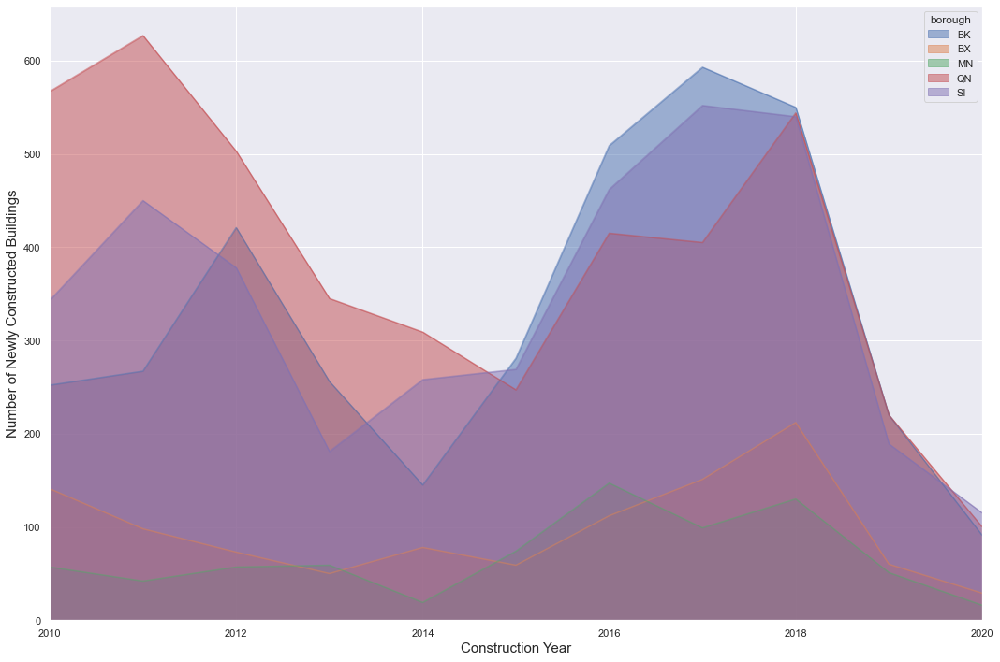

In [180]:
fig, ax = plt.subplots(figsize=(15,10))

area.plot.area(ax=ax, stacked=False)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-6-b')

In [181]:
area_cumsum = area.cumsum()
area_cumsum.head()

borough,BK,BX,MN,QN,SI
2010-01-01,252,141,57,567,343
2011-01-01,519,239,99,1194,793
2012-01-01,940,312,156,1697,1171
2013-01-01,1196,362,215,2042,1352
2014-01-01,1341,440,234,2351,1610


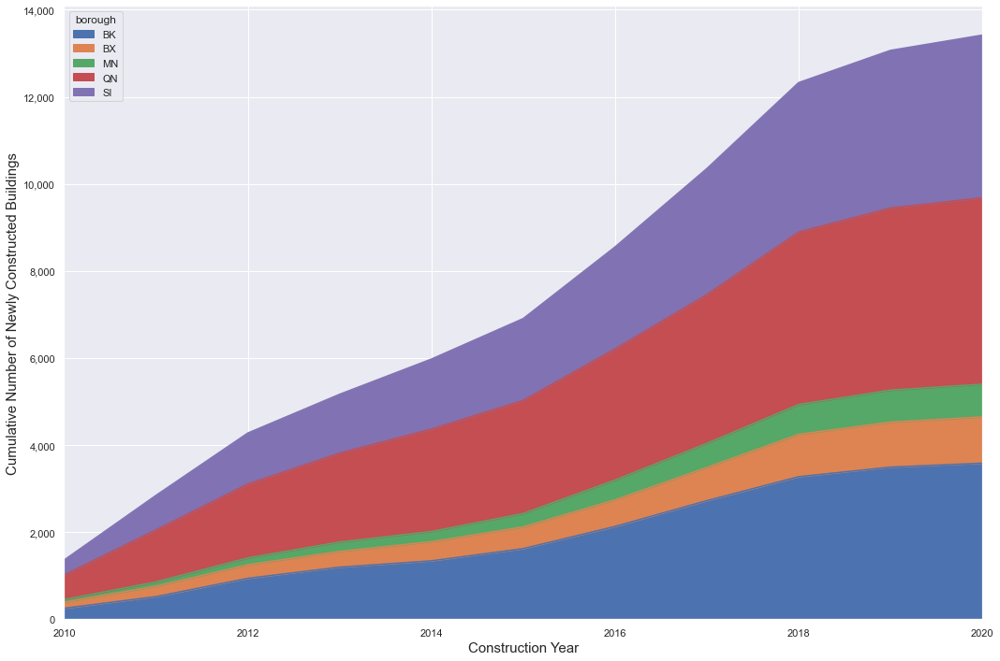

In [182]:
fig, ax = plt.subplots(figsize=(15,10))

area_cumsum.plot.area(ax=ax)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Cumulative Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-6-c')

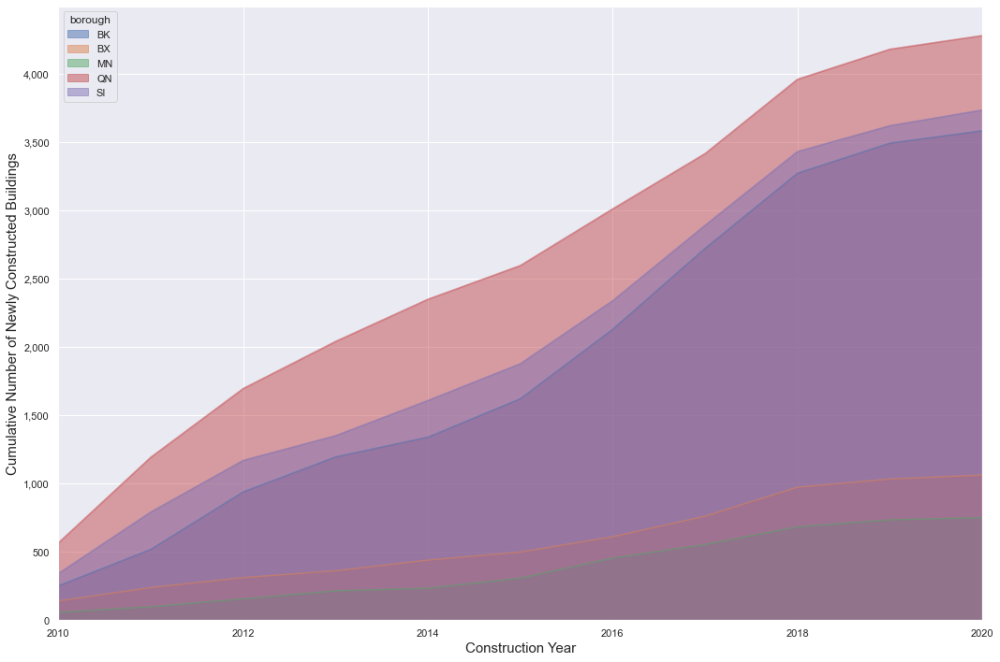

In [183]:
fig, ax = plt.subplots(figsize=(15,10))

area_cumsum.plot.area(ax=ax, stacked=False)

# formatting Y axis with comma
ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.xlabel('Construction Year', fontsize=15)
plt.ylabel('Cumulative Number of Newly Constructed Buildings', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-6-d')

## Scatter Plot

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


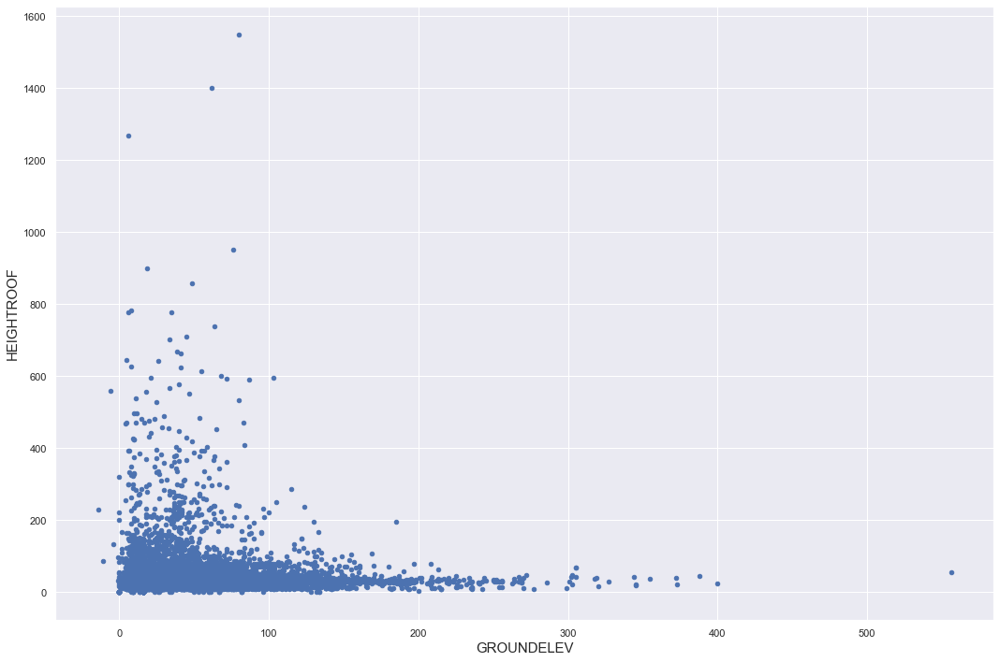

In [184]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints.plot.scatter(x='GROUNDELEV', 
                                 y='HEIGHTROOF', 
                                 ax=ax)

plt.xlabel('GROUNDELEV', fontsize=15)
plt.ylabel('HEIGHTROOF', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-7-a')

In [185]:
mn = building_footprints.loc[(building_footprints['borough'].isin(["MN"]))]
bk = building_footprints.loc[(building_footprints['borough'].isin(["BK"]))]
bx = building_footprints.loc[(building_footprints['borough'].isin(["BX"]))]
qn = building_footprints.loc[(building_footprints['borough'].isin(["QN"]))]
si = building_footprints.loc[(building_footprints['borough'].isin(["SI"]))]

mn = mn[['GROUNDELEV', 'HEIGHTROOF']]
bk = bk[['GROUNDELEV', 'HEIGHTROOF']]
bx = bx[['GROUNDELEV', 'HEIGHTROOF']]
qn = qn[['GROUNDELEV', 'HEIGHTROOF']]
si = si[['GROUNDELEV', 'HEIGHTROOF']]

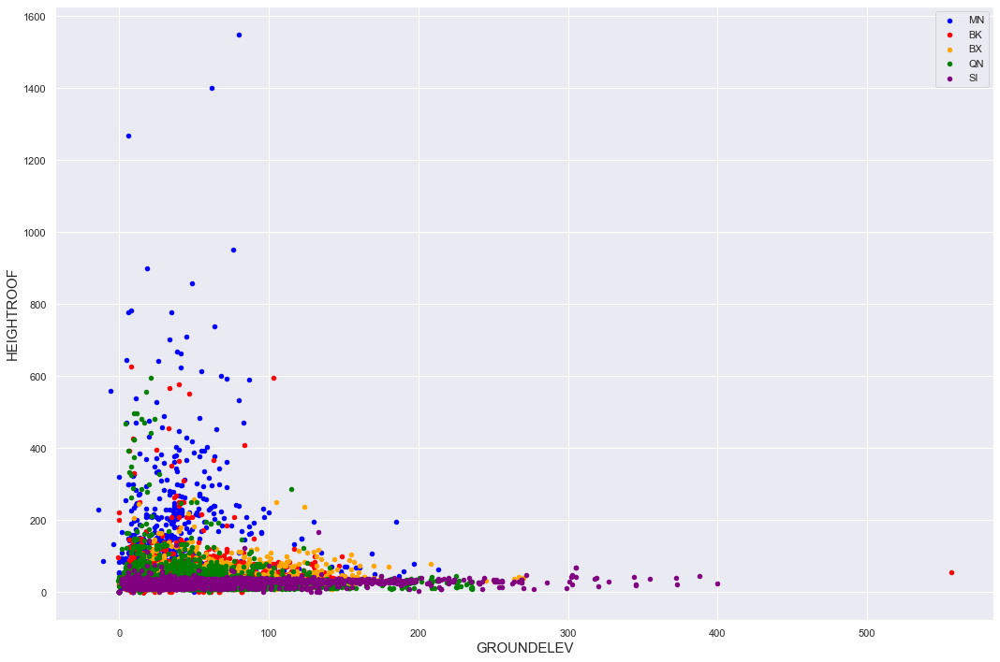

In [186]:
fig, ax = plt.subplots(figsize=(15,10))

mn.plot.scatter(x='GROUNDELEV', y='HEIGHTROOF', color='blue', label='MN', ax=ax)
bk.plot.scatter(x='GROUNDELEV', y='HEIGHTROOF', color='red', label='BK', ax=ax)
bx.plot.scatter(x='GROUNDELEV', y='HEIGHTROOF', color='orange', label='BX', ax=ax)
qn.plot.scatter(x='GROUNDELEV', y='HEIGHTROOF', color='green', label='QN', ax=ax)
si.plot.scatter(x='GROUNDELEV', y='HEIGHTROOF', color='purple', label='SI', ax=ax)

plt.xlabel('GROUNDELEV', fontsize=15)
plt.ylabel('HEIGHTROOF', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-7-b')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

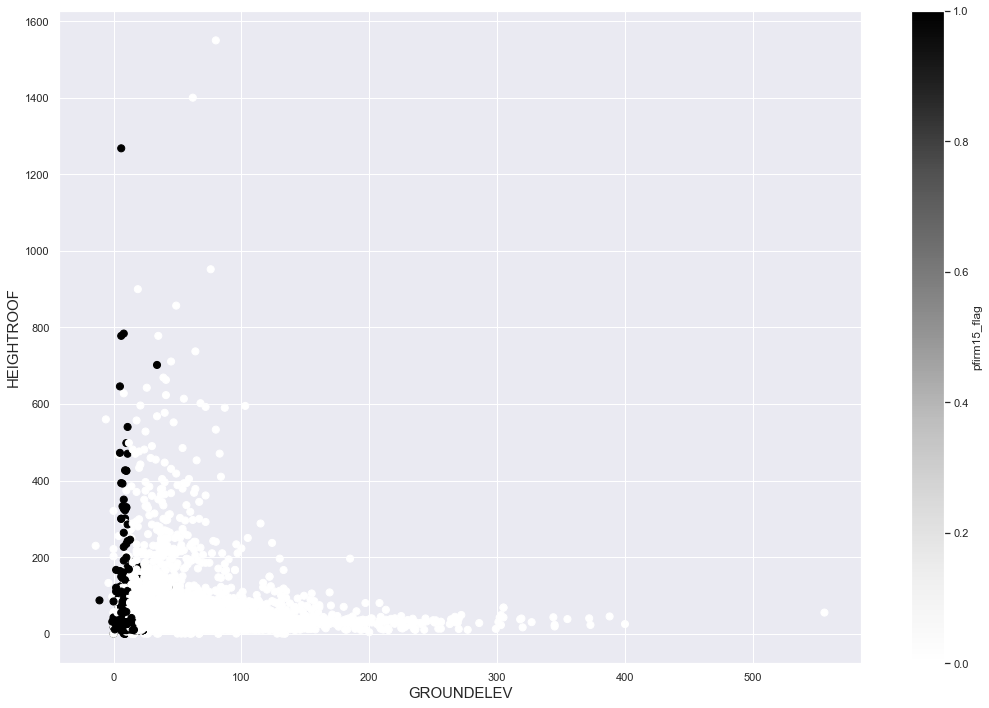

In [187]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints.plot.scatter(x='GROUNDELEV', 
                                 y='HEIGHTROOF', 
                                 c='pfirm15_flag', 
                                 s=50, 
                                 ax=ax)

plt.xlabel('GROUNDELEV', fontsize=15)
plt.ylabel('HEIGHTROOF', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-7-c')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


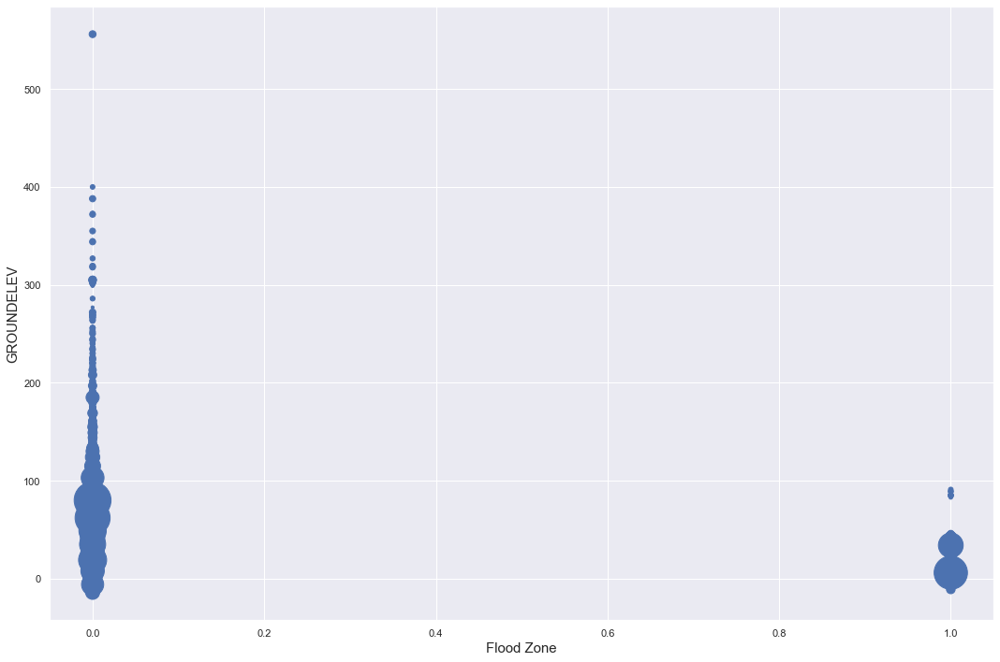

In [188]:
fig, ax = plt.subplots(figsize=(15,10))

building_footprints.plot.scatter(x='pfirm15_flag', 
                                 y='GROUNDELEV', 
                                 s=building_footprints['HEIGHTROOF'], 
                                 ax=ax)

plt.xlabel('Flood Zone', fontsize=15)
plt.ylabel('GROUNDELEV', fontsize=15)
plt.tight_layout()
plt.savefig('figures/4-7-d')

## Hexagonal Bin Plot

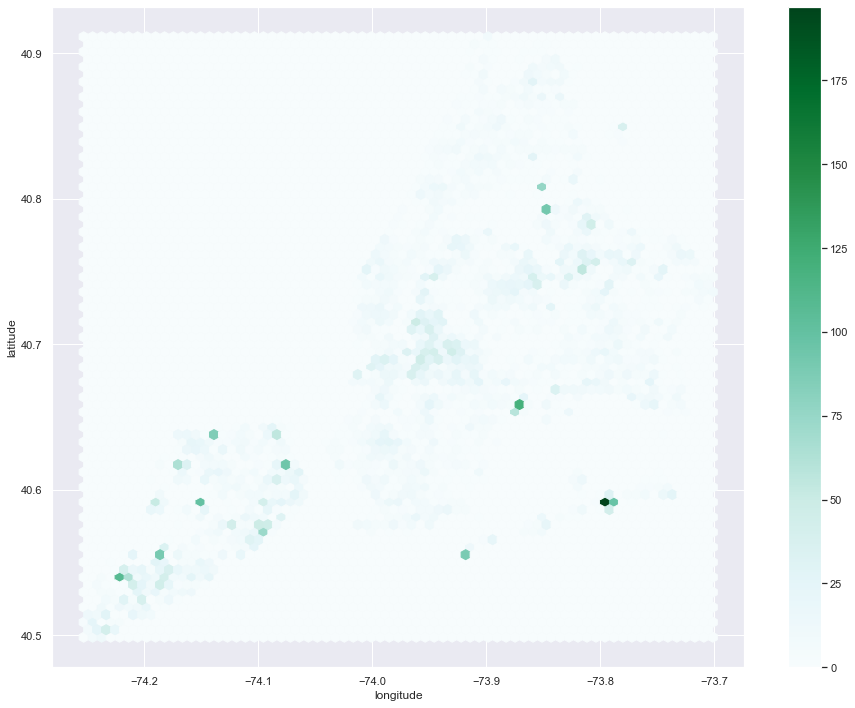

In [189]:
fig, ax = plt.subplots(figsize=(13,10))

building_footprints.plot.hexbin(x='longitude', 
                                y='latitude', 
                                gridsize=70, 
                                ax=ax)
plt.tight_layout()
plt.savefig('figures/4-8-a')

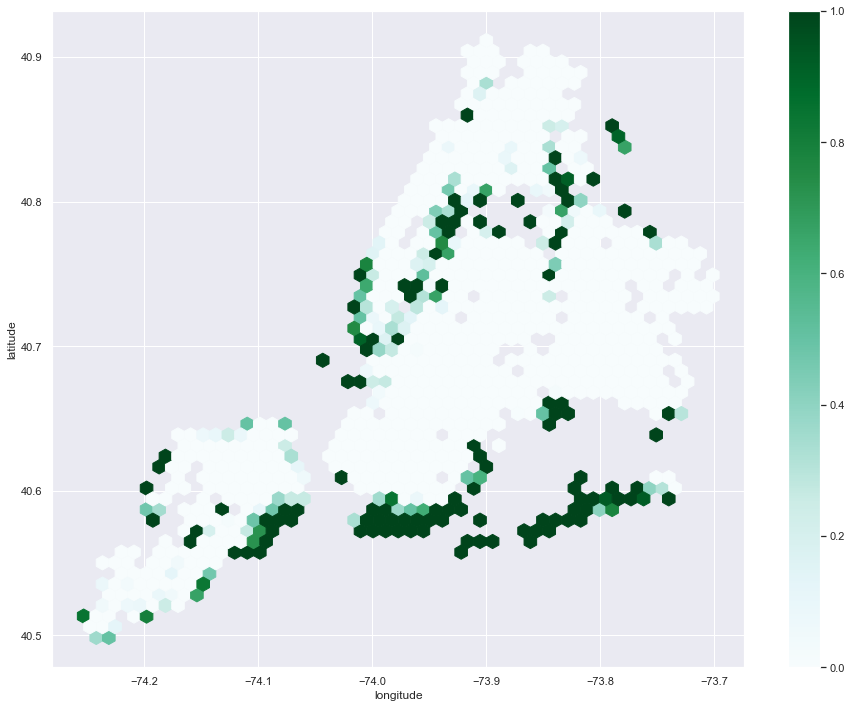

In [190]:
fig, ax = plt.subplots(figsize=(13,10))

building_footprints.plot.hexbin(x='longitude', 
                                y='latitude', 
                                C='pfirm15_flag', 
                                gridsize=50, 
                                ax=ax)
plt.tight_layout()
plt.savefig('figures/4-8-b')

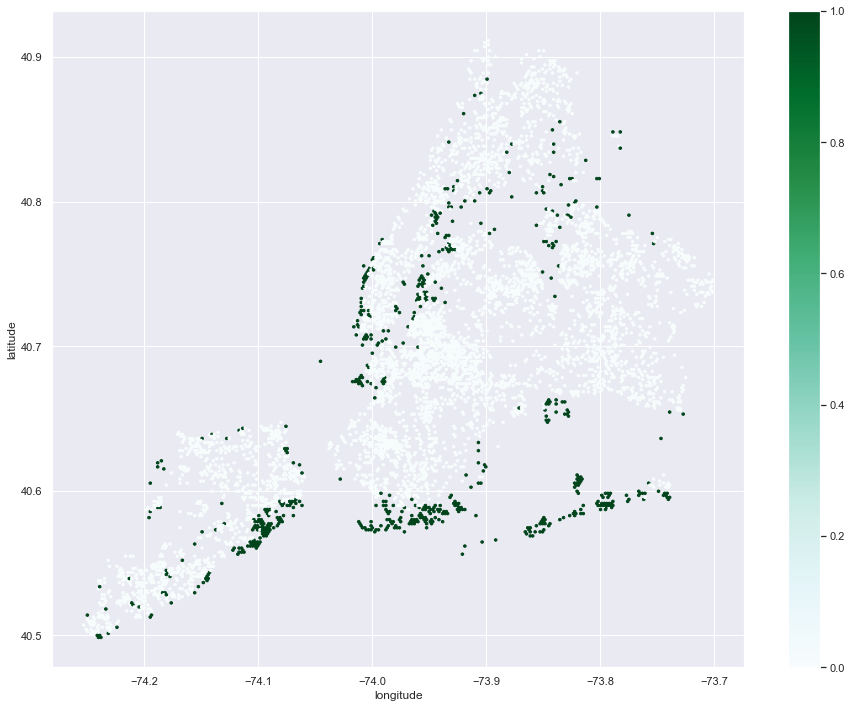

In [191]:
fig, ax = plt.subplots(figsize=(13,10))

building_footprints.plot.hexbin(x='longitude', 
                                y='latitude', 
                                C='pfirm15_flag', 
                                reduce_C_function=np.max, 
                                gridsize=255, 
                                ax=ax)
plt.tight_layout()
plt.savefig('figures/4-8-c')

## Pie Plot

In [192]:
pie = building_footprints.groupby('borough')['DOITT_ID'].count()
pie.rename("count", inplace=True)
pie.sort_values(ascending=False, inplace=True)
pie

borough
QN    4282
SI    3737
BK    3585
BX    1063
MN     751
Name: count, dtype: int64

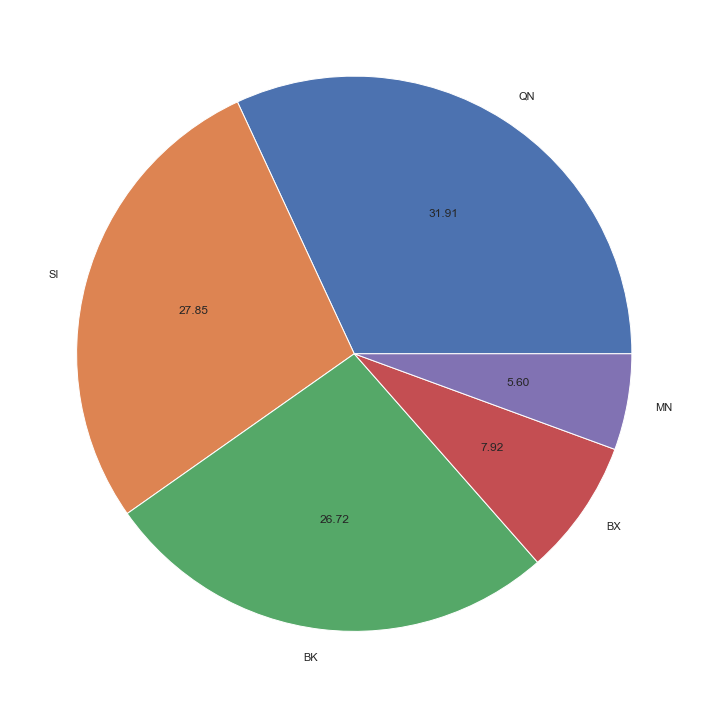

In [193]:
ax = pie.plot.pie(figsize=(15,10), 
                  autopct='%.2f') 

ax.axes.get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('figures/4-9-a')

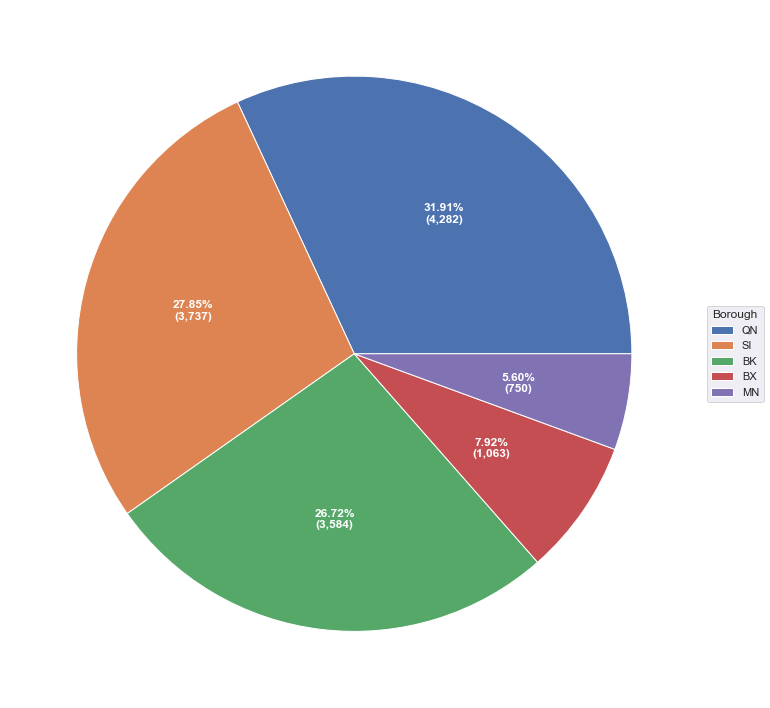

In [194]:
fig, ax = plt.subplots(figsize=(15, 10), subplot_kw=dict(aspect="equal"))

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.2f}%\n({:,})".format(pct, absolute)

wedges, texts, autotexts = ax.pie(pie, 
                                  autopct=lambda pct: func(pct, pie),
                                  textprops=dict(color="w"))

ax.legend(wedges, 
          pie.index,
          title="Borough",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1)) 

plt.setp(autotexts, size=12, weight="bold")
plt.tight_layout()
plt.savefig('figures/4-9-b')

# 5. Conclusion

In this notebook, we reviewed various types of plots and visualizations using the Python libraries seaborn and pandas, both built on top of the library matplotlib. In Part IV, we will demonstrate how to work with geospatial data and create various types of maps with the Python library geopandas.